## This notebook is purely made to conduct analyses in. The code is commented, but, in general, explanation, conclusions and context is given in the report that belongs to this notebook.

In [1]:
# Import required Python packages and modules
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from shapely.wkt import loads
import geopandas as gpd
import warnings
import scipy.stats as stats
import random
# Set the random seed
seed = 44
random.seed(seed)
np.random.seed(seed)

# Loading data

In [2]:
geoworld_originref = pd.read_csv('geoworld_originref.csv')
# Convert the 'geometry' column from WKT back to geometries
geoworld_originref['geometry'] = geoworld_originref['geometry'].apply(loads)
geoworld_originref = gpd.GeoDataFrame(geoworld_originref, geometry='geometry',crs="EPSG:4326")
geoworld_originref

,Country,Code,Year,#refugees_origin,W,E,V,S,C,A,...,AI_04a_Base,AI_04b_Norm,AI_04b_Base,AI_04c_Norm,AI_04c_Base,AI_05a_Norm,AI_05a_Base,AI_05b_Norm,AI_05b_Base,geometry
0,Afghanistan,AFG,2003,2136039,4.22,0.25,71.17,62.53,74.70,77.17,...,41,83.88,41,92.14,6,69.97,252.88,86.91,35.7,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
1,Afghanistan,AFG,2004,2414460,4.20,0.25,70.48,63.15,73.40,75.53,...,50,71.58,50,100.00,2,73.91,184.09,77.87,16.4,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
2,Afghanistan,AFG,2005,2166139,4.12,0.25,67.94,62.22,69.49,72.54,...,58,71.73,58,100.00,9,73.35,203.37,67.55,10.6,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
3,Afghanistan,AFG,2006,2107510,4.14,0.25,68.48,61.59,75.41,69.13,...,58,71.09,58,86.07,18,77.87,179.24,56.41,6.8,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
4,Afghanistan,AFG,2007,3057655,4.17,0.25,69.62,61.97,76.98,70.73,...,63,69.70,63,100.00,4,77.87,200.60,62.88,8.7,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3562,Zimbabwe,ZWE,2018,15618,2.50,0.20,31.27,30.67,15.24,65.41,...,89,43.43,89,45.21,78,81.55,271.45,70.58,10.6,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."
3563,Zimbabwe,ZWE,2019,10045,2.55,0.20,32.58,32.41,15.45,69.09,...,90,41.92,90,51.49,75,82.72,245.70,93.27,255.3,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."
3564,Zimbabwe,ZWE,2020,8575,2.54,0.20,32.23,31.81,15.39,68.36,...,86,43.58,86,49.38,74,84.04,210.90,92.64,557.2,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."
3565,Zimbabwe,ZWE,2021,8115,2.53,0.20,32.04,31.69,15.34,67.64,...,86,43.35,86,48.28,74,82.72,288.13,89.84,98.5,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."


In [3]:
geoworld_destinationref = pd.read_csv('geoworld_destinationref.csv')
# Convert the 'geometry' column from WKT back to geometries
geoworld_destinationref['geometry'] = geoworld_destinationref['geometry'].apply(loads)
geoworld_destinationref = gpd.GeoDataFrame(geoworld_destinationref, geometry='geometry',crs="EPSG:4326")
geoworld_destinationref

,Code,Year,#refugees_destination,Country,W,E,V,S,C,A,...,AI_04a_Base,AI_04b_Norm,AI_04b_Base,AI_04c_Norm,AI_04c_Base,AI_05a_Norm,AI_05a_Base,AI_05b_Norm,AI_05b_Base,geometry
0,AFG,2003,24,Afghanistan,4.22,0.25,71.17,62.53,74.70,77.17,...,41,83.88,41,92.14,6,69.97,252.88,86.91,35.7,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
1,AFG,2004,31,Afghanistan,4.20,0.25,70.48,63.15,73.40,75.53,...,50,71.58,50,100.00,2,73.91,184.09,77.87,16.4,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
2,AFG,2005,31,Afghanistan,4.12,0.25,67.94,62.22,69.49,72.54,...,58,71.73,58,100.00,9,73.35,203.37,67.55,10.6,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
3,AFG,2006,34,Afghanistan,4.14,0.25,68.48,61.59,75.41,69.13,...,58,71.09,58,86.07,18,77.87,179.24,56.41,6.8,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
4,AFG,2007,43,Afghanistan,4.17,0.25,69.62,61.97,76.98,70.73,...,63,69.70,63,100.00,4,77.87,200.60,62.88,8.7,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3092,ZWE,2018,7795,Zimbabwe,2.50,0.20,31.27,30.67,15.24,65.41,...,89,43.43,89,45.21,78,81.55,271.45,70.58,10.6,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."
3093,ZWE,2019,8956,Zimbabwe,2.55,0.20,32.58,32.41,15.45,69.09,...,90,41.92,90,51.49,75,82.72,245.70,93.27,255.3,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."
3094,ZWE,2020,9261,Zimbabwe,2.54,0.20,32.23,31.81,15.39,68.36,...,86,43.58,86,49.38,74,84.04,210.90,92.64,557.2,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."
3095,ZWE,2021,9483,Zimbabwe,2.53,0.20,32.04,31.69,15.34,67.64,...,86,43.35,86,48.28,74,82.72,288.13,89.84,98.5,"MULTIPOLYGON (((29.36831 -22.19781, 29.24846 -..."


# Bivariate maps

So, in this notebook, we only look at the drought climatic indicator of the world risk index. For one year, in this case 2020, the explanation in the analysis will be very extensive, as well as the inclusion of all side steps. For further years after 2020 for this indicator, only the important maps and tables will be showed per year over time.

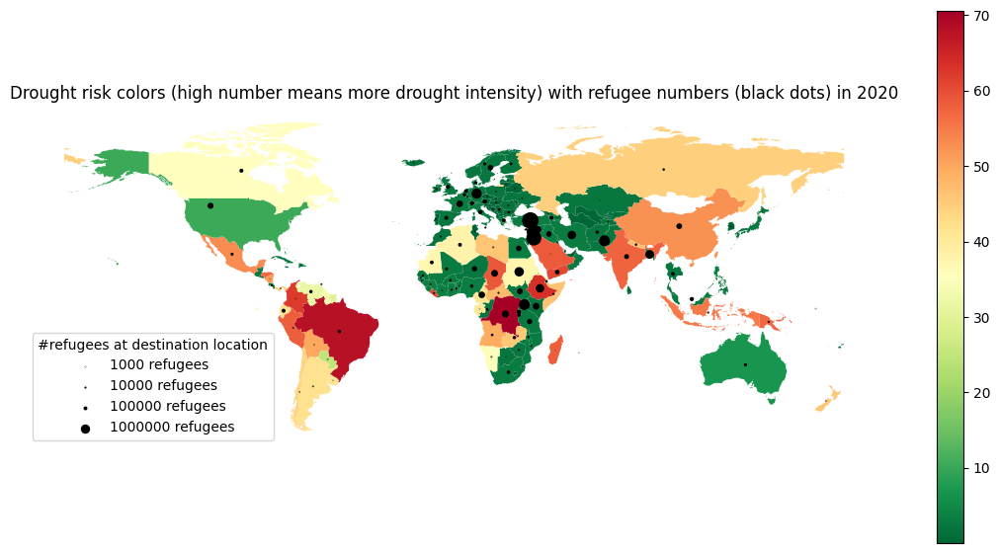

In [4]:
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Filter the DataFrame to include only rows for the specific year (e.g., 2020)
geoworld_destinationref_2020 = geoworld_destinationref[geoworld_destinationref['Year'] == 2020]

# lat lon projection
geoworld_destinationref_2020 = geoworld_destinationref_2020.to_crs('EPSG:4326')  

# Suppress the UserWarning
with warnings.catch_warnings():
    warnings.simplefilter("ignore", UserWarning)
    # Extract centroid coordinates
    geoworld_destinationref_2020['centroid'] = geoworld_destinationref_2020.geometry.centroid

fig, ax = plt.subplots(figsize=(14, 7))
# Plot the geometry column with the values from another column
geoworld_destinationref_2020.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax)

# Plot centroids as scatter points
plt.scatter(geoworld_destinationref_2020['centroid'].x, geoworld_destinationref_2020['centroid'].y, color='black', s=geoworld_destinationref_2020['#refugees_destination']/30000) #size/50000 miss beter.

# Define sizes for the legend (you can adjust these values as needed)
sizes = []
#sizes.extend([(geoworld_destinationref_2020['#refugees_destination'].min())*10, round(geoworld_destinationref_2020['#refugees_destination'].mean()), round(geoworld_destinationref_2020['#refugees_destination'].max())])  # Example sizes of refugees
sizes.extend([1000,10000,100000,1000000])
# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size/30000, color='black', label=str(size) + ' refugees') for size in sizes] #size/50000 miss beter.

# Add the custom size legends to the existing color legend
handles, labels = ax.get_legend_handles_labels()

# Create the new legend with both the color legend and the custom size legends
ax.legend(handles=handles, loc='lower left', title='#refugees at destination location')

# Remove the axes
ax.axis('off')

plt.title('Drought risk colors (high number means more drought intensity) with refugee numbers (black dots) in 2020')

plt.show()

In [5]:
# Select the top 25 countries with the highest refugee numbers
top_25_destinations_2020 = geoworld_destinationref_2020.nlargest(25, '#refugees_destination')

# Display their climatic scores in a table
top_25_destinations_climate_2020 = top_25_destinations_2020[['Country', 'EI_06', '#refugees_destination','geometry','centroid']]
top_25_destinations_climate_2020


,Country,EI_06,#refugees_destination,geometry,centroid
2842,Turkey,3.21,3652362,"MULTIPOLYGON (((26.00042 40.15375, 25.75847 40...",POINT (35.17898 39.06047)
1454,Jordan,2.03,3009472,"MULTIPOLYGON (((35.00000 29.35267, 34.96601 29...",POINT (36.78779 31.24941)
2155,Pakistan,2.49,1438940,"MULTIPOLYGON (((68.10291 23.82048, 68.18819 23...",POINT (69.39954 29.97343)
2882,Uganda,2.54,1421133,"MULTIPOLYGON (((30.47107 -1.05585, 30.35885 -1...",POINT (32.39242 1.28273)
1574,Lebanon,0.19,1349925,"MULTIPOLYGON (((35.10292 33.09406, 35.20246 33...",POINT (35.88743 33.91722)
1084,Germany,2.62,1210596,"MULTIPOLYGON (((13.71472 54.29193, 13.67361 54...",POINT (10.39492 51.10967)
2640,Sudan,37.41,1040288,"MULTIPOLYGON (((24.25777 8.67912, 23.82978 8.7...",POINT (30.00426 16.04884)
227,Bangladesh,3.26,866534,"MULTIPOLYGON (((90.16463 21.80086, 90.11894 21...",POINT (90.27813 23.86415)
955,Ethiopia,63.66,800454,"MULTIPOLYGON (((35.86995 4.62731, 35.78629 4.7...",POINT (39.62487 8.62915)
1321,Iran (Islamic Republic of),2.98,800025,"MULTIPOLYGON (((55.54736 26.70903, 55.63958 26...",POINT (54.30329 32.56015)


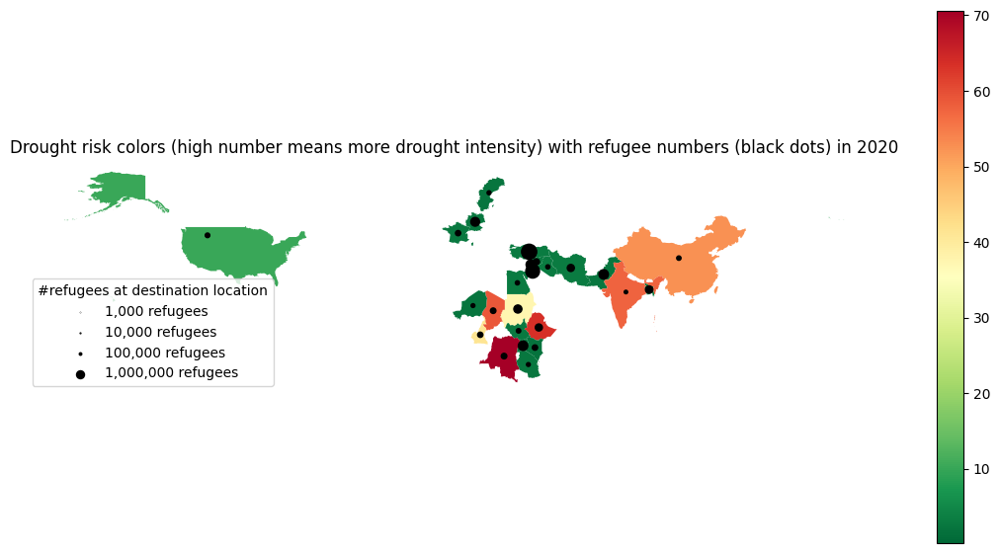

In [6]:
fig, ax = plt.subplots(figsize=(14, 7))
# Plot the geometry column with the values from another column
top_25_destinations_climate_2020.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax)

# Plot centroids as scatter points
plt.scatter(top_25_destinations_climate_2020['centroid'].x, top_25_destinations_climate_2020['centroid'].y, color='black', s=top_25_destinations_climate_2020['#refugees_destination'] / 30000)

# Define sizes for the legend (you can adjust these values as needed)
sizes = [1000, 10000, 100000, 1000000]
# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=f'{size:,} refugees') for size in sizes]

# Add the custom size legends to the existing color legend
handles, labels = ax.get_legend_handles_labels()
#handles.extend(size_legends)
ax.legend(handles=handles, loc='lower left', title='#refugees at destination location')

# Remove the axes
ax.axis('off')

plt.title('Drought risk colors (high number means more drought intensity) with refugee numbers (black dots) in 2020')

plt.show()

In [7]:
top_25_destinations_climate_2020['EI_06'].median()

3.0

In [8]:
top_25_destinations_climate_2020['EI_06'].mean()

17.4084

In [9]:
top_25_destinations_climate_2020['EI_06'].max()

70.58

In [10]:
top_25_destinations_climate_2020['EI_06'].min()

0.19

In [11]:
top_25_destinations_climate_2020.describe()

,EI_06,#refugees_destination
count,25.000000,2.500000e+01
mean,17.408400,8.352639e+05
std,24.429416,8.540863e+05
min,0.190000,1.953730e+05
25%,2.540000,3.034050e+05
50%,3.000000,4.786490e+05
75%,37.410000,1.040288e+06
max,70.580000,3.652362e+06


In [12]:
geoworld_destinationref_2020[['EI_06', '#refugees_destination']].describe()

,EI_06,#refugees_destination
count,158.000000,1.580000e+02
mean,14.451646,1.520048e+05
std,21.389891,4.484831e+05
min,0.010000,1.300000e+01
25%,0.180000,9.477500e+02
50%,2.525000,5.933500e+03
75%,32.982500,9.532450e+04
max,70.580000,3.652362e+06


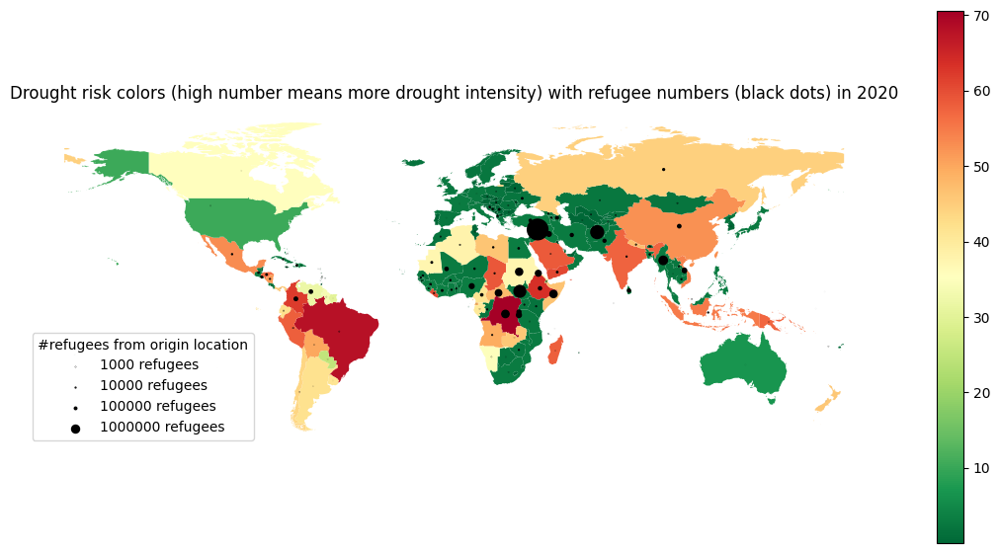

In [13]:
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Filter the DataFrame to include only rows for the specific year (e.g., 2020)
geoworld_originref_2020 = geoworld_originref[geoworld_originref['Year'] == 2020]

# lat lon projection
geoworld_originref_2020 = geoworld_originref_2020.to_crs('EPSG:4326')  

# Suppress the UserWarning
with warnings.catch_warnings():
    warnings.simplefilter("ignore", UserWarning)
    # Extract centroid coordinates
    geoworld_originref_2020['centroid'] = geoworld_originref_2020.geometry.centroid

fig, ax = plt.subplots(figsize=(14, 7))
# Plot the geometry column with the values from another column
geoworld_originref_2020.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax)

# Plot centroids as scatter points
plt.scatter(geoworld_originref_2020['centroid'].x, geoworld_originref_2020['centroid'].y, color='black', s=geoworld_originref_2020['#refugees_origin']/30000) #size/50000 miss beter.

# Define sizes for the legend (you can adjust these values as needed)
sizes = []
#sizes.extend([(geoworld_originref_2020['#refugees_origin'].min())*10, round(geoworld_originref_2020['#refugees_origin'].mean()), round(geoworld_originref_2020['#refugees_origin'].max())])  # Example sizes of refugees
sizes.extend([1000,10000,100000,1000000])
# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size/30000, color='black', label=str(size) + ' refugees') for size in sizes] #size/50000 miss beter.

# Add the custom size legends to the existing color legend
handles, labels = ax.get_legend_handles_labels()

# Create the new legend with both the color legend and the custom size legends
ax.legend(handles=handles, loc='lower left', title='#refugees from origin location') #at

# Remove the axes
ax.axis('off')

plt.title('Drought risk colors (high number means more drought intensity) with refugee numbers (black dots) in 2020')

plt.show()

In [14]:
# Select the top 25 countries with the highest refugee numbers
top_25_origins_2020 = geoworld_originref_2020.nlargest(25, '#refugees_origin')

# Display their climatic scores in a table
top_25_origins_climate_2020 = top_25_origins_2020[['Country', 'EI_06', '#refugees_origin','geometry','centroid']]
top_25_origins_climate_2020


,Country,EI_06,#refugees_origin,geometry,centroid
3142,Syria,3.00,6702910,"MULTIPOLYGON (((35.77957 32.75195, 35.90094 32...",POINT (38.52579 35.02494)
17,Afghanistan,2.44,2594827,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29...",POINT (66.03298 33.82873)
3003,South Sudan,2.67,2188785,"MULTIPOLYGON (((30.87023 3.48268, 30.85695 3.5...",POINT (30.32100 7.28792)
2217,Myanmar,2.90,1103245,"MULTIPOLYGON (((98.17028 9.88889, 98.11643 9.9...",POINT (96.50650 21.16139)
877,Democratic Republic of Congo,70.58,840392,"MULTIPOLYGON (((29.04017 -2.74310, 29.00072 -2...",POINT (23.66144 -2.88034)
2952,Somalia,46.55,812356,"MULTIPOLYGON (((41.57542 -1.64236, 41.57736 -1...",POINT (45.87089 6.07043)
3063,Sudan,37.41,787823,"MULTIPOLYGON (((24.25777 8.67912, 23.82978 8.7...",POINT (30.00426 16.04884)
624,Central African Republic,47.46,642161,"MULTIPOLYGON (((27.46342 5.01615, 27.43155 5.0...",POINT (20.48565 6.57608)
1073,Eritrea,37.32,524738,"MULTIPOLYGON (((36.56086 14.26637, 36.52689 14...",POINT (38.84480 15.38129)
525,Burundi,0.18,372951,"MULTIPOLYGON (((29.39148 -4.44525, 29.38208 -4...",POINT (29.88676 -3.36888)


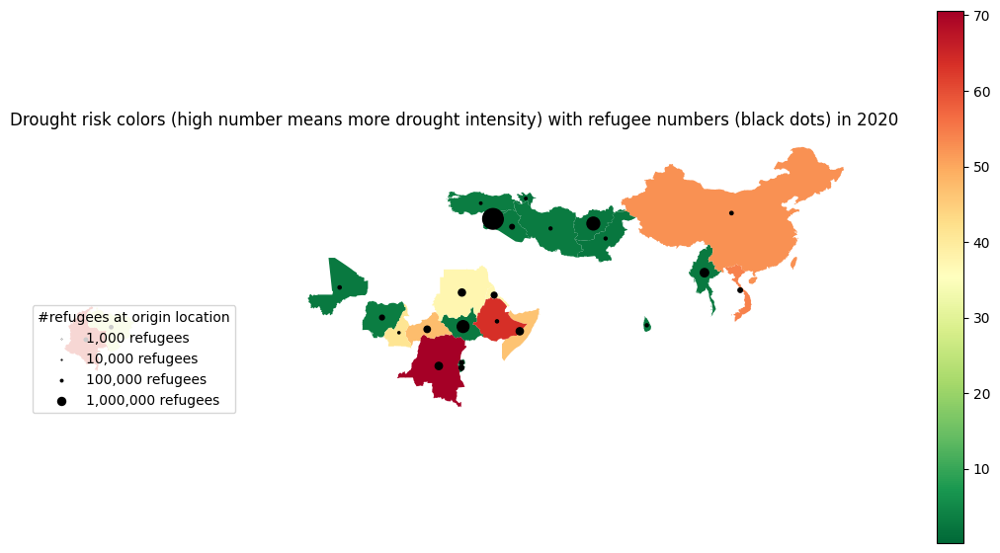

In [15]:
fig, ax = plt.subplots(figsize=(14, 7))
# Plot the geometry column with the values from another column
top_25_origins_climate_2020.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax)

# Plot centroids as scatter points
plt.scatter(top_25_origins_climate_2020['centroid'].x, top_25_origins_climate_2020['centroid'].y, color='black', s=top_25_origins_climate_2020['#refugees_origin'] / 30000)

# Define sizes for the legend (you can adjust these values as needed)
sizes = [1000, 10000, 100000, 1000000]
# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=f'{size:,} refugees') for size in sizes]

# Add the custom size legends to the existing color legend
handles, labels = ax.get_legend_handles_labels()
#handles.extend(size_legends)
ax.legend(handles=handles, loc='lower left', title='#refugees at origin location')

# Remove the axes
ax.axis('off')

plt.title('Drought risk colors (high number means more drought intensity) with refugee numbers (black dots) in 2020')

plt.show()

In [16]:
top_25_origins_climate_2020.describe()

,EI_06,#refugees_origin
count,25.000000,2.500000e+01
mean,23.154800,7.742340e+05
std,25.186753,1.386269e+06
min,0.180000,7.848100e+04
25%,2.750000,1.514260e+05
50%,3.210000,3.167280e+05
75%,46.550000,7.878230e+05
max,70.580000,6.702910e+06


In [17]:
geoworld_originref_2020[['EI_06', '#refugees_origin']].describe()

,EI_06,#refugees_origin
count,179.000000,1.790000e+02
mean,14.035419,1.128175e+05
std,21.340149,5.749892e+05
min,0.010000,5.000000e+00
25%,0.170000,1.035000e+02
50%,2.460000,1.368000e+03
75%,30.975000,1.469200e+04
max,70.580000,6.702910e+06


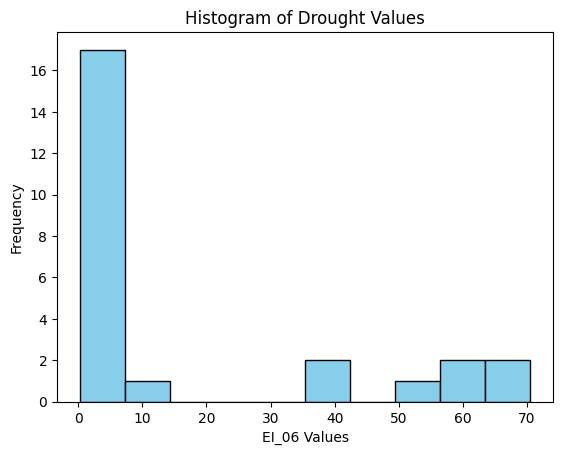

In [18]:
# Plot the histogram
plt.hist(top_25_destinations_climate_2020['EI_06'], bins=10, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('EI_06 Values')
plt.ylabel('Frequency')
plt.title('Histogram of Drought Values')

# Show the plot
plt.show()

In [19]:
# Test for non-normality check
shapiro_stat, shapiro_p_value = stats.shapiro(top_25_destinations_climate_2020['EI_06'])
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.6597399829175592, p-value = 2.1906181795140993e-06
Reject the null hypothesis: The data is not normally distributed.


In [20]:
import scipy.stats as stats

# Standardize the data
data_standardized = (top_25_destinations_climate_2020['EI_06'] - np.mean(top_25_destinations_climate_2020['EI_06'])) / np.std(top_25_destinations_climate_2020['EI_06'])

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.40277222330789947, p-value = 0.00035590379840336943
Reject the null hypothesis: The data is not normally distributed.


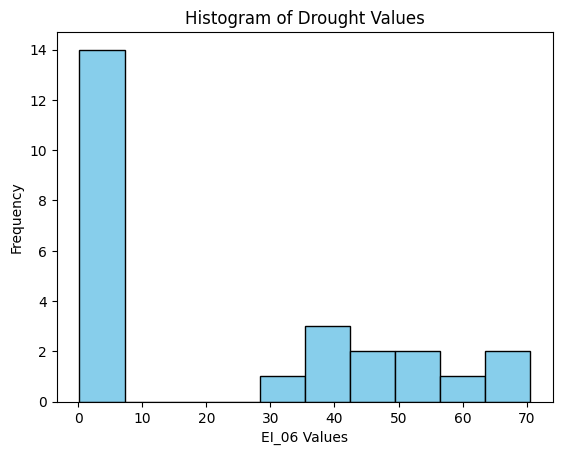

In [21]:
# Plot the histogram
plt.hist(top_25_origins_climate_2020['EI_06'], bins=10, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('EI_06 Values')
plt.ylabel('Frequency')
plt.title('Histogram of Drought Values')

# Show the plot
plt.show()

In [22]:
# Test for non-normality check
shapiro_stat, shapiro_p_value = stats.shapiro(top_25_origins_climate_2020['EI_06'])
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.7824273537253056, p-value = 0.00011740293857016202
Reject the null hypothesis: The data is not normally distributed.


In [23]:
import scipy.stats as stats

# Standardize the data
data_standardized = (top_25_origins_climate_2020['EI_06'] - np.mean(top_25_origins_climate_2020['EI_06'])) / np.std(top_25_origins_climate_2020['EI_06'])

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.35051390235147284, p-value = 0.0029895351091880906
Reject the null hypothesis: The data is not normally distributed.


Later in the notebook we shall see that if number of data points is below 50, Shapiro should be used and not KS.

An independent t-test is typically used to compare two different groups, as it examines differences between them (= differences between origin and destination).

So, an unpaired t-test is definitely not suitable because there are fewer than 30 observations in both groups and the data is not normally distributed. Therefore, in this case, we can potentially use the Mann-Whitney U test (https://statistics.laerd.com/spss-tutorials/mann-whitney-u-test-using-spss-statistics.php#:~:text=The%20Mann%2DWhitney%20U%20test,continuous%2C%20but%20not%20normally%20distributed). This test is the alternative to the independent t-test. The Wilcoxon test has several types: signed-rank, one-sample (a type of signed-rank), and rank-sum. The following holds: The Mann-Whitney-Wilcoxon test = Wilcoxon rank-sum test = Mann-Whitney U test.

However, we first test the overlap between top 25 origin and destination countries. If there is overlap, no independent t-test (or an non-parametric alternative) can be conducted, because it violates the assumptions.

Generic test difference between top Origin and Destination locations.

In [24]:
top_25_origins_climate_2020['Country']

3142                           Syria
17                       Afghanistan
3003                     South Sudan
2217                         Myanmar
877     Democratic Republic of Congo
2952                         Somalia
3063                           Sudan
624         Central African Republic
1073                         Eritrea
525                          Burundi
2359                         Nigeria
1560                            Iraq
3504                         Vietnam
2675                          Rwanda
704                         Colombia
684                            China
3484                       Venezuela
2009                            Mali
1132                        Ethiopia
3043                       Sri Lanka
1540                            Iran
2454                        Pakistan
208                       Azerbaijan
3300                          Turkey
565                         Cameroon
Name: Country, dtype: object

In [25]:
top_25_destinations_climate_2020['Country']

2842                          Turkey
1454                          Jordan
2155                        Pakistan
2882                          Uganda
1574                         Lebanon
1084                         Germany
2640                           Sudan
227                       Bangladesh
955                         Ethiopia
1321      Iran (Islamic Republic of)
2706            Syrian Arab Republic
764     Democratic Republic of Congo
542                             Chad
1494                           Kenya
482                         Cameroon
1004                          France
2962        United States of America
2580                     South Sudan
582                            China
857                            Egypt
1341                            Iraq
2666                          Sweden
2746     United Republic of Tanzania
2056                           Niger
1281                           India
Name: Country, dtype: object

In [26]:
top_25_origins_climate_2020['Country'].isin(top_25_destinations_climate_2020['Country'])

3142    False
17      False
3003     True
2217    False
877      True
2952    False
3063     True
624     False
1073    False
525     False
2359    False
1560     True
3504    False
2675    False
704     False
684      True
3484    False
2009    False
1132     True
3043    False
1540    False
2454     True
208     False
3300     True
565      True
Name: Country, dtype: bool

These two groups overlap to much to do a Mann-Whitney U test.

What we can do is a one sample signed wilcoxon rank test, in which one origin median is taken as given/a constant and is tested against the values of the destination group, and the other way around. Also, median of medians can be compared. This is explained in the report and the tests are conducted later in this notebook, when calculations for all years are made.

In [27]:
top_25_origins_climate_2020['EI_06'].describe()

count    25.000000
mean     23.154800
std      25.186753
min       0.180000
25%       2.750000
50%       3.210000
75%      46.550000
max      70.580000
Name: EI_06, dtype: float64

In [28]:
top_25_destinations_climate_2020['EI_06'].describe()

count    25.000000
mean     17.408400
std      24.429416
min       0.190000
25%       2.540000
50%       3.000000
75%      37.410000
max      70.580000
Name: EI_06, dtype: float64

## Spatial weights <a class="anchor" id="chapter3"></a>

Below is information from Trivik Verma his course (2021). (Web page not available anymore.)

In this session we will be learning the ins and outs of one of the key pieces in spatial analysis: spatial weights matrices. These are structured sets of numbers that formalize geographical relationships between the observations in a dataset. Essentially, a spatial weights matrix of a given geography is a positive definite matrix of dimensions $N$ by $N$, where $N$ is the total number of observations:

$$
W = \left(\begin{array}{cccc}
0 & w_{12} & \dots & w_{1N} \\
w_{21} & \ddots & w_{ij} & \vdots \\
\vdots & w_{ji} & 0 & \vdots \\
w_{N1} & \dots & \dots & 0 
\end{array} \right)
$$

where each cell $w_{ij}$ contains a value that represents the degree of spatial contact or interaction between observations $i$ and $j$. A fundamental concept in this context is that of *neighbor* and *neighborhood*. By convention, elements in the diagonal ($w_{ij}$) are set to zero. A *neighbor* of a given observation $i$ is another observation with which $i$ has some degree of connection. In terms of $W$, $i$ and $j$ are thus neighbors if $w_{ij} > 0$. Following this logic, the neighborhood of $i$ will be the set of observations in the system with which it has certain connection, or those observations with a weight greater than zero.

There are several ways to create such matrices, and many more to transform them so they contain an accurate representation that aligns with the way we understand spatial interactions between the elements of a system. In this session, we will introduce the most commonly used ones and will show how to compute them with `PySAL`.

In [29]:
from pysal.lib import weights
from libpysal.io import open as psopen

We use contiguity weights, which "define spatial connections through the existence of common boundaries. This makes it directly suitable to use with polygons: if two polygons share boundaries to some degree, they will be labeled as neighbors under these kinds of weights. Exactly how much they need to share is what differenciates the two approaches we will learn: queen and rook" (Trivik, 2021).

"Under the queen criteria, two observations only need to share a vortex (a single point) of their boundaries to be considered neighbors.

Rook contiguity is similar to and, in many ways, superseded by queen contiguity. However, since it sometimes comes up in the literature, it is useful to know about it. The main idea is the same: two observations are neighbors if they share some of their boundary lines. However, in the rook case, it is not enough with sharing only one point, it needs to be at least a segment of their boundary. In most applied cases, these differences usually boil down to how the geocoding was done, but in some cases, such as when we use raster data or grids, this approach can differ more substantively and it thus makes more sense (Trivik, 2021)."

We use queen, as we do no thave raster data or grids and in real life, one point of border touching is enough to be neighbors.

In [30]:
geoworld_destinationref_2020 = geoworld_destinationref_2020.set_index("Country")

In [31]:
geoworld_destinationref_2020

,Code,Year,#refugees_destination,W,E,V,S,C,A,S_01,...,AI_04b_Norm,AI_04b_Base,AI_04c_Norm,AI_04c_Base,AI_05a_Norm,AI_05a_Base,AI_05b_Norm,AI_05b_Base,geometry,centroid
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,AFG,2020,72278,4.08,0.25,66.67,56.57,78.57,66.68,70.94,...,54.27,75,71.26,43,74.49,448.61,60.21,5.6,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29...",POINT (66.03298 33.82873)
Albania,ALB,2020,105,5.68,2.29,14.07,6.77,11.33,36.34,50.16,...,11.40,98,21.34,94,48.84,3192.88,39.21,1.6,"MULTIPOLYGON (((19.37540 41.85014, 19.34141 41...",POINT (20.06558 41.14148)
Algeria,DZA,2020,97651,9.53,2.62,34.67,18.23,50.00,45.71,47.98,...,36.16,91,45.42,77,43.35,4412.51,44.90,2.4,"MULTIPOLYGON (((4.24289 19.13672, 3.33377 18.9...",POINT (2.67715 28.15853)
Angola,AGO,2020,25791,11.07,2.37,51.72,33.83,58.64,69.73,55.42,...,80.18,51,73.54,41,59.75,1244.91,76.67,22.3,"MULTIPOLYGON (((12.00986 -5.03066, 12.17323 -4...",POINT (17.54901 -12.29701)
Argentina,ARG,2020,3965,15.58,11.54,21.03,18.19,10.64,48.06,39.15,...,55.23,74,50.99,71,50.00,2910.22,84.22,42.0,"MULTIPOLYGON (((-64.60528 -54.90792, -64.54417...",POINT (-65.16713 -35.38640)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,UZB,2020,13,1.74,0.18,16.88,14.10,11.26,30.32,55.32,...,17.45,97,0.01,99,50.70,2850.18,70.25,12.9,"MULTIPOLYGON (((71.04007 40.18450, 71.11230 40...",POINT (63.16649 41.75129)
Bolivarian Republic of Venezuela,VEN,2020,68089,22.74,19.52,26.48,23.83,12.66,61.58,48.41,...,72.03,62,79.73,28,49.07,3167.44,100.00,2355.1,"MULTIPOLYGON (((-63.80403 10.98169, -64.04903 ...",POINT (-66.14845 7.13120)
Yemen,YEM,2020,166906,24.37,9.12,65.10,60.83,67.81,66.88,67.57,...,67.59,66,66.90,46,66.11,841.23,74.95,19.6,"MULTIPOLYGON (((53.73915 12.63625, 53.81375 12...",POINT (47.58523 15.90728)


In [32]:
w_queen = weights.Queen.from_dataframe(geoworld_destinationref_2020, ids=geoworld_destinationref_2020.index)
w_queen

C:\Users\thoma\Anaconda3\envs\thesis\Lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 21 disconnected components.
 There are 17 islands with ids: Bahamas, Cuba, Cyprus, Dominican Republic, Fiji, Iceland, Jamaica, Japan, Madagascar, Malta, Mauritius, Nauru, New Zealand, Philippines, Republic of Korea, Sri Lanka, Trinidad and Tobago.
  W.__init__(self, neighbors, ids=ids, **kw)


(We will solve the island issue later.)

We do not use distance based matrices, because that does not make sense in our context. The use case in this study is about neighboring countries, not the distances between the countries. Distance is also difficult to interpretet, because it will be dependend on the size of the country and the place in the country the distance will be calculated from.

"In the context of many spatial analysis techniques, a spatial weights matrix with raw values (e.g. ones and zeros for the binary case) is not always the best suiting one for analysis and some sort of transformation is required. This implies modifying each weight so they conform to certain rules. PySAL has transformations baked right into the W object, so it is possible to check the state of an object as well as to modify it" (Trivik, 2021)".

In [33]:
w_queen.transform = 'R' # row, with all the neighbors of a given observation adding up to one.

('WARNING: ', 'Bahamas', ' is an island (no neighbors)')
('WARNING: ', 'Cuba', ' is an island (no neighbors)')
('WARNING: ', 'Cyprus', ' is an island (no neighbors)')
('WARNING: ', 'Dominican Republic', ' is an island (no neighbors)')
('WARNING: ', 'Fiji', ' is an island (no neighbors)')
('WARNING: ', 'Iceland', ' is an island (no neighbors)')
('WARNING: ', 'Jamaica', ' is an island (no neighbors)')
('WARNING: ', 'Japan', ' is an island (no neighbors)')
('WARNING: ', 'Madagascar', ' is an island (no neighbors)')
('WARNING: ', 'Malta', ' is an island (no neighbors)')
('WARNING: ', 'Mauritius', ' is an island (no neighbors)')
('WARNING: ', 'Nauru', ' is an island (no neighbors)')
('WARNING: ', 'New Zealand', ' is an island (no neighbors)')
('WARNING: ', 'Philippines', ' is an island (no neighbors)')
('WARNING: ', 'Republic of Korea', ' is an island (no neighbors)')
('WARNING: ', 'Sri Lanka', ' is an island (no neighbors)')
('WARNING: ', 'Trinidad and Tobago', ' is an island (no neighbors

### Spatial Lag <a class="anchor" id="section3_5"></a>

"One of the most direct applications of spatial weight matrices is the so-called *spatial lag*. The spatial lag of a given variable is the product of a spatial weight matrix and the variable itself:

$$
Y_{sl} = W Y
$$

where $Y$ is a Nx1 vector with the values of the variable. Recall that the product of a matrix and a vector equals the sum of a row by column element multiplication for the resulting value of a given row. In terms of the spatial lag:

$$
y_{sl-i} = \displaystyle \sum_j w_{ij} y_j
$$

If we are using row-standardized weights, $w_{ij}$ becomes a proportion between zero and one, and $y_{sl-i}$ can be seen as the average value of $Y$ in the neighborhood of $i$" (Trivik, 2021).

In [34]:
# Compute spatial lag of `EI_06`, droughts
w_queen_score = weights.lag_spatial(w_queen,geoworld_destinationref_2020['EI_06'])
# Print the first five elements
w_queen_score[:5]

array([10.01333333,  0.7525    , 15.19      , 38.3125    , 45.622     ])

In [35]:
geoworld_destinationref_2020['w_queen_score'] = w_queen_score

### Moran Plot <a class="anchor" id="section3_6"></a>

"The Moran Plot is a graphical way to start exploring the concept of spatial autocorrelation, and it is a good application of spatial weight matrices and the spatial lag. In essence, it is a standard scatter plot in which a given variable is plotted against *its own* spatial lag. Usually, a fitted line is added to include more information:" (Trivik, 2021) 

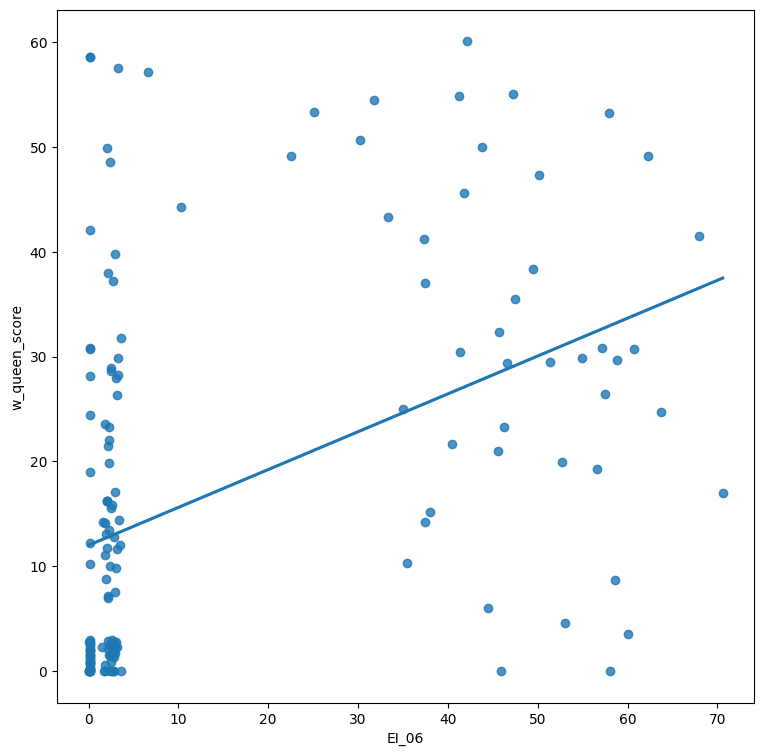

In [36]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot values
sns.regplot(x="EI_06", y="w_queen_score", data=geoworld_destinationref_2020, ci=None)
# Display
plt.show()

In order to easily compare different scatter plots and spot outlier observations, it is common practice to standardize the values of the variable before computing its spatial lag and plotting it. This can be accomplished by substracting the average value and dividing the result by the standard deviation:

$$
z_i = \dfrac{y - \bar{y}}{\sigma_y}
$$

where $z_i$ is the standardized version of $y_i$, $\bar{y}$ is the average of the variable, and $\sigma$ its standard deviation.

Creating a standardized Moran Plot implies that average values are centered in the plot (as they are zero when standardized) and dispersion is expressed in standard deviations, with the rule of thumb of values greater or smaller than two standard deviations being *outliers*. A standardized Moran Plot also partitions the space into four quadrants that represent different situations:

1. High-High (*HH*): values above average surrounded by values above average.
1. Low-Low (*LL*): values below average surrounded by values below average.
1. High-Low (*HL*): values above average surrounded by values below average.
1. Low-High (*LH*): values below average surrounded by values above average.

Above explanation also by Trivik (2021).

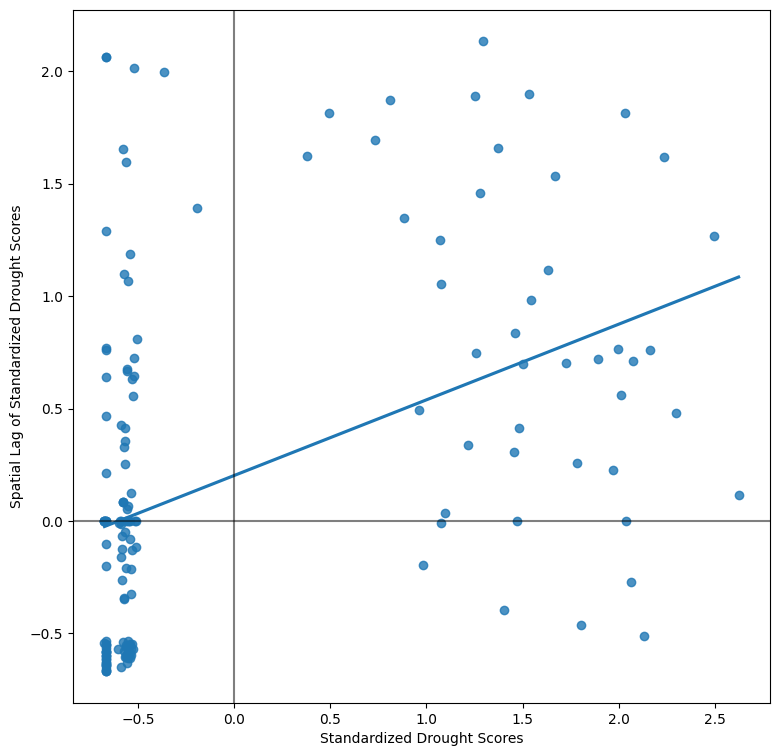

In [37]:
# Standardize the EI_06, Drought scores
std_drought = (geoworld_destinationref_2020['EI_06'] - geoworld_destinationref_2020['EI_06'].mean()) / geoworld_destinationref_2020['EI_06'].std()
# Compute the spatial lag of the standardized version and save is as a 
# Series indexed as the original variable
std_w_drought = pd.Series(weights.lag_spatial(w_queen, std_drought), index=std_drought.index)
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot values
sns.regplot(x=std_drought, y=std_w_drought, ci=None)
# Add vertical and horizontal lines
plt.axvline(0, c='k', alpha=0.5)
plt.axhline(0, c='k', alpha=0.5)
# Set labels for x and y axes
plt.xlabel('Standardized Drought Scores')
plt.ylabel('Spatial Lag of Standardized Drought Scores')
# Display
plt.show()

Text(37.722222222222214, 0.5, 'Spatial Lag of Standardized Drought Scores')

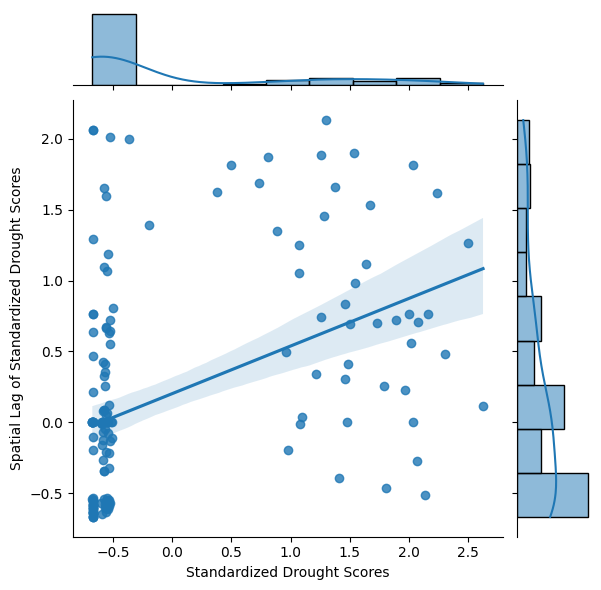

In [38]:
sns.jointplot(x=std_drought, y=std_w_drought, kind="reg")
plt.xlabel('Standardized Drought Scores')
plt.ylabel('Spatial Lag of Standardized Drought Scores')

## Spatial weights matrix <a class="anchor" id="chapter2"></a>

"As discused before, a spatial weights matrix is the way geographical space is formally encoded into a numerical form so it is easy for a computer (or a statistical method) to understand.

The cell where we computed $W$ returned a warning on "islands". Remember these are islands not necessarily in the geographic sense (although some of them will be), but in the mathematical sense of the term: local authorities that are not sharing border with any other one and thus do not have any neighbors. We can inspect and map them to get a better sense of what we are dealing with:

In [39]:
w_queen.islands

['Bahamas',
 'Cuba',
 'Cyprus',
 'Dominican Republic',
 'Fiji',
 'Iceland',
 'Jamaica',
 'Japan',
 'Madagascar',
 'Malta',
 'Mauritius',
 'Nauru',
 'New Zealand',
 'Philippines',
 'Republic of Korea',
 'Sri Lanka',
 'Trinidad and Tobago']

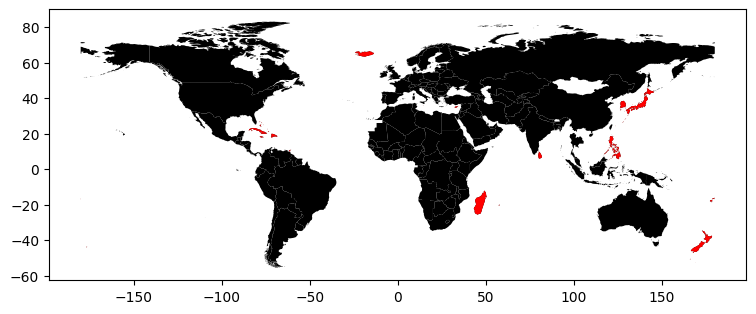

In [40]:
ax = geoworld_destinationref_2020.plot(color='k', figsize=(9, 9))
geoworld_destinationref_2020.loc[w_queen.islands, :].plot(color='red', ax=ax);

In this case, all the islands are indeed "real" islands. These cases can create issues in the analysis and distort the results. There are several solutions to this situation such as connecting the islands to other observations through a different criterium (e.g. nearest neighbor), and then combining both spatial weights matrices. For convenience, we will remove them from the dataset because they are a small sample and their removal is likely not to have a large impact in the calculations.

In this case we will use the `drop` command, which comes in very handy in these cases:

In [41]:
geoworld_destinationref_2020 = geoworld_destinationref_2020.drop(w_queen.islands)

Once we have the set of local authorities that are not an island, we need to re-calculate the weights matrix:

In [42]:
w_queen = weights.Queen.from_dataframe(geoworld_destinationref_2020, ids=geoworld_destinationref_2020.index)

C:\Users\thoma\Anaconda3\envs\thesis\Lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  W.__init__(self, neighbors, ids=ids, **kw)


In [43]:
w_queen.islands

[]

And, finally, let us row-standardize it to make sure every row of the matrix sums up to one" (Trivik, 2021):

In [44]:
# Row standardize the matrix
w_queen.transform = 'R'

### Spatial lag <a class="anchor" id="section2_1"></a>

"Once we have the data and the spatial weights matrix ready, we can start by computing the spatial lag of drought scores for different countries. The spatial lag is the product of the spatial weights matrix and a given variable and that, if $W$ is row-standardized, the result amounts to the average value of the variable in the neighborhood of each observation.

We can calculate the spatial lag for the variable `EI_06_Droughts` and store it directly in the main table with the following line of code" (Trivik, 2021):

In [45]:
geoworld_destinationref_2020['w_EI_06_Droughts'] = weights.lag_spatial(w_queen, geoworld_destinationref_2020['EI_06'])
geoworld_destinationref_2020

,Code,Year,#refugees_destination,W,E,V,S,C,A,S_01,...,AI_04c_Norm,AI_04c_Base,AI_05a_Norm,AI_05a_Base,AI_05b_Norm,AI_05b_Base,geometry,centroid,w_queen_score,w_EI_06_Droughts
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,AFG,2020,72278,4.08,0.25,66.67,56.57,78.57,66.68,70.94,...,71.26,43,74.49,448.61,60.21,5.6,"MULTIPOLYGON (((60.89944 29.83750, 60.86578 29...",POINT (66.03298 33.82873),10.013333,10.013333
Albania,ALB,2020,105,5.68,2.29,14.07,6.77,11.33,36.34,50.16,...,21.34,94,48.84,3192.88,39.21,1.6,"MULTIPOLYGON (((19.37540 41.85014, 19.34141 41...",POINT (20.06558 41.14148),0.752500,0.752500
Algeria,DZA,2020,97651,9.53,2.62,34.67,18.23,50.00,45.71,47.98,...,45.42,77,43.35,4412.51,44.90,2.4,"MULTIPOLYGON (((4.24289 19.13672, 3.33377 18.9...",POINT (2.67715 28.15853),15.190000,15.190000
Angola,AGO,2020,25791,11.07,2.37,51.72,33.83,58.64,69.73,55.42,...,73.54,41,59.75,1244.91,76.67,22.3,"MULTIPOLYGON (((12.00986 -5.03066, 12.17323 -4...",POINT (17.54901 -12.29701),38.312500,38.312500
Argentina,ARG,2020,3965,15.58,11.54,21.03,18.19,10.64,48.06,39.15,...,50.99,71,50.00,2910.22,84.22,42.0,"MULTIPOLYGON (((-64.60528 -54.90792, -64.54417...",POINT (-65.16713 -35.38640),45.622000,45.622000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,UZB,2020,13,1.74,0.18,16.88,14.10,11.26,30.32,55.32,...,0.01,99,50.70,2850.18,70.25,12.9,"MULTIPOLYGON (((71.04007 40.18450, 71.11230 40...",POINT (63.16649 41.75129),1.674000,1.674000
Bolivarian Republic of Venezuela,VEN,2020,68089,22.74,19.52,26.48,23.83,12.66,61.58,48.41,...,79.73,28,49.07,3167.44,100.00,2355.1,"MULTIPOLYGON (((-63.80403 10.98169, -64.04903 ...",POINT (-66.14845 7.13120),54.503333,54.503333
Yemen,YEM,2020,166906,24.37,9.12,65.10,60.83,67.81,66.88,67.57,...,66.90,46,66.11,841.23,74.95,19.6,"MULTIPOLYGON (((53.73915 12.63625, 53.81375 12...",POINT (47.58523 15.90728),30.755000,30.755000


This seems a bit redundant now, because w_queen_score and w_EI_06_Droughts seem very similar (spatial lag with islands vs spatial lag without islands), but we do this for the explanation. This way, it should be easy to follow the analysis. In the end, exclusion of the islands does not seem to influence the analysis heavily.

In [46]:
geoworld_destinationref_2020['EI_06']

Country
Afghanistan                          2.44
Albania                              0.17
Algeria                             37.95
Angola                              49.42
Argentina                           41.82
                                    ...  
Uzbekistan                           0.15
Bolivarian Republic of Venezuela    31.79
Yemen                               60.69
Zambia                              45.61
Zimbabwe                             2.27
Name: EI_06, Length: 141, dtype: float64

The way to interpret the spatial lag `w_queen_score` or `w_EI_06_Droughts` for say the first observation is as follow: Afghanistan, where the drought score is 2.44 (which is quite low) is surrounded by neighbouring countries where, on average, the drought score is above 10 (way higher). 

For some of the techniques we will use below, it makes more sense to operate with the standardized version of a variable, rather than with the raw one.

In [47]:
geoworld_destinationref_2020['EI_06_std'] = (geoworld_destinationref_2020['EI_06'] - geoworld_destinationref_2020['EI_06'].mean()) / geoworld_destinationref_2020['EI_06'].std()

Finally, to be able to explore the spatial patterns of the standardized values, also called sometimes values, we need to create the spatial lag:

In [48]:
geoworld_destinationref_2020['w_EI_06_std'] = weights.lag_spatial(w_queen, geoworld_destinationref_2020['EI_06_std'])

## Global Spatial autocorrelation <a class="anchor" id="chapter3"></a>

"Global spatial autocorrelation relates to the overall geographical pattern present in the data. Statistics designed to measure this trend thus characterize a map in terms of its degree of clustering and summarize it. This summary can be visual or numerical. In this section, we will walk through an example of each of them: the Moran Plot, and Moran's I statistic of spatial autocorrelation.

### Moran Plot (again, but more explanation) <a class="anchor" id="section3_1"></a>

The moran plot is a way of visualizing a spatial dataset to explore the nature and strength of spatial autocorrelation. It is essentially a traditional scatter plot in which the variable of interest is displayed against its spatial lag. In order to be able to interpret values as above or below the mean, and their quantities in terms of standard deviations, the variable of interest is usually standardized by substracting its mean and dividing it by its standard deviation" (Trivik, 2021).

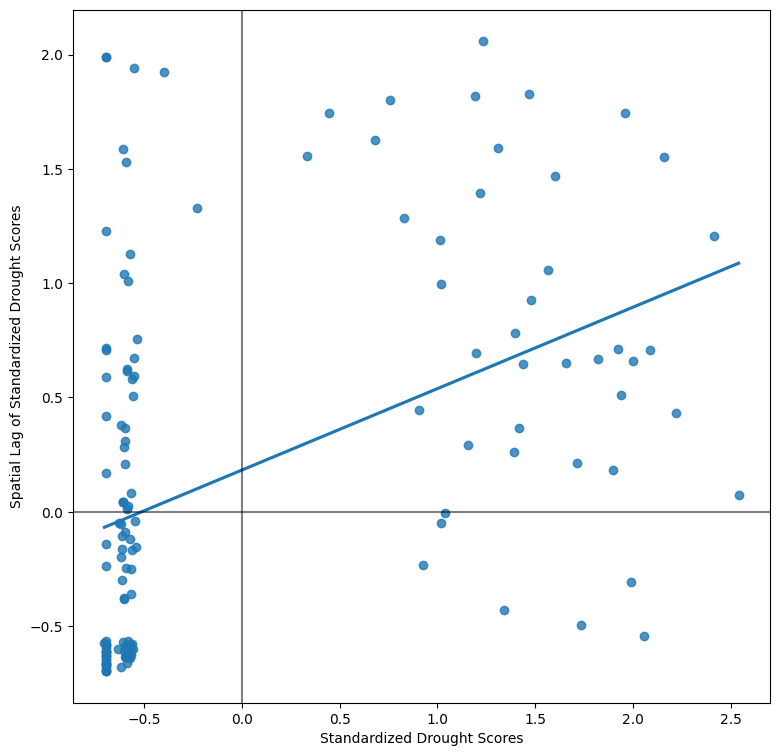

In [49]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot values
sns.regplot(x='EI_06_std', y='w_EI_06_std', data=geoworld_destinationref_2020, ci=None)
# Add vertical and horizontal lines
plt.axvline(0, c='k', alpha=0.5)
plt.axhline(0, c='k', alpha=0.5)
# Set labels for x and y axes
plt.xlabel('Standardized Drought Scores')
plt.ylabel('Spatial Lag of Standardized Drought Scores')
# Display
plt.show()

The figure above displays the relationship between the standardized drougth score (`EI_06_std`) and its spatial lag which, because the $W$ that was used is row-standardized, can be interpreted as the average drought score in the surrounding countries of a given country. In order to guide the interpretation of the plot, a linear fit is also included in the post. This line represents the best linear fit to the scatter plot or, in other words, what is the best way to represent the relationship between the two variables as a straight line. 

The plot displays a positive relationship between both variables. This is associated with the presence of *positive* spatial autocorrelation: similar values tend to be located close to each other. This means that the *overall trend* is for high values to be close to other high values, and for low values to be surrounded by other low values. This however does not mean that this is only situation in the dataset: there can of course be particular cases where high values are surrounded by low ones, and viceversa. But it means that, if we had to summarize the main pattern of the data in terms of how clustered similar values are, the best way would be to say they are positively correlated and, hence, clustered over space.

In the context of the example, this can be interpreted along the lines of: countries display positive spatial autocorrelation in the way they score for drought situations. This means that countries with high drought scores tend to be located nearby other countries where a significant share also has a high drought score, and viceversa.

It is important to mention that there is a lot of spread in this plot, so many times also high drought score countries are next to low drought score countries and vice versa. There is not really a very clear trend.

### Moran's I <a class="anchor" id="section3_2"></a>

"The Moran Plot is an excellent tool to explore the data and get a good sense of how much values are clustered over space. However, because it is a graphical device, it is sometimes hard to condense its insights into a more concise way. For these cases, a good approach is to come up with a statistical measure that summarizes the figure. This is exactly what Moran's I is meant to do. 

Very much in the same way the mean summarizes a crucial element of the distribution of values in a non-spatial setting, so does Moran's I for a spatial dataset. Continuing the comparison, we can think of the mean as a single numerical value summarizing a histogram or a kernel density plot. Similarly, Moran's I captures much of the essence of the Moran Plot. In fact, there is an even close connection between the two: the value of Moran's I corresponds with the slope of the linear fit overlayed on top of the Moran Plot.

In order to calculate Moran's I in our dataset, we can call a specific function in `PySAL` directly:

In [50]:
from pysal.explore import esda
mi = esda.Moran(geoworld_destinationref_2020['EI_06'], w_queen)

C:\Users\thoma\Anaconda3\envs\thesis\Lib\site-packages\spaghetti\network.py:42: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


Note how we do not need to use the standardized version in this context as we will not represent it visually.

The method `ps.Moran` creates an object that contains much more information than the actual statistic. If we want to retrieve the value of the statistic, we can do it this way:

In [51]:
mi.I

0.3558034508743719

The other bit of information we will extract from Moran's I relates to statistical inference: how likely is the pattern we observe in the map and Moran's I captures in its value to be generated by an entirely random process? If we considered the same variable but shuffled its locations randomly, would we obtain a map with similar characteristics?

The specific details of the mechanism to calculate this are beyond the scope of this research, but it is important to know that a small enough p-value associated with the Moran's I of a map allows to reject the hypothesis that the map is random. In other words, we can conclude that the map displays more spatial pattern that we would expect if the values had been randomly allocated to a particular location.

The most reliable p-value for Moran's I can be found in the attribute `p_sim`:

In [52]:
mi.p_sim

0.001

That is just 0.1% and, by standard terms, it would be considered statistically significant. We can quickly ellaborate on its intuition. What that 0.001 (or 0.1%) means is that, if we generated a large number of maps with the same values but randomly allocated over space, and calculated the Moran's I statistic for each of those maps, only 0.1% of them would display a larger (absolute) value than the one we obtain from the real data, and the other 99.9% of the random maps would receive a smaller (absolute) value of Moran's I. If we remember again that the value of Moran's I can also be interpreted as the slope of the Moran Plot, what we have is that, in this case, the particular spatial arrangement of values for the drought scores is more concentrated than if the values had been allocated following a completely spatially random process, hence the statistical significance.

Once we have calculated Moran's I and created an object like `mi`, we can use some of the functionality in `splot` to replicate the plot above more easily.

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Moran Scatterplot (0.36)'}, xlabel='Attribute', ylabel='Spatial Lag'>)

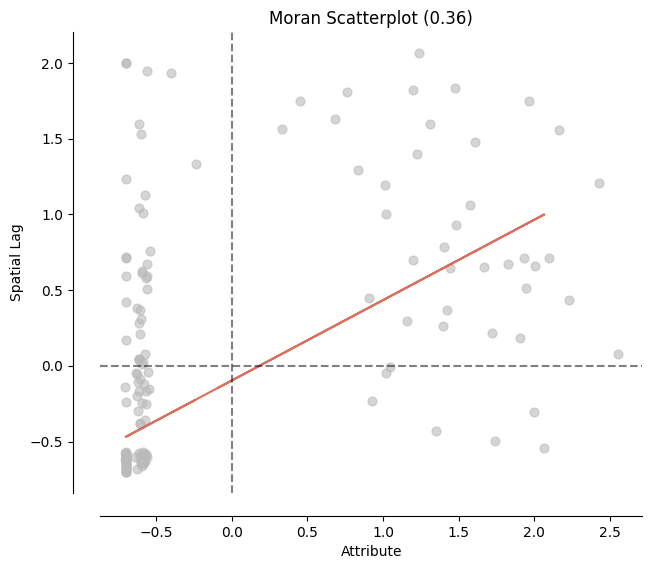

In [53]:
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation
moran_scatterplot(mi)

As a first step, the global autocorrelation analysis can teach us that observations do seem to be positively correlated over space. In terms of our initial goal to find spatial structure in the drought score, this view seems to align (partly due to high degree of spread): if the score had no such structure, it should not show a pattern over space -technically, it would show a random one.

## Local Spatial autocorrelation <a class="anchor" id="chapter4"></a>

Moran's I is good tool to summarize a dataset into a single value that informs about its degree of *clustering*. However, it is not an appropriate measure to identify areas within the map where specific values are located. In other words, Moran's I can tell us values are clustered overall, but it will not inform us about *where* the clusters are. For that purpose, we need to use a *local* measure of spatial autocorrelation. Local measures consider each single observation in a dataset and operate on them, as oposed to on the overall data, as *global* measures do. Because of that, they are not good a summarizing a map, but they allow to obtain further insight.

In this session, we will consider [Local Indicators of Spatial Association](http://onlinelibrary.wiley.com/doi/10.1111/j.1538-4632.1995.tb00338.x/abstract) (LISAs), a local counter-part of global measures like Moran's I. At the core of these method is a classification of the observations in a dataset into four groups derived from the Moran Plot: high values surrounded by high values (HH), low values nearby other low values (LL), high values among low values (HL), and viceversa (LH). Each of these groups are typically called "quadrants". An illustration of where each of these groups fall into the Moran Plot can be seen below:

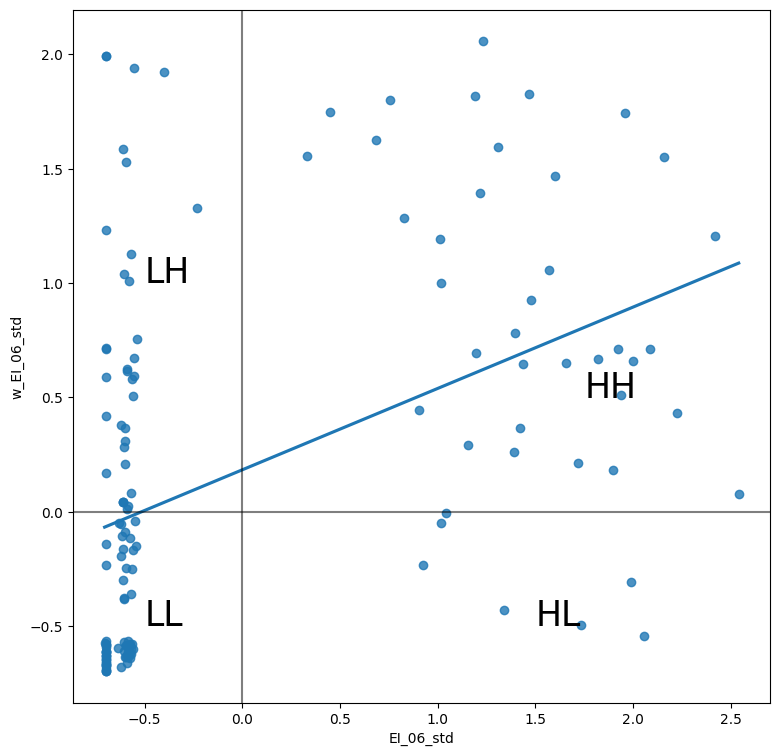

In [54]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot values
sns.regplot(x='EI_06_std', y='w_EI_06_std', data=geoworld_destinationref_2020, ci=None)
# Add vertical and horizontal lines
plt.axvline(0, c='k', alpha=0.5)
plt.axhline(0, c='k', alpha=0.5)
plt.text(1.75, 0.5, "HH", fontsize=25)
plt.text(1.5, -0.5, "HL", fontsize=25)
plt.text(-0.5, 1, "LH", fontsize=25)
plt.text(-0.5, -0.5, "LL", fontsize=25)
# Display
plt.show()

So far we have classified each observation in the dataset depending on its value and that of its neighbors. This is only half way into identifying areas of unusual concentration of values. To know whether each of the locations is a *statistically significant* cluster of a given kind, we again need to compare it with what we would expect if the data were allocated in a completely random way. After all, by definition, every observation will be of one kind of another, based on the comparison above. However, what we are interested in is whether the strength with which the values are concentrated is unusually high. 

This is exactly what LISAs are designed to do. As before, a more detailed description of their statistical underpinnings is beyond the scope in this context, but I will try to shed some light into the intuition of how they go about it. The core idea is to identify cases in which the comparison between the value of an observation and the average of its neighbors is either more similar (HH, LL) or dissimilar (HL, LH) than we would expect from pure chance. The mechanism to do this is similar to the one in the global Moran's I, but applied in this case to each observation, resulting then in as many statistics as original observations.

LISAs are widely used in many fields to identify clusters of values in space. They are a very useful tool that can quickly return areas in which values are concentrated and provide *suggestive* evidence about the processes that might be at work. For that, they have a prime place in the exploratory toolbox. Examples of contexts where LISAs can be useful include: identification of spatial clusters of poverty in regions, detection of ethnic enclaves, delineation of areas of particularly high/low activity of any phenomenon, etc.

In Python, we can calculate LISAs in a very streamlined way thanks to `PySAL`:

In [55]:
lisa = esda.Moran_Local(geoworld_destinationref_2020['EI_06'], w_queen)

All we need to pass is the variable of interest and the spatial weights that describes the neighborhood relations between the different observation that make up the dataset.

Because of their very nature, looking at the numerical result of LISAs is not always the most useful way to exploit all the information they can provide. Remember that we are calculating a statistic for every sigle observation in the data so, if we have many of them, it will be difficult to extract any meaningful pattern. Instead, what is typically done is to create a map, a cluster map as it is usually called, that extracts the significant observations (those that are highly unlikely to have come from pure chance) and plots them with a specific color depending on their quadrant category.

All of the needed pieces are contained inside the `lisa` object we have created above. But, to make the map making more straightforward, it is convenient to pull them out and insert them in the main data table:

In [56]:
# Break observations into significant or not
geoworld_destinationref_2020['significant'] = lisa.p_sim < 0.05
# Store the quadrant they belong to
geoworld_destinationref_2020['quadrant'] = lisa.q

Let us stop for second on these two steps. First, the `significant` column. Similarly as with global Moran's I, `PySAL` is automatically computing a p-value for each LISA. Because not every observation represents a statistically significant one, we want to identify those with a p-value small enough that rules out the possibility of obtaining a similar situation from pure chance. Following a similar reasoning as with global Moran's I, we select 5% as the threshold for statistical significance. To identify these values, we create a variable, `significant`, that contains `True` if the p-value of the observation is satisfies the condition, and `False` otherwise. We can check this is the case:

In [57]:
geoworld_destinationref_2020['significant'].head()

Country
Afghanistan    False
Albania         True
Algeria        False
Angola          True
Argentina       True
Name: significant, dtype: bool

In [58]:
geoworld_destinationref_2020['quadrant'].head()

Country
Afghanistan    3
Albania        3
Algeria        4
Angola         1
Argentina      1
Name: quadrant, dtype: int32

The correspondence between the numbers in the variable and the actual quadrants is as follows:

* 1: HH
* 2: LH
* 3: LL
* 4: HL

With these two elements, `significant` and `quadrant`, we can build a typical LISA cluster map combining the mapping skills with what we have learned about subsetting and querying tables:

We can create a quick LISA cluster map with `splot`:

(<Figure size 640x480 with 1 Axes>, <Axes: >)

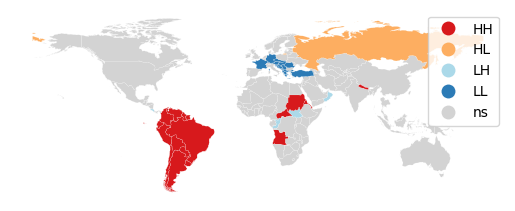

In [59]:
lisa_cluster(lisa, geoworld_destinationref_2020)

Or, if we want to have more control over what is being displayed, and how each component is presented, we can "cook" the plot ourselves" (Trivik, 2021):

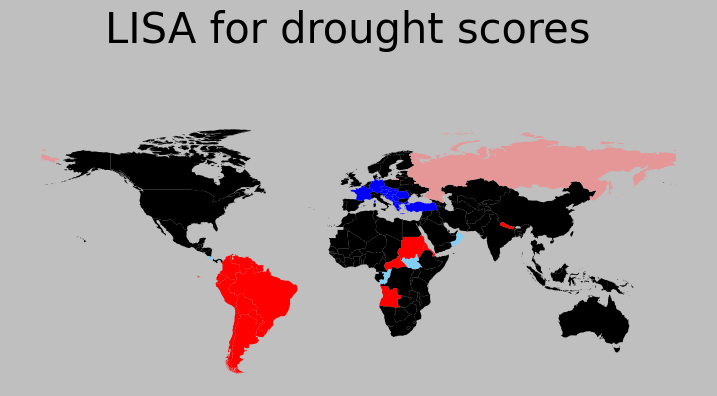

In [60]:
# Ensure geometries are valid
geoworld_destinationref_2020 = geoworld_destinationref_2020[geoworld_destinationref_2020.is_valid]

# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(9, 5))

# Plot insignificant clusters
ns = geoworld_destinationref_2020.loc[geoworld_destinationref_2020['significant'] == False, 'geometry']
if not ns.empty:
    ns.plot(ax=ax, color='k')

# Plot HH clusters
hh = geoworld_destinationref_2020.loc[(geoworld_destinationref_2020['quadrant'] == 1) & (geoworld_destinationref_2020['significant'] == True), 'geometry']
if not hh.empty:
    hh.plot(ax=ax, color='red')

# Plot LL clusters
ll = geoworld_destinationref_2020.loc[(geoworld_destinationref_2020['quadrant'] == 3) & (geoworld_destinationref_2020['significant'] == True), 'geometry']
if not ll.empty:
    ll.plot(ax=ax, color='blue')

# Plot LH clusters
lh = geoworld_destinationref_2020.loc[(geoworld_destinationref_2020['quadrant'] == 2) & (geoworld_destinationref_2020['significant'] == True), 'geometry']
if not lh.empty:
    lh.plot(ax=ax, color='#83cef4')

# Plot HL clusters
hl = geoworld_destinationref_2020.loc[(geoworld_destinationref_2020['quadrant'] == 4) & (geoworld_destinationref_2020['significant'] == True), 'geometry']
if not hl.empty:
    hl.plot(ax=ax, color='#e59696')

# Style and draw
f.suptitle('LISA for drought scores', size=30)
f.set_facecolor('0.75')
ax.set_axis_off()

# Manually set aspect ratio if needed
ax.set_aspect('equal')

plt.show()


The map above displays the LISA results of the Drougth scores. In bright red, we find those countries with an unusual concentration of high scores surrounded also by high drought levels. This corresponds with areas in South America and Central Africa. 
In light blue, we find the first and only type of *spatial outliers*. These are countries with low drought scores but surrounded by countries with high drought levels (eg. also in Central Africa).

The substantive interpretation of a LISA map needs to relate its output to the original intention of the analyst who created the map. In this case, our original idea was to explore the spatial structure of drought scores. The LISA proves a fairly useful tool in this context. Comparing the LISA map above with the choropleth we made earlier (visual, descriptive analysis), we can interpret the LISA as "simplification" of the detailed but perhaps too complicated picture in the choropleth that focuses the reader's attention to the areas that display a particularly high concentration of (dis)similar values, helping the spatial structure of the drought levels emerge in a more explicit way. The result of this highlights the relevance that the mainy in South America very bad drought levels (high) are occuring, as well as the countries in Europe on the map where there are a lower drought values surrounded by each other.

The results from the LISA statistics can be connected to the Moran plot to visualise where in the scatter plot each type of polygon falls:

(<Figure size 1500x400 with 3 Axes>,
 array([<Axes: title={'center': 'Moran Local Scatterplot'}, xlabel='Attribute', ylabel='Spatial Lag'>,
        <Axes: >, <Axes: >], dtype=object))

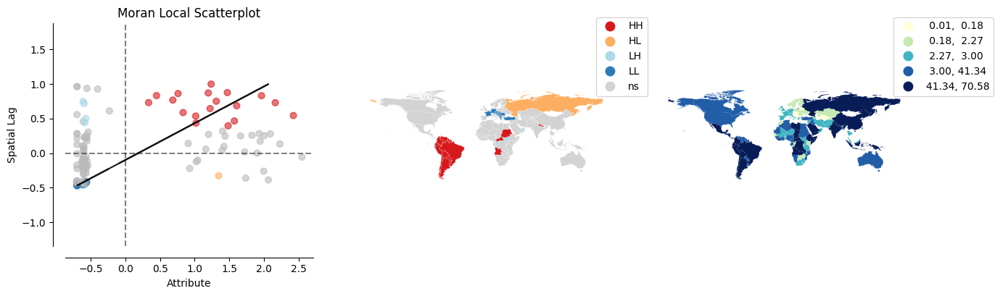

In [61]:
plot_local_autocorrelation(lisa, geoworld_destinationref_2020, 'EI_06')

# Analysis for all years refugee orgin data with drought indicator

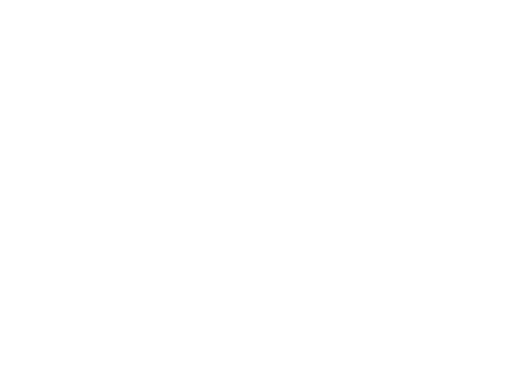

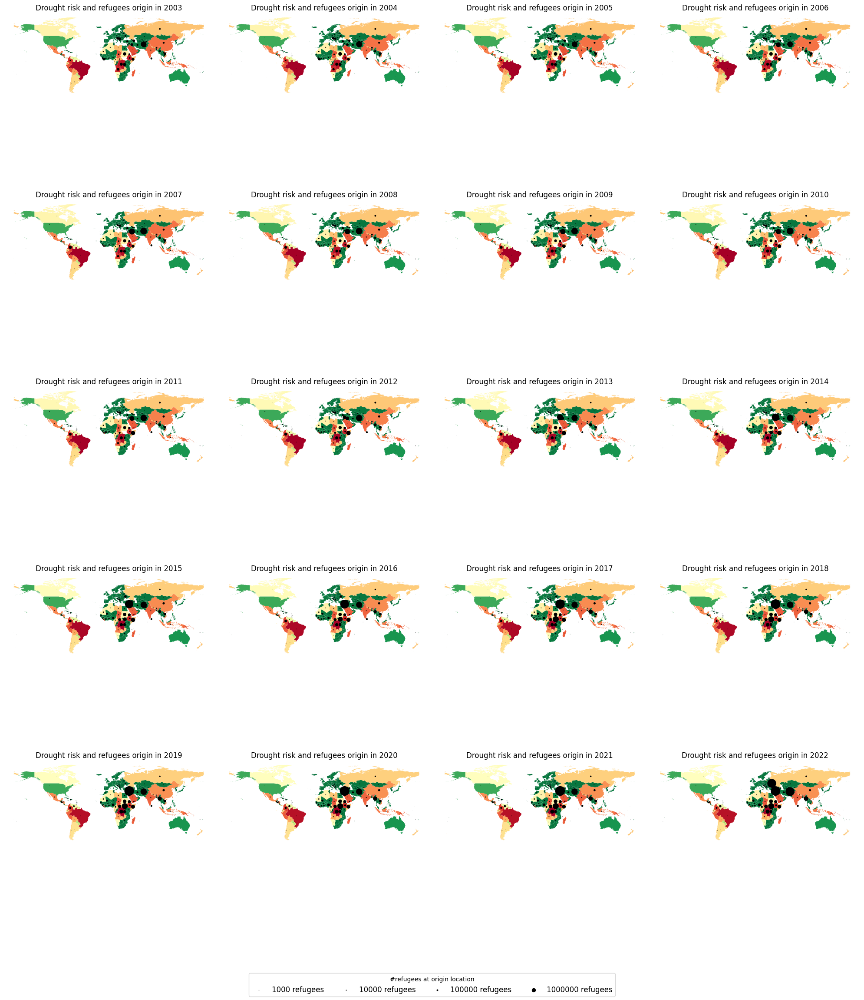

In [62]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import warnings
from shapely.errors import ShapelyDeprecationWarning

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

plt.axis('off')

# Filter and plot data for each year
years = list(range(2003, 2023))  # Years from 2003 to 2022
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # 5 rows, 4 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year = geoworld_originref[geoworld_originref['Year'] == year]

    # lat lon projection
    geoworld_year = geoworld_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        geoworld_year['centroid'] = geoworld_year.geometry.centroid

    ax = axs[i // 4, i % 4]  # Calculate the position in the grid

    # Plot the geometry column with the values from another column
    geoworld_year.plot(column='EI_06', cmap='RdYlGn_r', legend=False, ax=ax)

    # Plot centroids as scatter points
    ax.scatter(geoworld_year['centroid'].x, geoworld_year['centroid'].y, color='black', s=geoworld_year['#refugees_origin'] / 30000)

    # Remove the axes
    ax.axis('off')

    # Set the title for each subplot
    ax.set_title(f'Drought risk and refugees origin in {year}')

# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at origin location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.2)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend

plt.show()


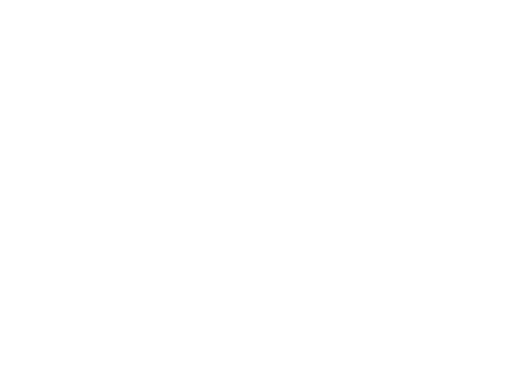

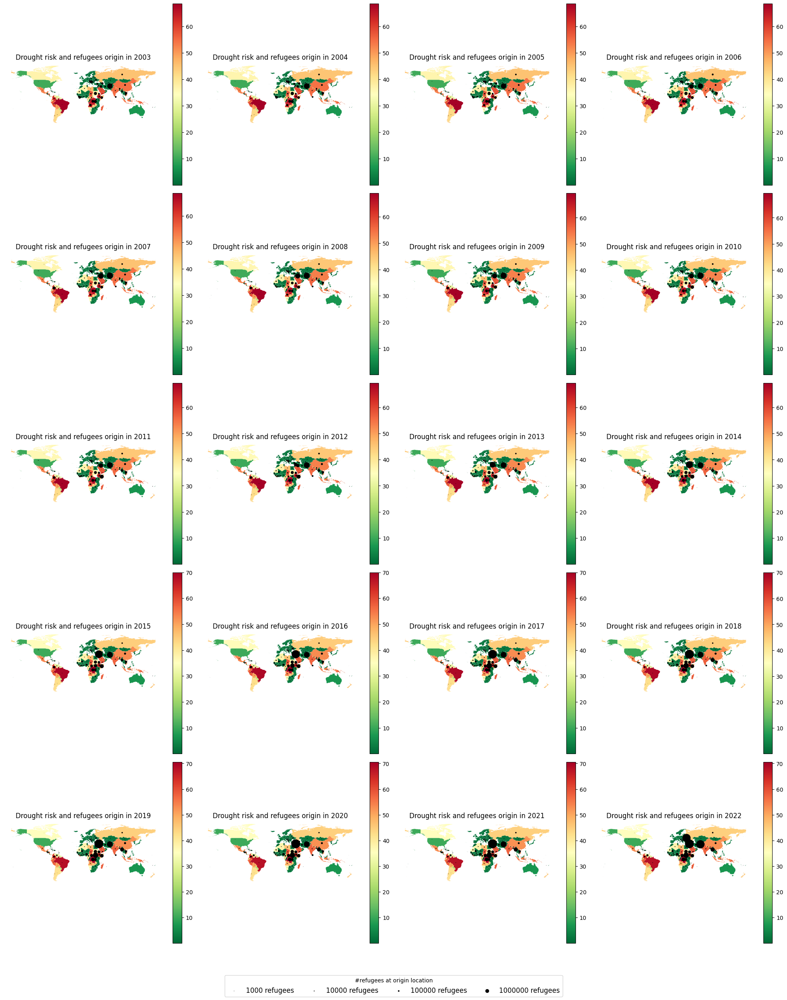

In [63]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import warnings
from shapely.errors import ShapelyDeprecationWarning

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

plt.axis('off')

# Filter and plot data for each year
years = list(range(2003, 2023))  # Years from 2003 to 2022
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # 5 rows, 4 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year = geoworld_originref[geoworld_originref['Year'] == year]

    # lat lon projection
    geoworld_year = geoworld_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        geoworld_year['centroid'] = geoworld_year.geometry.centroid

    ax = axs[i // 4, i % 4]  # Calculate the position in the grid

    # Plot the geometry column with the values from another column
    geoworld_year.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax)

    # Plot centroids as scatter points
    ax.scatter(geoworld_year['centroid'].x, geoworld_year['centroid'].y, color='black', s=geoworld_year['#refugees_origin'] / 30000)

    # Remove the axes
    ax.axis('off')

    # Set the title for each subplot
    ax.set_title(f'Drought risk and refugees origin in {year}')

fig.tight_layout(rect=[0.5, 0.4, 1, 1])
# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at origin location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.2)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend

plt.show()

One can immidiately see that drought scores do now really seem to change over 20 years. Refugee fleeing from a certain country, the numbers, do change a bit more over years, but are also always quite high in Central Africa and the Middle East.

Select 25 countries mot people come from over years and plot these to identify changes.

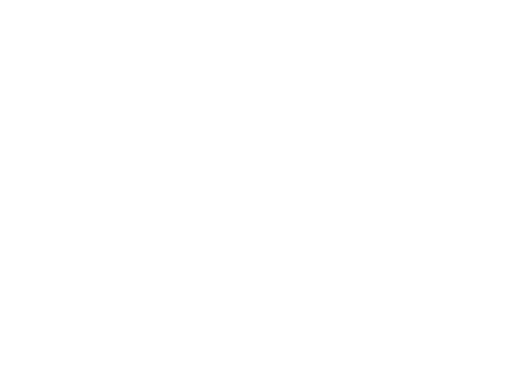

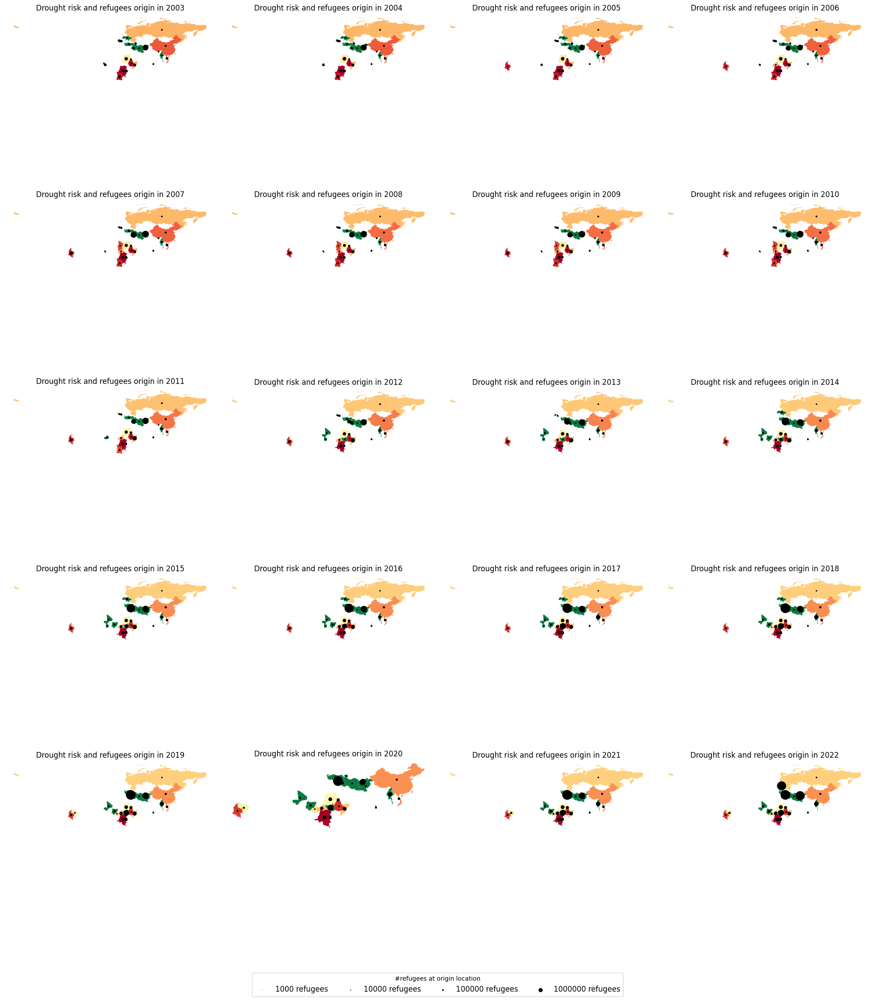

In [64]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import warnings
from shapely.errors import ShapelyDeprecationWarning

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

plt.axis('off')

# Filter and plot data for each year
years = list(range(2003, 2023))  # Years from 2003 to 2022
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # 5 rows, 4 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year = geoworld_originref[geoworld_originref['Year'] == year]

     # Select the top 25 countries with the highest refugee numbers for that year
    top_25_origins_year = geoworld_year.nlargest(25, '#refugees_origin')
    
    # Convert to lat lon projection
    top_25_origins_year = top_25_origins_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        top_25_origins_year['centroid'] = top_25_origins_year.geometry.centroid

    ax = axs[i // 4, i % 4]  # Calculate the position in the grid

    # Plot the geometry column with the values from another column
    top_25_origins_year.plot(column='EI_06', cmap='RdYlGn_r', legend=False, ax=ax)

    # Plot centroids as scatter points
    ax.scatter(top_25_origins_year['centroid'].x, top_25_origins_year['centroid'].y, color='black', s=top_25_origins_year['#refugees_origin'] / 30000)

    # Remove the axes
    ax.axis('off')

    # Set the title for each subplot
    ax.set_title(f'Drought risk and refugees origin in {year}')

# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at origin location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.2)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend
plt.show()

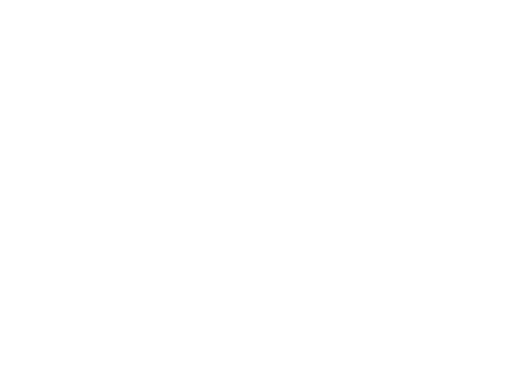

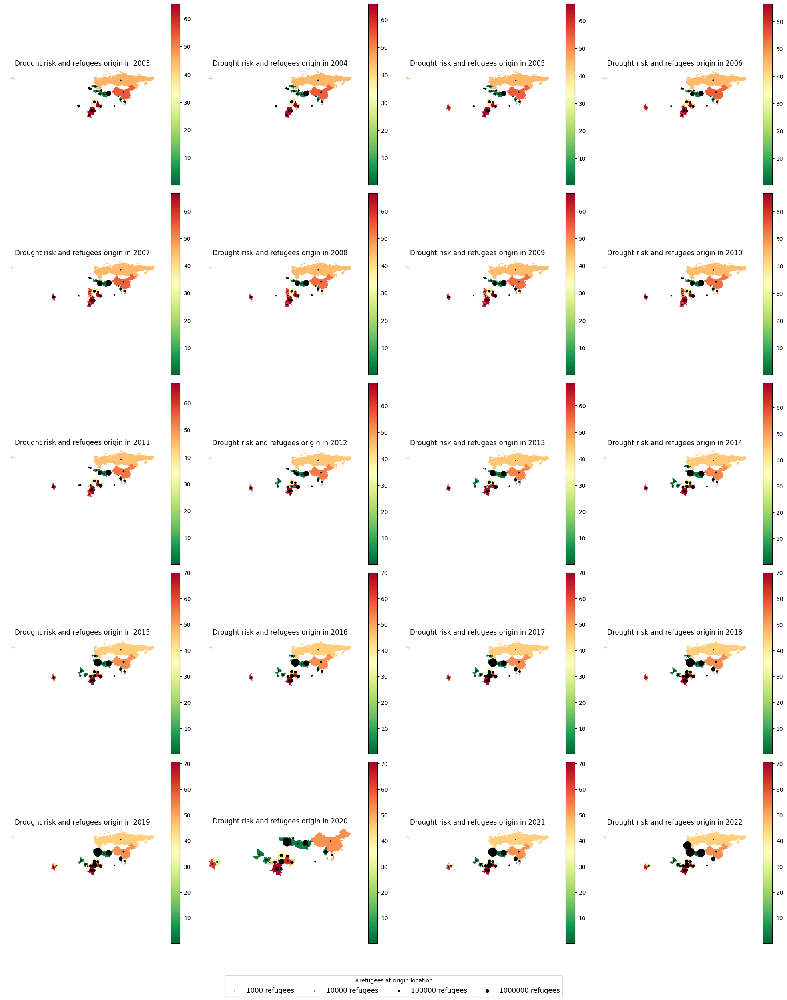

In [65]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import warnings
from shapely.errors import ShapelyDeprecationWarning

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

plt.axis('off')

# Filter and plot data for each year
years = list(range(2003, 2023))  # Years from 2003 to 2022
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # 5 rows, 4 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year = geoworld_originref[geoworld_originref['Year'] == year]

     # Select the top 25 countries with the highest refugee numbers for that year
    top_25_origins_year = geoworld_year.nlargest(25, '#refugees_origin')
    
    # Convert to lat lon projection
    top_25_origins_year = top_25_origins_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        top_25_origins_year['centroid'] = top_25_origins_year.geometry.centroid

    ax = axs[i // 4, i % 4]  # Calculate the position in the grid

    # Plot the geometry column with the values from another column
    top_25_origins_year.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax)

    # Plot centroids as scatter points
    ax.scatter(top_25_origins_year['centroid'].x, top_25_origins_year['centroid'].y, color='black', s=top_25_origins_year['#refugees_origin'] / 30000)

    # Remove the axes
    ax.axis('off')

    # Set the title for each subplot
    ax.set_title(f'Drought risk and refugees origin in {year}')

# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at origin location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.2)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend
plt.show()

It immidiately seems to be that the refugee numbers and the drought score does not change heavily over time.

# Analysis for all years refugee destination data with drought indicator

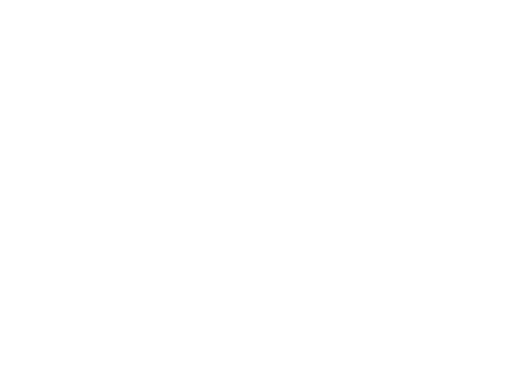

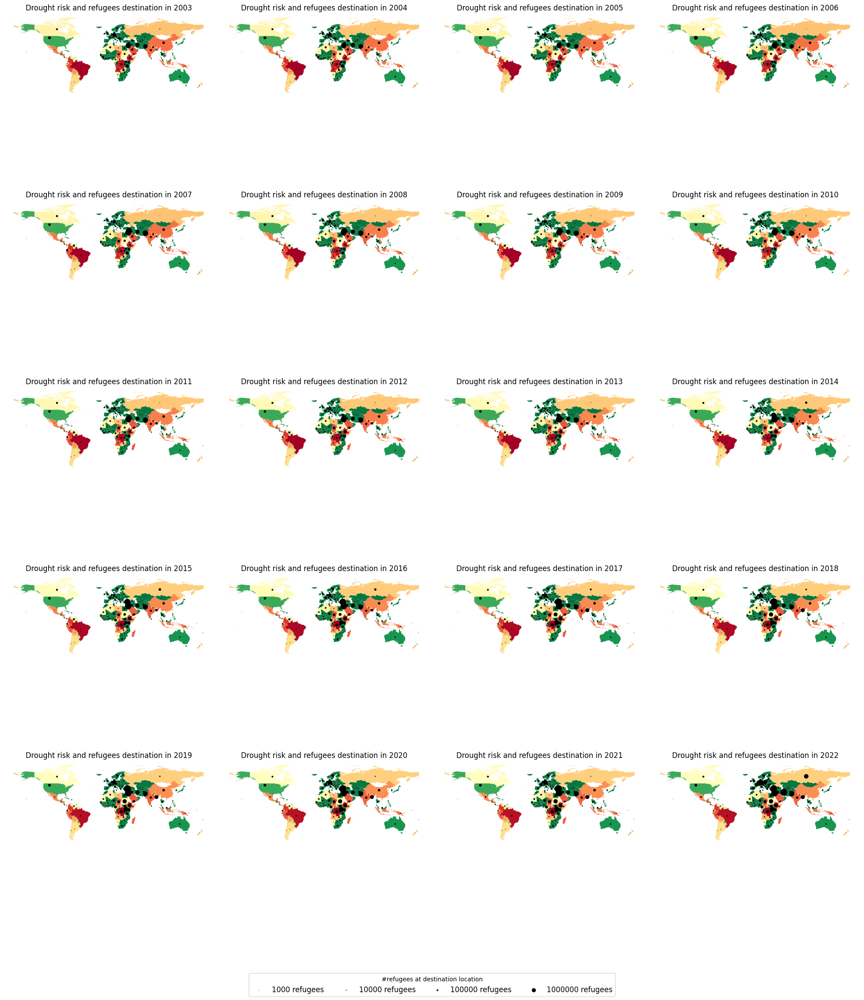

In [66]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import warnings
from shapely.errors import ShapelyDeprecationWarning

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

plt.axis('off')

# Filter and plot data for each year
years = list(range(2003, 2023))  # Years from 2003 to 2022
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # 5 rows, 4 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # lat lon projection
    geoworld_year = geoworld_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        geoworld_year['centroid'] = geoworld_year.geometry.centroid

    ax = axs[i // 4, i % 4]  # Calculate the position in the grid

    # Plot the geometry column with the values from another column
    geoworld_year.plot(column='EI_06', cmap='RdYlGn_r', legend=False, ax=ax)

    # Plot centroids as scatter points
    ax.scatter(geoworld_year['centroid'].x, geoworld_year['centroid'].y, color='black', s=geoworld_year['#refugees_destination'] / 30000)

    # Remove the axes
    ax.axis('off')

    # Set the title for each subplot
    ax.set_title(f'Drought risk and refugees destination in {year}')

# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at destination location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.2)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend
plt.show()


One can immidiately see that drought scores do now really seem to change over 20 years. Refugee fleeing to a certain country, the numbers, do change a bit more over years, but are also always quite high in Central Africa and the Middle East, in countries next from where they flee from. But also, refugee destination location numbers are high in North America and Europe.

Select 25 countries mot people go to over years and plot these to identify changes.

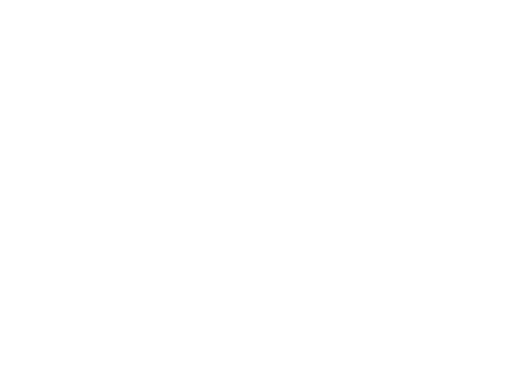

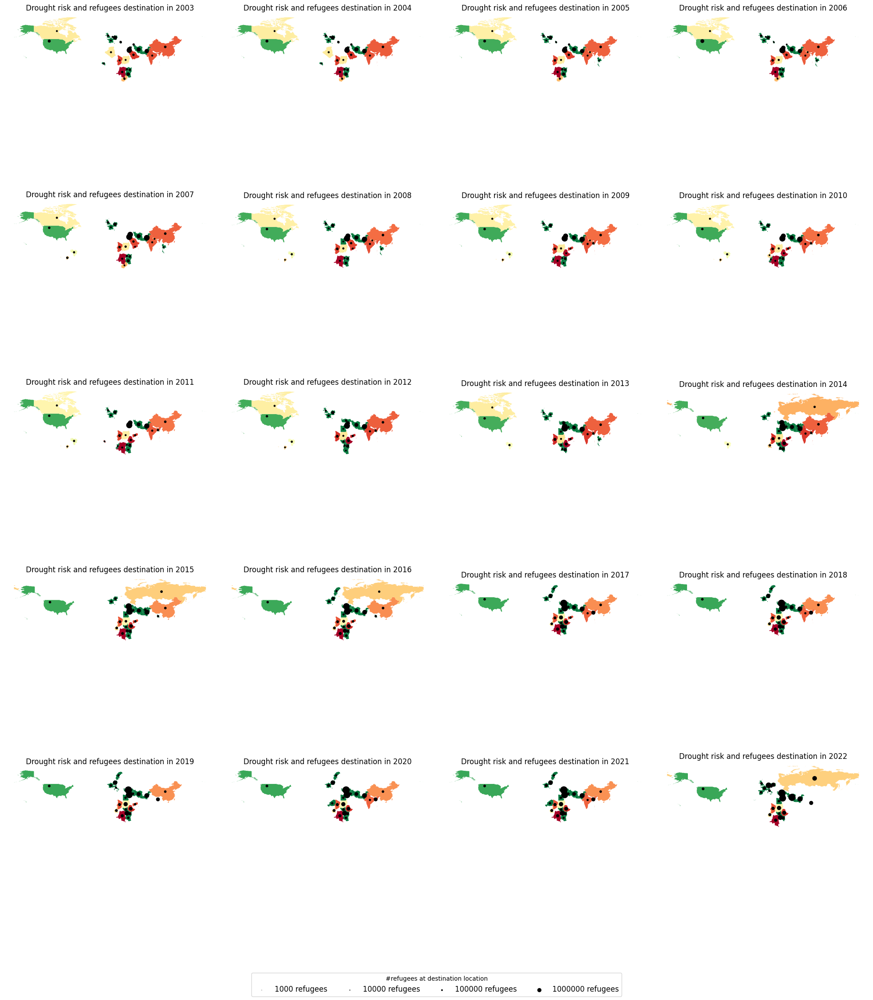

In [67]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import warnings
from shapely.errors import ShapelyDeprecationWarning

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

plt.axis('off')

# Filter and plot data for each year
years = list(range(2003, 2023))  # Years from 2003 to 2022
fig, axs = plt.subplots(5, 4, figsize=(20, 25))  # 5 rows, 4 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

     # Select the top 25 countries with the highest refugee numbers for that year
    top_25_destinations_year = geoworld_year.nlargest(25, '#refugees_destination')
    #print(top_25_destinations_year.Country)
    
    # Convert to lat lon projection
    top_25_destinations_year = top_25_destinations_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        top_25_destinations_year['centroid'] = top_25_destinations_year.geometry.centroid

    ax = axs[i // 4, i % 4]  # Calculate the position in the grid

    # Plot the geometry column with the values from another column
    top_25_destinations_year.plot(column='EI_06', cmap='RdYlGn_r', legend=False, ax=ax)

    # Plot centroids as scatter points
    ax.scatter(top_25_destinations_year['centroid'].x, top_25_destinations_year['centroid'].y, color='black', s=top_25_destinations_year['#refugees_destination'] / 30000)

    # Remove the axes
    ax.axis('off')

    # Set the title for each subplot
    ax.set_title(f'Drought risk and refugees destination in {year}')

# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at destination location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.2)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend
plt.show()

It immidiately seems to be that the refugee numbers and the drought score does not change heavily over time.

# Comparison 25 countries most people flee from and go to, over years

This, the comparison between origin and destination analysis is the most important analysis for this part (subquestion 3). We saw earlier, in the extensive explanation for one year only (2020 above in this notebook) that the data for drougth scores is NOT normally distributed and that we have small groups (only 25 countries) so we cannot use an independent t-test, and normally we should use a Mann-Whitney U test (https://statistics.laerd.com/spss-tutorials/mann-whitney-u-test-using-spss-statistics.php#:~:text=The%20Mann%2DWhitney%20U%20test,continuous%2C%20but%20not%20normally%20distributed). However, the groups overlap to much to do a independent t-test or an non-parametric alternative. The refugee origin as destination countries overlap partly. So, we will conduct other tests. See the report that belongs to this analysis notebook.

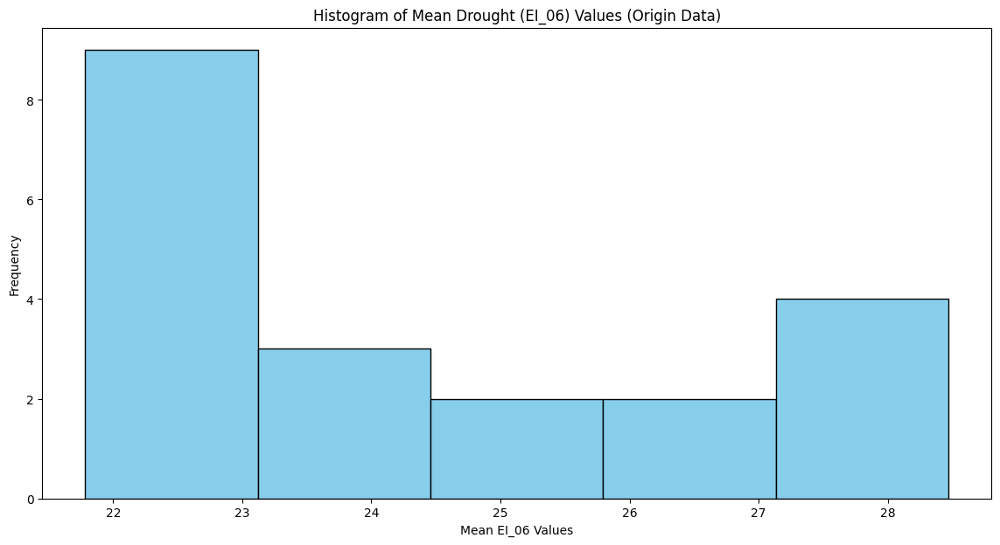

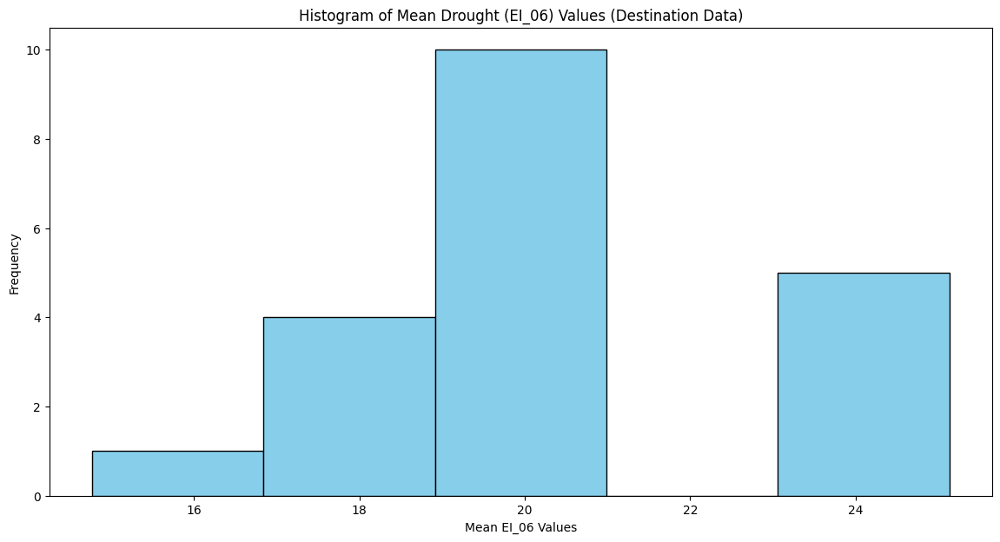

In [68]:
# 1) checking histograms for normality

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize lists to store the means
origin_means = []
destination_means = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year for origin and destination
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for origin and destination
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')

    # Calculate the mean of EI_06 values for the top 25 countries for origin and destination
    origin_mean = top_25_origins_year['EI_06'].mean()
    destination_mean = top_25_destinations_year['EI_06'].mean()

    # Store the means in the lists
    origin_means.append(origin_mean)
    destination_means.append(destination_mean)

# Plot the histogram of the means for origin data
plt.figure(figsize=(14, 7))
plt.hist(origin_means, bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Mean EI_06 Values')
plt.ylabel('Frequency')
plt.title('Histogram of Mean Drought (EI_06) Values (Origin Data)')
plt.show()

# Plot the histogram of the means for destination data
plt.figure(figsize=(14, 7))
plt.hist(destination_means, bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Mean EI_06 Values')
plt.ylabel('Frequency')
plt.title('Histogram of Mean Drought (EI_06) Values (Destination Data)')
plt.show()


In [69]:
# Test for non-normality check
shapiro_stat, shapiro_p_value = stats.shapiro(origin_means)
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.8267221199636741, p-value = 0.002224991742260866
Reject the null hypothesis: The data is not normally distributed.


In [70]:
# Test for non-normality check
shapiro_stat, shapiro_p_value = stats.shapiro(destination_means)
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.9115904608272078, p-value = 0.06834643131984762
Fail to reject the null hypothesis: The data is normally distributed.


NOT both normally ditributed, so will use the Mann-Whitney U test again.

In [71]:
# 1) 

import pandas as pd
from scipy.stats import mannwhitneyu

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(origin_means, destination_means, alternative='two-sided')

# Output the test statistic and p-value
print("U-statistic:", statistic)
print("p-value:", p_value)

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between the two groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between the two groups.")


U-statistic: 344.0
p-value: 0.0001035787358239986
Reject the null hypothesis. There is a significant difference between the two groups.


In [72]:
# Convert data to numpy array for ease of calculations
data_np = np.array(origin_means)

# Descriptive statistics
mean = np.mean(data_np)
median = np.median(data_np)
std_dev = np.std(data_np, ddof=1)  # Sample standard deviation
variance = np.var(data_np, ddof=1)  # Sample variance
minimum = np.min(data_np)
maximum = np.max(data_np)
range_ = np.ptp(data_np)  # Range
skewness = stats.skew(data_np)
kurtosis = stats.kurtosis(data_np)
quartiles = np.percentile(data_np, [25, 50, 75])
iqr = stats.iqr(data_np)  # Interquartile range

# Putting it all together
descriptive_stats = {
    'Mean': mean,
    'Median': median,
    'Standard Deviation': std_dev,
    'Variance': variance,
    'Minimum': minimum,
    'Maximum': maximum,
    'Range': range_,
    'Skewness': skewness,
    'Kurtosis': kurtosis,
    '25th Percentile': quartiles[0],
    '50th Percentile (Median)': quartiles[1],
    '75th Percentile': quartiles[2],
    'Interquartile Range': iqr
}

# Convert to pandas DataFrame for better readability
descriptive_stats_df = pd.DataFrame(descriptive_stats, index=[0])
descriptive_stats_df

,Mean,Median,Standard Deviation,Variance,Minimum,Maximum,Range,Skewness,Kurtosis,25th Percentile,50th Percentile (Median),75th Percentile,Interquartile Range
0,24.29146,23.3912,2.523805,6.369591,21.784,28.4692,6.6852,0.638894,-1.102729,22.0895,23.3912,26.1726,4.0831


In [73]:
# Convert data to numpy array for ease of calculations
data_np = np.array(destination_means)

# Descriptive statistics
mean = np.mean(data_np)
median = np.median(data_np)
std_dev = np.std(data_np, ddof=1)  # Sample standard deviation
variance = np.var(data_np, ddof=1)  # Sample variance
minimum = np.min(data_np)
maximum = np.max(data_np)
range_ = np.ptp(data_np)  # Range
skewness = stats.skew(data_np)
kurtosis = stats.kurtosis(data_np)
quartiles = np.percentile(data_np, [25, 50, 75])
iqr = stats.iqr(data_np)  # Interquartile range

# Putting it all together
descriptive_stats = {
    'Mean': mean,
    'Median': median,
    'Standard Deviation': std_dev,
    'Variance': variance,
    'Minimum': minimum,
    'Maximum': maximum,
    'Range': range_,
    'Skewness': skewness,
    'Kurtosis': kurtosis,
    '25th Percentile': quartiles[0],
    '50th Percentile (Median)': quartiles[1],
    '75th Percentile': quartiles[2],
    'Interquartile Range': iqr
}

# Convert to pandas DataFrame for better readability
descriptive_stats_df = pd.DataFrame(descriptive_stats, index=[0])
descriptive_stats_df

,Mean,Median,Standard Deviation,Variance,Minimum,Maximum,Range,Skewness,Kurtosis,25th Percentile,50th Percentile (Median),75th Percentile,Interquartile Range
0,20.0765,19.6614,2.68006,7.182721,14.7708,25.1344,10.3636,0.331258,-0.437765,18.8631,19.6614,20.8939,2.0308


Now median over medians test instead of median over means test.

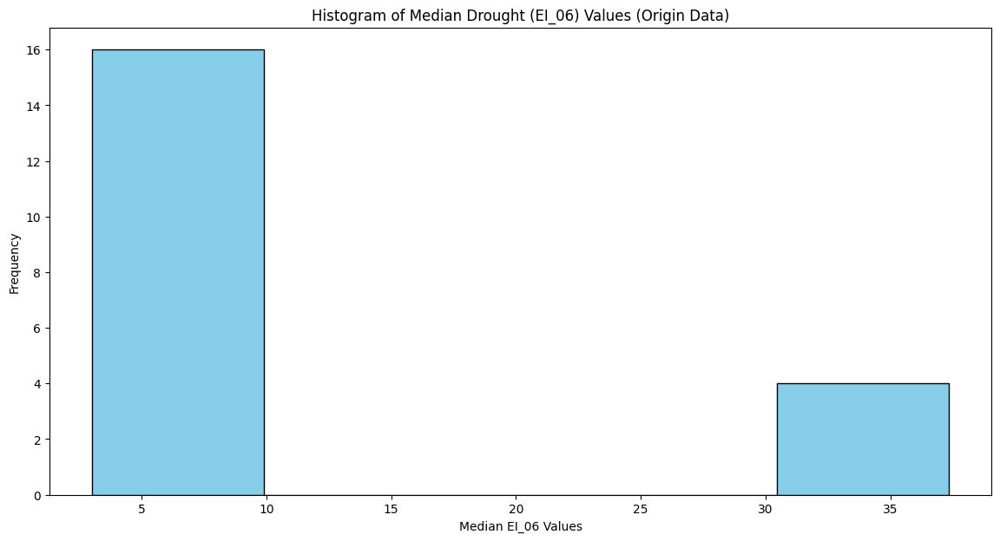

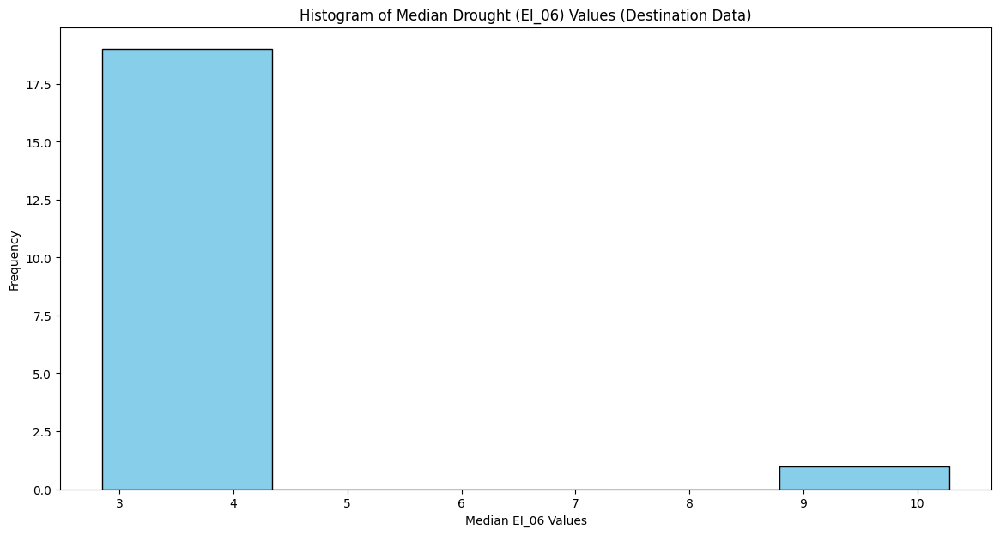

In [74]:
# 1) checking histograms for normality

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize lists to store the means
origin_medians = []
destination_medians = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year for origin and destination
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for origin and destination
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')

    # Calculate the median of EI_06 values for the top 25 countries for origin and destination
    origin_median = top_25_origins_year['EI_06'].median()
    destination_median = top_25_destinations_year['EI_06'].median()

    # Store the means in the lists
    origin_medians.append(origin_median)
    destination_medians.append(destination_median)

# Plot the histogram of the medians for origin data
plt.figure(figsize=(14, 7))
plt.hist(origin_medians, bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Median EI_06 Values')
plt.ylabel('Frequency')
plt.title('Histogram of Median Drought (EI_06) Values (Origin Data)')
plt.show()

# Plot the histogram of the medians for destination data
plt.figure(figsize=(14, 7))
plt.hist(destination_medians, bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Median EI_06 Values')
plt.ylabel('Frequency')
plt.title('Histogram of Median Drought (EI_06) Values (Destination Data)')
plt.show()

In [75]:
# Test for non-normality check
shapiro_stat, shapiro_p_value = stats.shapiro(origin_medians)
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.5025988733193121, p-value = 3.3558026054303275e-07
Reject the null hypothesis: The data is not normally distributed.


In [76]:
# Test for non-normality check
shapiro_stat, shapiro_p_value = stats.shapiro(destination_medians)
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.29780274957944675, p-value = 7.374937487665793e-09
Reject the null hypothesis: The data is not normally distributed.


In [77]:
# 1) 

import pandas as pd
from scipy.stats import mannwhitneyu

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(origin_medians, destination_medians, alternative='two-sided')

# Output the test statistic and p-value
print("U-statistic:", statistic)
print("p-value:", p_value)

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between the two groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between the two groups.")


U-statistic: 308.0
p-value: 0.0035646854773374033
Reject the null hypothesis. There is a significant difference between the two groups.


In [78]:
# Convert data to numpy array for ease of calculations
data_np = np.array(origin_medians)

# Descriptive statistics
mean = np.mean(data_np)
median = np.median(data_np)
std_dev = np.std(data_np, ddof=1)  # Sample standard deviation
variance = np.var(data_np, ddof=1)  # Sample variance
minimum = np.min(data_np)
maximum = np.max(data_np)
range_ = np.ptp(data_np)  # Range
skewness = stats.skew(data_np)
kurtosis = stats.kurtosis(data_np)
quartiles = np.percentile(data_np, [25, 50, 75])
iqr = stats.iqr(data_np)  # Interquartile range

# Putting it all together
descriptive_stats = {
    'Mean': mean,
    'Median': median,
    'Standard Deviation': std_dev,
    'Variance': variance,
    'Minimum': minimum,
    'Maximum': maximum,
    'Range': range_,
    'Skewness': skewness,
    'Kurtosis': kurtosis,
    '25th Percentile': quartiles[0],
    '50th Percentile (Median)': quartiles[1],
    '75th Percentile': quartiles[2],
    'Interquartile Range': iqr
}

# Convert to pandas DataFrame for better readability
descriptive_stats_df = pd.DataFrame(descriptive_stats, index=[0])
descriptive_stats_df

,Mean,Median,Standard Deviation,Variance,Minimum,Maximum,Range,Skewness,Kurtosis,25th Percentile,50th Percentile (Median),75th Percentile,Interquartile Range
0,9.921,3.195,13.879025,192.627346,3.03,37.33,34.3,1.500078,0.250791,3.1275,3.195,3.2775,0.15


In [79]:
# Convert data to numpy array for ease of calculations
data_np = np.array(destination_medians)

# Descriptive statistics
mean = np.mean(data_np)
median = np.median(data_np)
std_dev = np.std(data_np, ddof=1)  # Sample standard deviation
variance = np.var(data_np, ddof=1)  # Sample variance
minimum = np.min(data_np)
maximum = np.max(data_np)
range_ = np.ptp(data_np)  # Range
skewness = stats.skew(data_np)
kurtosis = stats.kurtosis(data_np)
quartiles = np.percentile(data_np, [25, 50, 75])
iqr = stats.iqr(data_np)  # Interquartile range

# Putting it all together
descriptive_stats = {
    'Mean': mean,
    'Median': median,
    'Standard Deviation': std_dev,
    'Variance': variance,
    'Minimum': minimum,
    'Maximum': maximum,
    'Range': range_,
    'Skewness': skewness,
    'Kurtosis': kurtosis,
    '25th Percentile': quartiles[0],
    '50th Percentile (Median)': quartiles[1],
    '75th Percentile': quartiles[2],
    'Interquartile Range': iqr
}

# Convert to pandas DataFrame for better readability
descriptive_stats_df = pd.DataFrame(descriptive_stats, index=[0])
descriptive_stats_df

,Mean,Median,Standard Deviation,Variance,Minimum,Maximum,Range,Skewness,Kurtosis,25th Percentile,50th Percentile (Median),75th Percentile,Interquartile Range
0,3.409,3.06,1.621857,2.63042,2.85,10.28,7.43,4.090796,14.850794,2.995,3.06,3.075,0.08


Partly, overall, generic conclusion is that the top 25 destination countries are in general less drought intense then the top 25 countries over years, comparing means as well as medians*.
So, overall, no spiral of vulnerability for drought for refugees. BUT individual we will show differences, comparing individual countries.
*One can argue that means and medians of two groups are still not independent, due to high overlap in group, so that these tests are not entirely valid.

Do now also the one signed rank test over all years for both groups and see what the conclusions are. To conclude also per year on the differences between groups.

In [80]:
# With destination value as median

from scipy.stats import wilcoxon

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a list to store results
results_origins = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year for origin and destination
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for origin
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    median_origin = top_25_origins_year['EI_06'].median()
    
    # Select the top 25 countries with the highest refugee numbers for destination to get the median
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')
    median_destination = top_25_destinations_year['EI_06'].median()
    
    # Perform the one-sample Wilcoxon signed-rank test
    sample_data = top_25_origins_year['EI_06'].tolist()
    differences = [x - median_destination for x in sample_data]
    
    statistic, p_value = wilcoxon(differences, zero_method='wilcox', correction=False, alternative='two-sided')

    # Store the results
    results_origins.append((year, median_origin, median_destination, statistic, p_value))

# Print the results
for year, median_origin, median_destination, statistic, p_value in results_origins:
    print(f"Year: {year}")
    print(f"Median origin: {median_origin}")
    print(f"Median destination: {median_destination}")
    print(f"Test-statistic: {statistic}")
    print(f"p-value: {p_value}")
    alpha = 0.05
    if p_value < alpha:
        print("Reject the null hypothesis. The median is significantly different from the specified value.")
    else:
        print("Fail to reject the null hypothesis. The median is not significantly different from the specified value.")
    print("\n" + "-"*50 + "\n")

Year: 2003
Median origin: 3.03
Median destination: 2.98
Test-statistic: 102.0
p-value: 0.10731470584869385
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

--------------------------------------------------

Year: 2004
Median origin: 3.03
Median destination: 2.98
Test-statistic: 109.0
p-value: 0.15633821487426758
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

--------------------------------------------------

Year: 2005
Median origin: 3.03
Median destination: 2.86
Test-statistic: 90.0
p-value: 0.05157625675201416
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

--------------------------------------------------

Year: 2006
Median origin: 3.25
Median destination: 2.86
Test-statistic: 76.0
p-value: 0.018744707107543945
Reject the null hypothesis. The median is significantly different from the specified value.

---------

In [81]:
# In table format

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a list to store results
results_origins = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year for origin and destination
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for origin
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    median_origin = top_25_origins_year['EI_06'].median()
    
    # Select the top 25 countries with the highest refugee numbers for destination to get the median
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')
    median_destination = top_25_destinations_year['EI_06'].median()
    
    # Perform the one-sample Wilcoxon signed-rank test
    sample_data = top_25_origins_year['EI_06'].tolist()
    differences = [x - median_destination for x in sample_data]
    
    statistic, p_value = wilcoxon(differences, zero_method='wilcox', correction=False, alternative='two-sided')

    # Determine the conclusion based on p-value
    alpha = 0.05
    conclusion = "Reject the null hypothesis. The median is significantly different from the specified value." if p_value < alpha else "Fail to reject the null hypothesis. The median is not significantly different from the specified value."
    
    # Store the results
    results_origins.append([year, median_origin, median_destination, statistic, p_value, conclusion])

# Create a DataFrame from the results
df_results = pd.DataFrame(results_origins, columns=['Year', 'Median Origin', 'Median Destination', 'Test-statistic', 'p-value', 'Conclusion'])
pd.set_option('display.max_colwidth', None)
# Show the DataFrame
df_results

,Year,Median Origin,Median Destination,Test-statistic,p-value,Conclusion
0,2003,3.03,2.98,102.0,0.107315,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
1,2004,3.03,2.98,109.0,0.156338,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
2,2005,3.03,2.86,90.0,0.051576,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
3,2006,3.25,2.86,76.0,0.018745,Reject the null hypothesis. The median is significantly different from the specified value.
4,2007,36.93,10.28,78.0,0.021908,Reject the null hypothesis. The median is significantly different from the specified value.
5,2008,36.71,3.06,74.0,0.015973,Reject the null hypothesis. The median is significantly different from the specified value.
6,2009,36.93,3.28,78.0,0.021908,Reject the null hypothesis. The median is significantly different from the specified value.
7,2010,37.33,3.27,78.0,0.021908,Reject the null hypothesis. The median is significantly different from the specified value.
8,2011,3.36,3.27,89.0,0.048262,Reject the null hypothesis. The median is significantly different from the specified value.
9,2012,3.06,3.07,107.5,0.148480,Fail to reject the null hypothesis. The median is not significantly different from the specified value.


In [82]:
#With origin value as median

from scipy.stats import wilcoxon

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a list to store results
results_destinations = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for destination
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')
    median_destination = top_25_destinations_year['EI_06'].median()
    
    # Select the top 25 countries with the highest refugee numbers for origin to get the median
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    median_origin = top_25_origins_year['EI_06'].median()

    # Perform the one-sample Wilcoxon signed-rank test
    sample_data = top_25_destinations_year['EI_06'].tolist()
    differences = [x - median_origin for x in sample_data]
    
    statistic, p_value = wilcoxon(differences, zero_method='wilcox', correction=False, alternative='two-sided')

    # Store the results
    results_destinations.append((year, median_origin, median_destination, statistic, p_value))

# Print the results
for year, median_origin, median_destination, statistic, p_value in results_destinations:
    print(f"Year: {year}")
    print(f"Median origin: {median_origin}")
    print(f"Median destination: {median_destination}")
    print(f"Test statistic: {statistic}")
    print(f"p-value: {p_value}")
    alpha = 0.05
    if p_value < alpha:
        print("Reject the null hypothesis. The median is significantly different from the specified value.")
    else:
        print("Fail to reject the null hypothesis. The median is not significantly different from the specified value.")
    print("\n" + "-"*50 + "\n")

Year: 2003
Median origin: 3.03
Median destination: 2.98
Test statistic: 113.0
p-value: 0.19081425666809082
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

--------------------------------------------------

Year: 2004
Median origin: 3.03
Median destination: 2.98
Test statistic: 113.0
p-value: 0.19081425666809082
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

--------------------------------------------------

Year: 2005
Median origin: 3.03
Median destination: 2.86
Test statistic: 120.0
p-value: 0.2634761333465576
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

--------------------------------------------------

Year: 2006
Median origin: 3.25
Median destination: 2.86
Test statistic: 120.0
p-value: 0.2634761333465576
Fail to reject the null hypothesis. The median is not significantly different from the specified value.

In [83]:
# In table format

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a list to store results
results_destinations = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for destination
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')
    median_destination = top_25_destinations_year['EI_06'].median()
    
    # Select the top 25 countries with the highest refugee numbers for origin to get the median
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    median_origin = top_25_origins_year['EI_06'].median()

    # Perform the one-sample Wilcoxon signed-rank test
    sample_data = top_25_destinations_year['EI_06'].tolist()
    differences = [x - median_origin for x in sample_data]
    
    statistic, p_value = wilcoxon(differences, zero_method='wilcox', correction=False, alternative='two-sided')

    # Determine the conclusion based on p-value
    alpha = 0.05
    conclusion = "Reject the null hypothesis. The median is significantly different from the specified value." if p_value < alpha else "Fail to reject the null hypothesis. The median is not significantly different from the specified value."
    
    # Store the results
    results_destinations.append([year, median_origin, median_destination, statistic, p_value, conclusion])

# Create a DataFrame from the results
df_results = pd.DataFrame(results_destinations, columns=['Year', 'Median Origin', 'Median Destination', 'Test Statistic', 'p-value', 'Conclusion'])
pd.set_option('display.max_colwidth', None)
# Show the DataFrame
df_results

,Year,Median Origin,Median Destination,Test Statistic,p-value,Conclusion
0,2003,3.03,2.98,113.0,0.190814,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
1,2004,3.03,2.98,113.0,0.190814,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
2,2005,3.03,2.86,120.0,0.263476,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
3,2006,3.25,2.86,120.0,0.263476,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
4,2007,36.93,10.28,74.0,0.015973,Reject the null hypothesis. The median is significantly different from the specified value.
5,2008,36.71,3.06,62.0,0.005579,Reject the null hypothesis. The median is significantly different from the specified value.
6,2009,36.93,3.28,62.0,0.005579,Reject the null hypothesis. The median is significantly different from the specified value.
7,2010,37.33,3.27,52.0,0.005108,Reject the null hypothesis. The median is significantly different from the specified value.
8,2011,3.36,3.27,91.0,0.055070,Fail to reject the null hypothesis. The median is not significantly different from the specified value.
9,2012,3.06,3.07,110.0,0.164496,Fail to reject the null hypothesis. The median is not significantly different from the specified value.


In [84]:
from scipy.stats import wilcoxon

# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize lists to store results
results_origins = []
results_destinations = []

for year in years:
    # Filter the DataFrame to include only rows for the specific year
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for origin and destination
    top_25_origins_year = geoworld_origin_year.nlargest(25, '#refugees_origin')
    top_25_destinations_year = geoworld_destination_year.nlargest(25, '#refugees_destination')

    # Calculate medians for comparison
    median_destination = top_25_destinations_year['EI_06'].median()
    median_origin = top_25_origins_year['EI_06'].median()

    # Perform Wilcoxon test for origins
    sample_data_origins = top_25_origins_year['EI_06'].tolist()
    differences_origins = [x - median_destination for x in sample_data_origins]
    statistic_origins, p_value_origins = wilcoxon(differences_origins, zero_method='wilcox', correction=False, alternative='two-sided')
    results_origins.append((year, statistic_origins, p_value_origins, median_destination))

    # Perform Wilcoxon test for destinations
    sample_data_destinations = top_25_destinations_year['EI_06'].tolist()
    differences_destinations = [x - median_origin for x in sample_data_destinations]
    statistic_destinations, p_value_destinations = wilcoxon(differences_destinations, zero_method='wilcox', correction=False, alternative='two-sided')
    results_destinations.append((year, statistic_destinations, p_value_destinations, median_origin))

# Print the results for origins
for year, statistic, p_value, comparison_median in results_origins:
    print(f"Year: {year} - Origins")
    print(f"Test statistic: {statistic}")
    print(f"p-value: {p_value}")
    print(f"Median of destination locations used for comparison: {comparison_median}")
    alpha = 0.05
    if p_value < alpha:
        if statistic > 0:
            print("Reject the null hypothesis. The median of origins is significantly higher than the median of destinations.")
        else:
            print("Reject the null hypothesis. The median of origins is significantly lower than the median of destinations.")
    else:
        print("Fail to reject the null hypothesis. The median of origins is not significantly different from the median of destinations.")
    print("\n" + "-"*50 + "\n")

# Print the results for destinations
for year, statistic, p_value, comparison_median in results_destinations:
    print(f"Year: {year} - Destinations")
    print(f"Test statistic: {statistic}")
    print(f"p-value: {p_value}")
    print(f"Median of origin locations used for comparison: {comparison_median}")
    alpha = 0.05
    if p_value < alpha:
        if statistic > 0:
            print("Reject the null hypothesis. The median of destinations is significantly higher than the median of origins.")
        else:
            print("Reject the null hypothesis. The median of destinations is significantly lower than the median of origins.")
    else:
        print("Fail to reject the null hypothesis. The median of destinations is not significantly different from the median of origins.")
    print("\n" + "-"*50 + "\n")

Year: 2003 - Origins
Test statistic: 102.0
p-value: 0.10731470584869385
Median of destination locations used for comparison: 2.98
Fail to reject the null hypothesis. The median of origins is not significantly different from the median of destinations.

--------------------------------------------------

Year: 2004 - Origins
Test statistic: 109.0
p-value: 0.15633821487426758
Median of destination locations used for comparison: 2.98
Fail to reject the null hypothesis. The median of origins is not significantly different from the median of destinations.

--------------------------------------------------

Year: 2005 - Origins
Test statistic: 90.0
p-value: 0.05157625675201416
Median of destination locations used for comparison: 2.86
Fail to reject the null hypothesis. The median of origins is not significantly different from the median of destinations.

--------------------------------------------------

Year: 2006 - Origins
Test statistic: 76.0
p-value: 0.018744707107543945
Median of dest

Now we compare individual country level differences for top 25 origin and destination locations side by side. We do this so that we can stil map out individual differences between top hosting and fleeing countries.

We only do this for four years instead of twenty years, because 1) that is easier to present and interpretet and mostly 2) over the years, in origin as well as destination locations, the top 25 refugee receiving/fleeing countries and drougth scores do not change heaviliy, so we can summarize and skip some years in between.

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


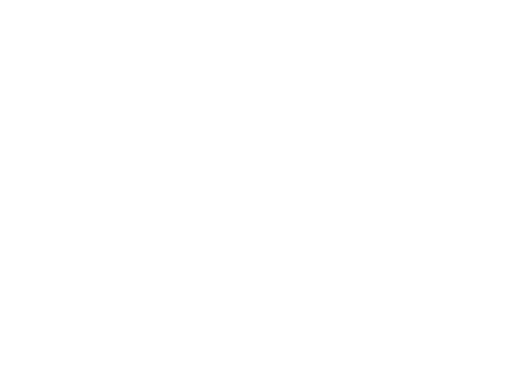

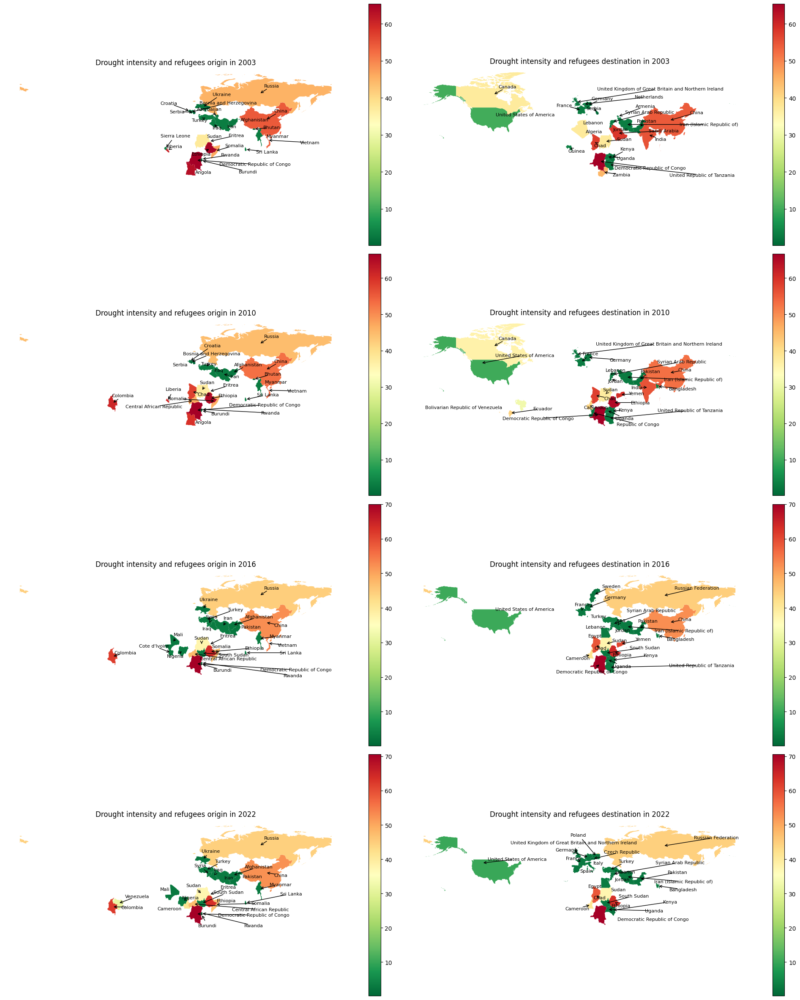

In [85]:
from shapely.errors import ShapelyDeprecationWarning
from adjustText import adjust_text

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
#sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
#size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

# Remove axes
plt.axis('off')

# Define the years of interest
years = [2003, 2010, 2016, 2022]

# Create a subplot with 4 rows and 2 columns
fig, axs = plt.subplots(len(years), 2, figsize=(20, 25))  # 4 rows, 2 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year_origin = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_year_destination = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for that year
    top_25_origins_year = geoworld_year_origin.nlargest(25, '#refugees_origin')
    top_25_destinations_year = geoworld_year_destination.nlargest(25, '#refugees_destination')

    # Convert to lat lon projection
    top_25_origins_year = top_25_origins_year.to_crs('EPSG:4326')
    top_25_destinations_year = top_25_destinations_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        top_25_origins_year['centroid'] = top_25_origins_year.geometry.centroid
        top_25_destinations_year['centroid'] = top_25_destinations_year.geometry.centroid

    # Plot origin data
    ax_origin = axs[i, 0]
    top_25_origins_year.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax_origin)
    #ax_origin.scatter(top_25_origins_year['centroid'].x, top_25_origins_year['centroid'].y, color='black', s=top_25_origins_year['#refugees_origin'] / 30000)
    ax_origin.axis('off')
    ax_origin.set_title(f'Drought intensity and refugees origin in {year}')
    
    # Add country names to origin plot with adjusted positions
    texts = []
    for idx, row in top_25_origins_year.iterrows():
        text = ax_origin.annotate(row['Country'], xy=(row['centroid'].x, row['centroid'].y), fontsize=8)
        texts.append(text)
    adjust_text(texts, ax=ax_origin, expand_text=(1.02, 1.02), arrowprops=dict(arrowstyle="->", color='black', shrinkA=10))

    # Plot destination data
    ax_destination = axs[i, 1]
    top_25_destinations_year.plot(column='EI_06', cmap='RdYlGn_r', legend=True, ax=ax_destination)
    #ax_destination.scatter(top_25_destinations_year['centroid'].x, top_25_destinations_year['centroid'].y, color='black', s=top_25_destinations_year['#refugees_destination'] / 30000)
    ax_destination.axis('off')
    ax_destination.set_title(f'Drought intensity and refugees destination in {year}')
    
    # Add country names to destination plot with adjusted positions
    texts = []
    for idx, row in top_25_destinations_year.iterrows():
        text = ax_destination.annotate(row['Country'], xy=(row['centroid'].x, row['centroid'].y), fontsize=8)
        texts.append(text)
    adjust_text(texts, ax=ax_destination, expand_text=(1.02, 1.02), arrowprops=dict(arrowstyle="->", color='black', shrinkA=10))

# Create a new axis for the legend
#fig.legend(handles=size_legends, loc='lower center', title='#refugees at location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.4)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend

# Show the plot
plt.show()

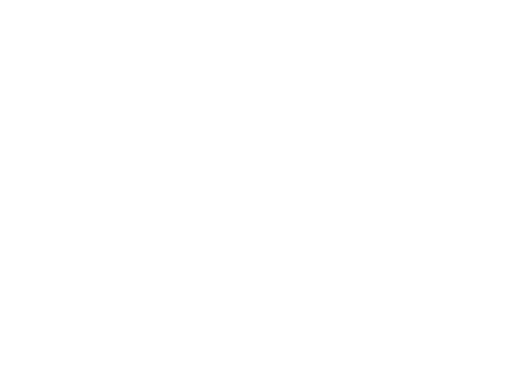

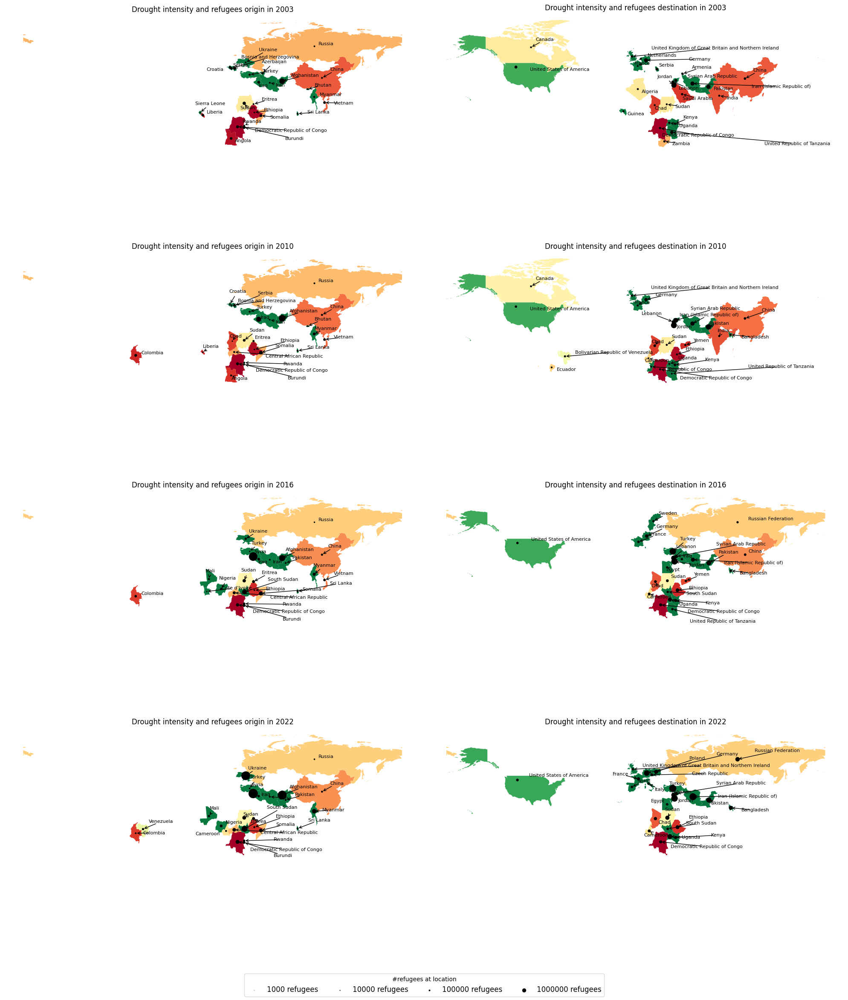

In [86]:
from shapely.errors import ShapelyDeprecationWarning
from adjustText import adjust_text

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Define sizes for the legend
sizes = [1000, 10000, 100000, 1000000]

# Create legend entries for each size
size_legends = [plt.scatter([], [], s=size / 30000, color='black', label=str(size) + ' refugees') for size in sizes]

# Remove axes
plt.axis('off')

# Define the years of interest
years = [2003, 2010, 2016, 2022]

# Create a subplot with 4 rows and 2 columns
fig, axs = plt.subplots(len(years), 2, figsize=(20, 25))  # 4 rows, 2 columns of subplots

for i, year in enumerate(years):
    # Filter the DataFrame to include only rows for the specific year
    geoworld_year_origin = geoworld_originref[geoworld_originref['Year'] == year]
    geoworld_year_destination = geoworld_destinationref[geoworld_destinationref['Year'] == year]

    # Select the top 25 countries with the highest refugee numbers for that year
    top_25_origins_year = geoworld_year_origin.nlargest(25, '#refugees_origin')
    top_25_destinations_year = geoworld_year_destination.nlargest(25, '#refugees_destination')

    # Convert to lat lon projection
    top_25_origins_year = top_25_origins_year.to_crs('EPSG:4326')
    top_25_destinations_year = top_25_destinations_year.to_crs('EPSG:4326')

    # Extract centroid coordinates
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", UserWarning)
        top_25_origins_year['centroid'] = top_25_origins_year.geometry.centroid
        top_25_destinations_year['centroid'] = top_25_destinations_year.geometry.centroid

    # Plot origin data
    ax_origin = axs[i, 0]
    top_25_origins_year.plot(column='EI_06', cmap='RdYlGn_r', legend=False, ax=ax_origin)
    ax_origin.scatter(top_25_origins_year['centroid'].x, top_25_origins_year['centroid'].y, color='black', s=top_25_origins_year['#refugees_origin'] / 30000)
    ax_origin.axis('off')
    ax_origin.set_title(f'Drought intensity and refugees origin in {year}')
    
    # Add country names to origin plot with adjusted positions
    texts = []
    for idx, row in top_25_origins_year.iterrows():
        text = ax_origin.annotate(row['Country'], xy=(row['centroid'].x, row['centroid'].y), fontsize=8)
        texts.append(text)
    adjust_text(texts, ax=ax_origin, expand_text=(1.02, 1.02), arrowprops=dict(arrowstyle="->", color='black', shrinkA=10))

    # Plot destination data
    ax_destination = axs[i, 1]
    top_25_destinations_year.plot(column='EI_06', cmap='RdYlGn_r', legend=False, ax=ax_destination)
    ax_destination.scatter(top_25_destinations_year['centroid'].x, top_25_destinations_year['centroid'].y, color='black', s=top_25_destinations_year['#refugees_destination'] / 30000)
    ax_destination.axis('off')
    ax_destination.set_title(f'Drought intensity and refugees destination in {year}')
    
    # Add country names to destination plot with adjusted positions
    texts = []
    for idx, row in top_25_destinations_year.iterrows():
        text = ax_destination.annotate(row['Country'], xy=(row['centroid'].x, row['centroid'].y), fontsize=8)
        texts.append(text)
    adjust_text(texts, ax=ax_destination, expand_text=(1.02, 1.02), arrowprops=dict(arrowstyle="->", color='black', shrinkA=10))

# Create a new axis for the legend
fig.legend(handles=size_legends, loc='lower center', title='#refugees at location', ncol=4, fontsize='large')

# Adjust layout to reduce space between subplots and between rows
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.4)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 1])  # Add space at the bottom for the legend

# Show the plot
plt.show()

What stands out in 2022 is that people who flee to Congo, Ethiopia, Cameroon, Sudan and Chad arrive in worse (intense) drought situation from the top 25 receiving refugee countries. It is interesting that at no other place, apart from Russia, drought intensity scores are bad. The other way around is even true: in other receiving countries dright scores are good. So if people flee to these countries from Mali, Nigeria or South-Sudan (which are the top origin countries), in which the drought intensity scores are low (good!), then they should get help with this change in circumstances for drought. For there living conditions as well as possible food production. They will namely end up in a far worse place, from a 'drought' point of view.

In 2016 we had a very similar situation. From that we can still learn that the above also hold from fleeing from Côte d'Ivoire: that country has a good dorught score and some neighboring countries have a very bad drought score. And people who flee to Yemen need also dorught help, as it is a high refugee receiving country in 2016 and the drought score is very bad.

Earlier years more or less confirm this picute, with some differences, but the emphasis in policy making should be on the countries described above. In this conclusion is also taken into account the very poor status of this continent in the world (Africa is the poorest continent in the world, which immidiately also makes it vulnerable, because people there, generally, cannot cope with climate change effects).

# Spatial weights drought indicator

We look at this to gain a deeper understanding of the varaibles indidually, to identify potential changes over year better, and to gain spatial structure.

Spatial weights for refugee data will be the same in every climatic indicator analysis.

Above, in the extensive explanation for one specific year, 2020, the spatial weight lag and autocorrelations are explained cerfully. Therefore, in the analysis below, we will mostly focus on results and not explain every step detailed again.

In [87]:
from pysal.lib import weights
from libpysal.io import open as psopen
from pysal.explore import esda
from splot.esda import moran_scatterplot, lisa_cluster, plot_local_autocorrelation
from shapely.errors import ShapelyDeprecationWarning
import matplotlib.pyplot as plt
import warnings
# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='geopandas')
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)
warnings.filterwarnings("ignore", message="The weights matrix is not fully connected")
warnings.filterwarnings("ignore", message=" is an island (no neighbors)")

In [88]:
# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a dictionary to store DataFrames for each year
geoworld_origins = {}

In [89]:
# Function to check if a country is an island (no neighbors in spatial weights)
def is_island(country, w):
    return len(w[country]) == 0

# Loop through each year and create a variable for each year
for year in years:
    #print(f"Processing Year: {year}")
    
    # Filter the DataFrame to include only rows for the specific year
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    
    # Set index
    geoworld_origin_year = geoworld_origin_year.set_index("Country")
    
    # Create the weights matrix
    try:
        w_queen = weights.Queen.from_dataframe(geoworld_origin_year, ids=geoworld_origin_year.index)
        
        # Identify and drop islands dynamically
        islands = [country for country in geoworld_origin_year.index if is_island(country, w_queen)]
        geoworld_origin_year = geoworld_origin_year.drop(islands, errors='ignore')
        
        # Recreate the weights matrix after dropping islands
        w_queen = weights.Queen.from_dataframe(geoworld_origin_year, ids=geoworld_origin_year.index)
        w_queen.transform = 'R'  # row-standardized weights
        
        # Compute spatial lag of `EI_06`
        w_queen_score = weights.lag_spatial(w_queen, geoworld_origin_year['EI_06'])
        geoworld_origin_year['w_queen_score'] = w_queen_score

        # Standardize the EI_06 values
        geoworld_origin_year['EI_06_std'] = (geoworld_origin_year['EI_06'] - geoworld_origin_year['EI_06'].mean()) / geoworld_origin_year['EI_06'].std()
        geoworld_origin_year['w_EI_06_std'] = weights.lag_spatial(w_queen, geoworld_origin_year['EI_06_std'])
        
        # Store the DataFrame in the dictionary
        geoworld_origins[year] = geoworld_origin_year
    except Exception as e:
        print(f"Error processing year {year}: {e}")

# Create variables for each year dynamically
for year, df in geoworld_origins.items():
    globals()[f'geoworld_origin_{year}'] = df

In [90]:
# Initialize dictionaries to store results
lisa_scores = {}
moran_values = {}

# Define a function to run the analysis
def run_analysis(geoworld_origin_year, year, ax_moran, ax_lisa):
    # Create weights within the function to ensure correct alignment
    w_queen = weights.Queen.from_dataframe(geoworld_origin_year, ids=geoworld_origin_year.index)
    w_queen.transform = 'R'  # row-standardized weights

    # Perform Moran's I test
    mi = esda.Moran(geoworld_origin_year['EI_06'], w_queen)
    print(f"Results for Year: {year}")
    print(f"Moran's I: {mi.I}")
    print(f"P-value: {mi.p_sim}")
    
    # Store Moran's I value
    moran_values[year] = mi.I
    
    # Plot Moran's I scatter plot directly on the provided axis
    moran_scatterplot(mi, ax=ax_moran)
    ax_moran.set_title(f"Moran's I Scatter Plot for {year}")
    
    # Compute Local Moran's I
    lisa = esda.Moran_Local(geoworld_origin_year['EI_06'], w_queen)
    
    # Store LISA scores for 2003 and 2022
    if year in [2003, 2022]:
        lisa_scores[year] = lisa.Is
        print(lisa_scores[year])
    
    # Break observations into significant or not
    geoworld_origin_year['significant'] = lisa.p_sim < 0.05
    # Store the quadrant they belong to
    geoworld_origin_year['quadrant'] = lisa.q
    
    # Plot LISA cluster directly on the provided axis
    lisa_cluster(lisa, geoworld_origin_year, ax=ax_lisa)
    ax_lisa.set_title(f"LISA Cluster Map for {year}")

Results for Year: 2003
Moran's I: 0.3576957315362525
P-value: 0.001
[ 0.15073304  0.47723097 -0.03289964  0.42450299  2.03962454  1.64749528
  0.35515423 -0.74985919  0.46929982  0.13080539 -1.37009358 -0.34525052
  0.17580733  0.35548379 -0.39354712  0.35625027 -1.25976537  2.2268145
  0.5035443  -0.14762558  2.84306407  0.45608827  0.35272989 -0.22467026
 -0.09584542  0.88410979 -0.24149888  1.60898798  1.18203118  1.98219441
  0.00828027  3.15214438 -1.00216144 -0.8997224   0.03099697  0.50370584
  0.46719905  0.46568151  0.42266735  0.42376223  0.32597681  3.17070877
  2.38883341 -0.31625424 -0.36939486  1.58994947  1.09810204 -0.21629773
  1.31511215 -0.01988796  0.36236763  0.67289134  0.44705813  0.07188313
  0.38279124  0.34305135  0.40433729 -0.322471    0.09308824  0.42175514
  1.03314444  0.32597681  0.28597225  0.48574072  0.22677185  1.76356016
  0.35636969  0.10999384  0.39636752  0.44220048  0.38249268 -0.00921733
 -0.12652303 -0.3832617  -0.47906965  0.03345047 -0.20430

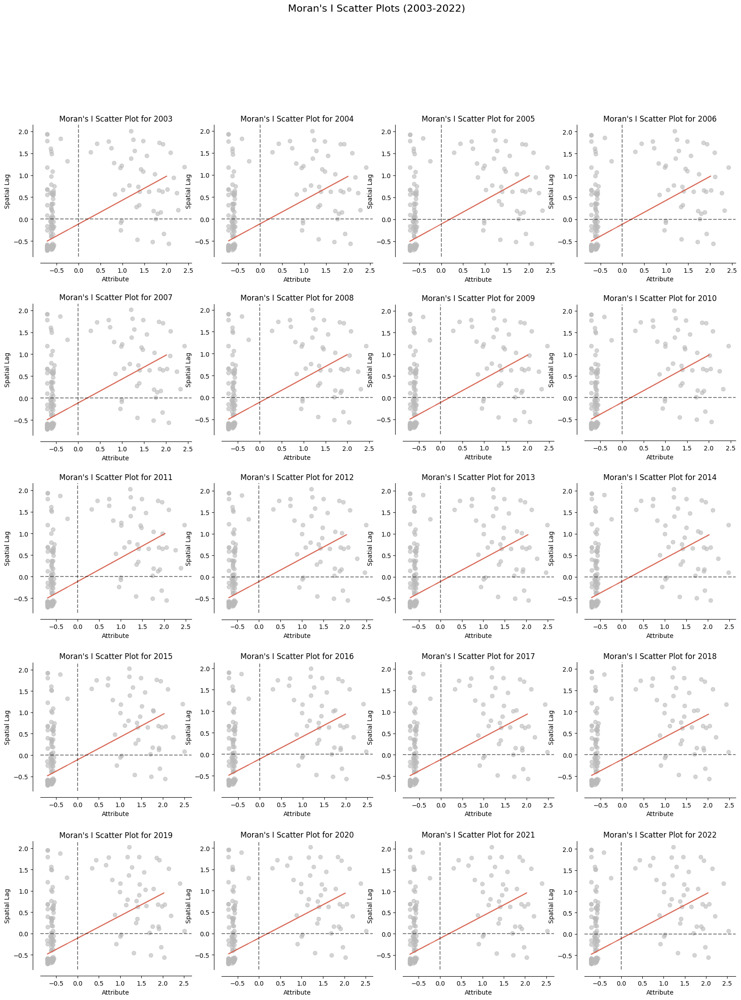

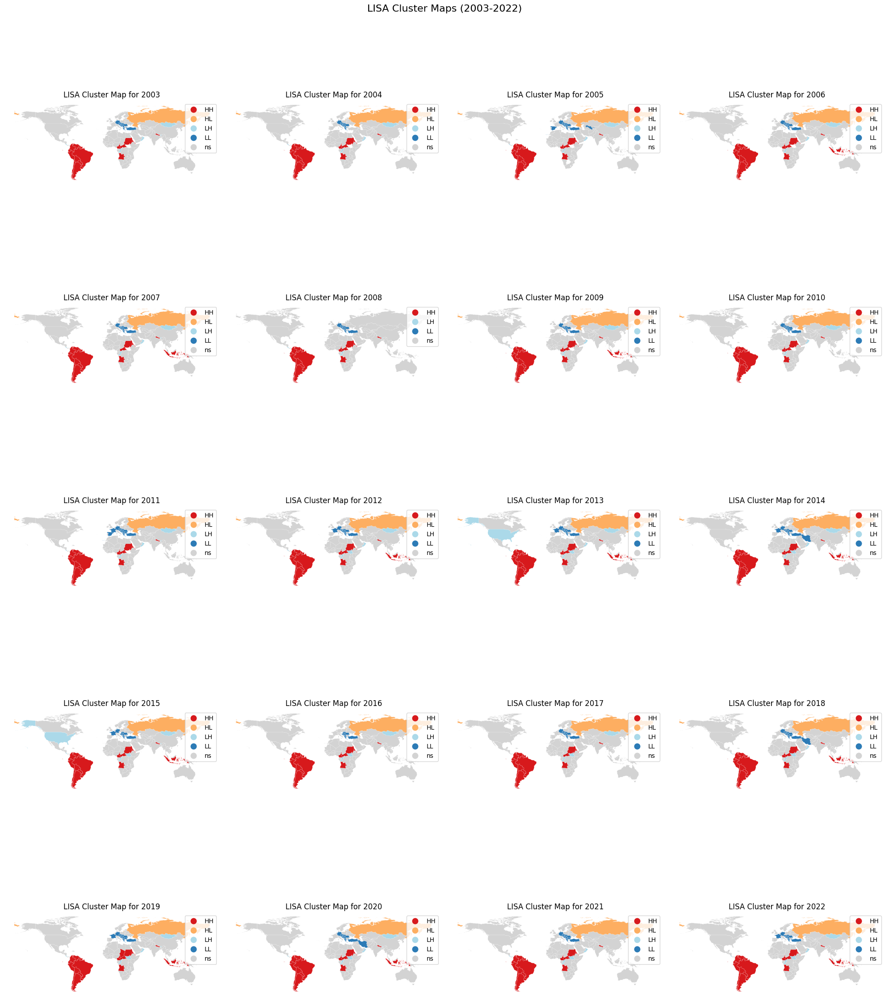

In [91]:
# Number of rows and columns for subplots
nrows, ncols = 5, 4

# Create subplots for Moran's I scatter plots
fig_moran, axes_moran = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_moran.suptitle("Moran's I Scatter Plots (2003-2022)", fontsize=16)

# Create subplots for LISA cluster maps
fig_lisa, axes_lisa = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_lisa.suptitle("LISA Cluster Maps (2003-2022)", fontsize=16)

# Execute analysis for each year and plot on the respective subplots
for i, year in enumerate(years):
    row, col = divmod(i, ncols)
    if year in geoworld_origins:
        geoworld_origin_year = globals()[f'geoworld_origin_{year}']
        run_analysis(geoworld_origin_year, year, axes_moran[row, col], axes_lisa[row, col])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

Below with destination dataset. Numbers changes a bit due to different data values in both origin and destination datasets. If only 2003 and 2022 values are examined, differences are very little. So, then it does not matter whether the origin or destination data frame is used. Now, with all the LISA alues for all the years, the origin set is more complete.

In [92]:
# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a dictionary to store DataFrames for each year
geoworld_destinations = {}

In [93]:
# Function to check if a country is an island (no neighbors in spatial weights)
def is_island(country, w):
    return len(w[country]) == 0

# Loop through each year and create a variable for each year
for year in years:
    #print(f"Processing Year: {year}")
    
    # Filter the DataFrame to include only rows for the specific year
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]
    
    # Set index
    geoworld_destination_year = geoworld_destination_year.set_index("Country")
    
    # Create the weights matrix
    try:
        w_queen = weights.Queen.from_dataframe(geoworld_destination_year, ids=geoworld_destination_year.index)
        
        # Identify and drop islands dynamically
        islands = [country for country in geoworld_destination_year.index if is_island(country, w_queen)]
        geoworld_destination_year = geoworld_destination_year.drop(islands, errors='ignore')
        
        # Recreate the weights matrix after dropping islands
        w_queen = weights.Queen.from_dataframe(geoworld_destination_year, ids=geoworld_destination_year.index)
        w_queen.transform = 'R'  # row-standardized weights
        
        # Compute spatial lag of `EI_06`
        w_queen_score = weights.lag_spatial(w_queen, geoworld_destination_year['EI_06'])
        geoworld_destination_year['w_queen_score'] = w_queen_score

        # Standardize the EI_06 values
        geoworld_destination_year['EI_06_std'] = (geoworld_destination_year['EI_06'] - geoworld_destination_year['EI_06'].mean()) / geoworld_destination_year['EI_06'].std()
        geoworld_destination_year['w_EI_06_std'] = weights.lag_spatial(w_queen, geoworld_destination_year['EI_06_std'])
        
        # Store the DataFrame in the dictionary
        geoworld_destinations[year] = geoworld_destination_year
    except Exception as e:
        print(f"Error processing year {year}: {e}")

# Create variables for each year dynamically
for year, df in geoworld_destinations.items():
    globals()[f'geoworld_destination_{year}'] = df

In [94]:
# Initialize dictionaries to store results
lisa_scores = {}
moran_values = {}

# Define a function to run the analysis
def run_analysis(geoworld_destination_year, year, ax_moran, ax_lisa):
    # Create weights within the function to ensure correct alignment
    w_queen = weights.Queen.from_dataframe(geoworld_destination_year, ids=geoworld_destination_year.index)
    w_queen.transform = 'R'  # row-standardized weights

    # Perform Moran's I test
    mi = esda.Moran(geoworld_destination_year['EI_06'], w_queen)
    print(f"Results for Year: {year}")
    print(f"Moran's I: {mi.I}")
    print(f"P-value: {mi.p_sim}")
    
    # Store Moran's I value
    moran_values[year] = mi.I
    
    # Plot Moran's I scatter plot directly on the provided axis
    moran_scatterplot(mi, ax=ax_moran)
    ax_moran.set_title(f"Moran's I Scatter Plot for {year}")
    
    # Compute Local Moran's I
    lisa = esda.Moran_Local(geoworld_destination_year['EI_06'], w_queen)
    
    # Store LISA scores for 2003 and 2022
    if year in [2003, 2022]:
        lisa_scores[year] = lisa.Is
        print(lisa_scores[year])
    
    # Break observations into significant or not
    geoworld_destination_year['significant'] = lisa.p_sim < 0.05
    # Store the quadrant they belong to
    geoworld_destination_year['quadrant'] = lisa.q
    
    # Plot LISA cluster directly on the provided axis
    lisa_cluster(lisa, geoworld_destination_year, ax=ax_lisa)
    ax_lisa.set_title(f"LISA Cluster Map for {year}")

Results for Year: 2003
Moran's I: 0.3822673474497646
P-value: 0.001
[ 0.15302335  0.47639903 -0.03792867  1.98133674  1.60002215  0.35553477
 -0.74388756  0.47292815  0.13340174 -1.00765704  0.17823919  0.37263665
 -0.38494049  0.35662062  2.16561866  0.50242743 -0.14239468  3.03906326
  0.45548604  0.35313235 -0.21790205 -0.31426441  0.6972147  -0.24108291
  1.56238549  1.14388893  1.92669007  0.5990274   3.06931808 -0.98861883
 -0.88751542  0.03419004  0.50258722  0.46647593  0.44175631  0.42242622
  0.40469541  2.32323532 -0.30991222 -0.36268084  1.06409906 -0.21049167
  0.34637112  1.27259658 -0.01588773  0.36268314  0.25399313  0.44655415
  0.0750037   0.38736671  0.34354245  0.40426228 -0.3161667   0.09571919
  0.42152478  0.26822945  0.48481682  0.88683159  1.02529237  0.35674137
  0.11256625  0.39636001  0.44174785  0.38262706 -0.00530013 -0.12157997
 -0.37559771 -0.46954143  0.03698729  0.1126685   0.45723708 -1.13102877
  0.4273637   0.46610922  0.11340841  0.42104513 -0.0220

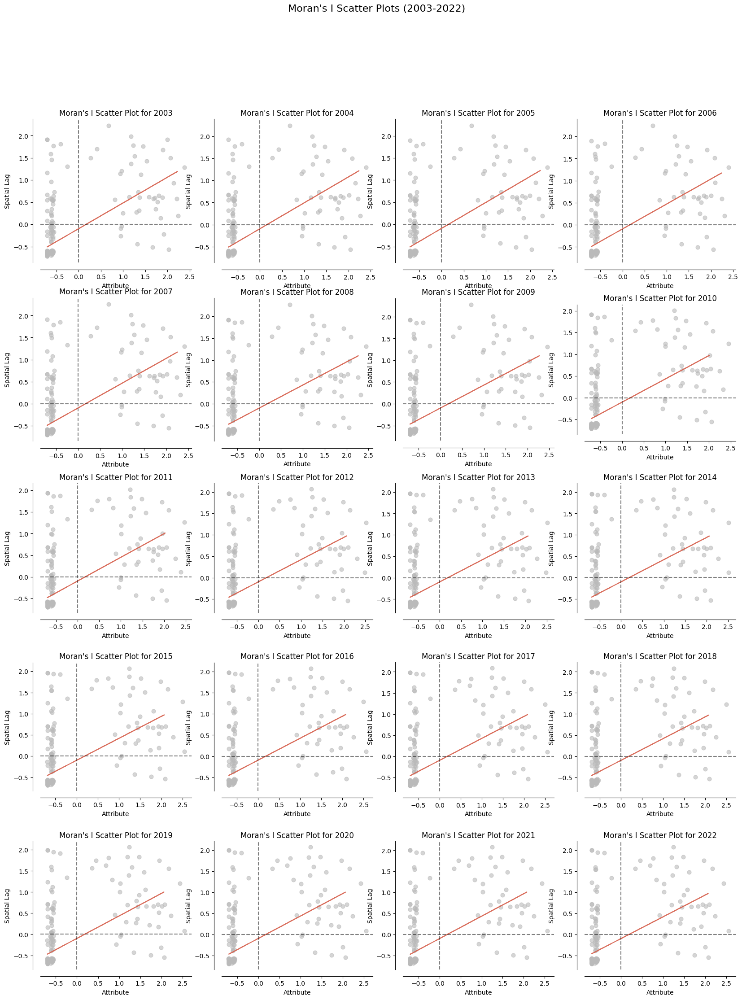

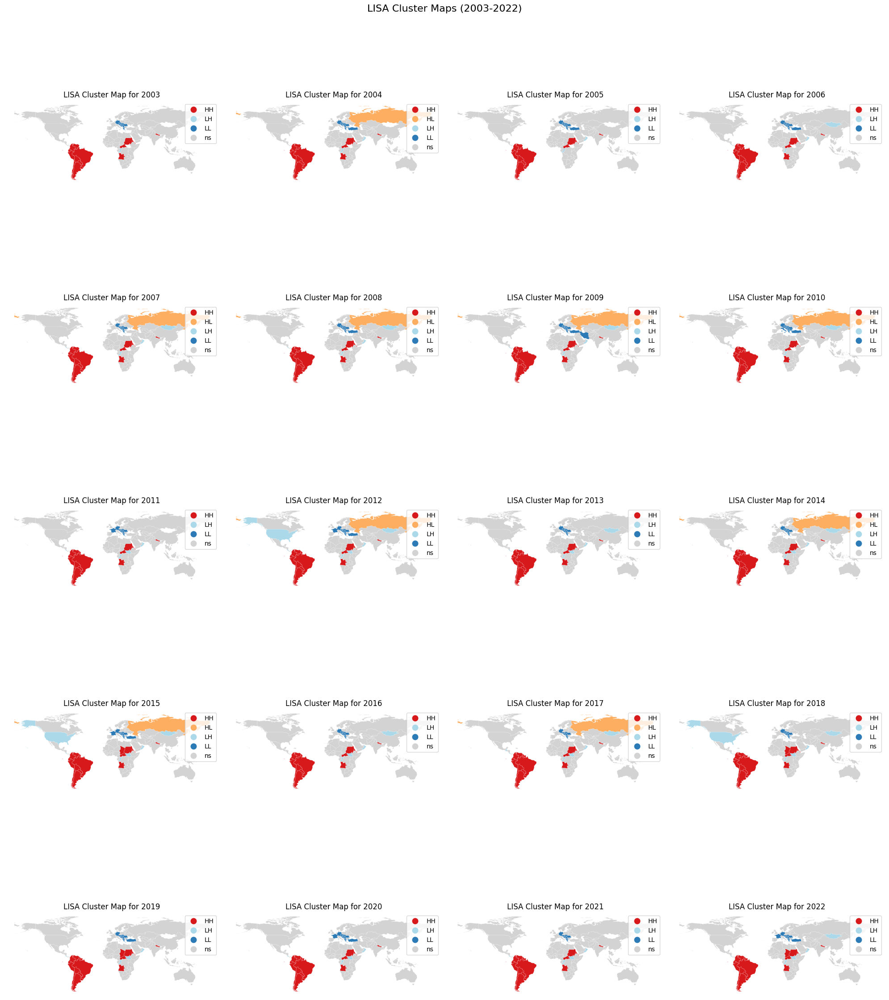

In [95]:
# Number of rows and columns for subplots
nrows, ncols = 5, 4

# Create subplots for Moran's I scatter plots
fig_moran, axes_moran = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_moran.suptitle("Moran's I Scatter Plots (2003-2022)", fontsize=16)

# Create subplots for LISA cluster maps
fig_lisa, axes_lisa = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_lisa.suptitle("LISA Cluster Maps (2003-2022)", fontsize=16)

# Execute analysis for each year and plot on the respective subplots
for i, year in enumerate(years):
    row, col = divmod(i, ncols)
    if year in geoworld_destinations:
        geoworld_destination_year = globals()[f'geoworld_destination_{year}']
        run_analysis(geoworld_destination_year, year, axes_moran[row, col], axes_lisa[row, col])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

One sees that the global Moran I nearly remains constant over time (statistically significant) and one can also digest that from the plots. This means, that, overall, the spatial clustering does not change over the years.

Further, regarding the local spatial autocorrelation (LISA), we see similar things. The same continents/countries are clustered together over time. The clustering nearly does not change in 20 years. One can see that in Central and mainly East Europe + Turkey drought scores are low in European countries, so low drougth scores are surrounded by low drought scores there. In those 20 years, the continent South Americs is always a cluster of high drought scores, surrounded by high drought scores. We see the same pattern in Central Africa on a smaller scale.
Further, we see over the years 2000-2022 that Russia often can be classified as a country with high drought scores, surrounded by countries with low drought scores. The opposite holds for the US: that often is calssified as a country with low drought scores, surrounded by countries with high drought scores.
What is interesting is that Nepal always is classified as HH, meaning that drought scores are high, surrounded by other high drought scores. This means that India, China and Bangladesh, for example, have high drought scores. 
Other continents mostly have non-siginificant data.

In [96]:
lisa_scores[2003]

array([ 0.15302335,  0.47639903, -0.03792867,  1.98133674,  1.60002215,
        0.35553477, -0.74388756,  0.47292815,  0.13340174, -1.00765704,
        0.17823919,  0.37263665, -0.38494049,  0.35662062,  2.16561866,
        0.50242743, -0.14239468,  3.03906326,  0.45548604,  0.35313235,
       -0.21790205, -0.31426441,  0.6972147 , -0.24108291,  1.56238549,
        1.14388893,  1.92669007,  0.5990274 ,  3.06931808, -0.98861883,
       -0.88751542,  0.03419004,  0.50258722,  0.46647593,  0.44175631,
        0.42242622,  0.40469541,  2.32323532, -0.30991222, -0.36268084,
        1.06409906, -0.21049167,  0.34637112,  1.27259658, -0.01588773,
        0.36268314,  0.25399313,  0.44655415,  0.0750037 ,  0.38736671,
        0.34354245,  0.40426228, -0.3161667 ,  0.09571919,  0.42152478,
        0.26822945,  0.48481682,  0.88683159,  1.02529237,  0.35674137,
        0.11256625,  0.39636001,  0.44174785,  0.38262706, -0.00530013,
       -0.12157997, -0.37559771, -0.46954143,  0.03698729,  0.11

In [97]:
lisa_scores[2003].min()

-1.3534894196772147

In [98]:
lisa_scores[2003].max()

3.8012170066588142

In [99]:
max(lisa_scores[2003])

3.8012170066588142

In [100]:
import numpy as np
import pandas as pd

# Align the indices of LISA scores for 2003 and 2022
lisa_2003_df = pd.Series(lisa_scores[2003], index=geoworld_destinations[2003].index, name='LISA_2003')
lisa_2022_df = pd.Series(lisa_scores[2022], index=geoworld_destinations[2022].index, name='LISA_2022')

# Merge the dataframes to align indices
merged_lisa_df = pd.merge(lisa_2003_df, lisa_2022_df, left_index=True, right_index=True, how='inner')

# Extract aligned LISA scores
lisa_2003_aligned = merged_lisa_df['LISA_2003']
lisa_2022_aligned = merged_lisa_df['LISA_2022']

# Ensure data consistency
print("Checking data consistency:")
print(f"Number of entries in 2003: {len(lisa_2003_aligned)}")
print(f"Number of entries in 2022: {len(lisa_2022_aligned)}")
print(f"First few entries of 2003: {lisa_2003_aligned.head()}")
print(f"First few entries of 2022: {lisa_2022_aligned.head()}")

# Calculate correlation between LISA scores of 2003 and 2022
correlation_lisa = lisa_2003_aligned.corr(lisa_2022_aligned, method='kendall')
print(f"Kendall correlation between LISA scores of 2003 and 2022: {correlation_lisa}")

# Extract Moran's I values
years_list = list(moran_values.keys())
moran_I_values = list(moran_values.values())

# Convert to pandas Series to ensure consistency
years_series = pd.Series(years_list)
moran_I_series = pd.Series(moran_I_values)

# Calculate correlation between years and Moran's I values
correlation_year_moran = years_series.corr(moran_I_series, method='kendall')
print(f"Kendall correlation between years and Moran's I values: {correlation_year_moran}")

Checking data consistency:
Number of entries in 2003: 133
Number of entries in 2022: 133
First few entries of 2003: Country
Afghanistan    0.153023
Albania        0.476399
Algeria       -0.037929
Angola         1.981337
Argentina      1.600022
Name: LISA_2003, dtype: float64
First few entries of 2022: Country
Afghanistan    0.141645
Albania        0.463004
Algeria       -0.001825
Angola         1.676663
Argentina      1.716878
Name: LISA_2022, dtype: float64
Kendall correlation between LISA scores of 2003 and 2022: 0.9307280391933463
Kendall correlation between years and Moran's I values: -0.15789473684210525


In [101]:
# Align the indices of LISA scores for 2003 and 2022
lisa_2003_df = pd.Series(lisa_scores[2003], index=geoworld_destinations[2003].index, name='LISA_2003')
lisa_2022_df = pd.Series(lisa_scores[2022], index=geoworld_destinations[2022].index, name='LISA_2022')

# Merge the dataframes to align indices
merged_lisa_df = pd.merge(lisa_2003_df, lisa_2022_df, left_index=True, right_index=True, how='inner')

# Extract aligned LISA scores
lisa_2003_aligned = merged_lisa_df['LISA_2003']
lisa_2022_aligned = merged_lisa_df['LISA_2022']

# Calculate correlation between LISA scores of 2003 and 2022
correlation_lisa = np.corrcoef(lisa_2003_aligned, lisa_2022_aligned)[0, 1] #lisa_2003_aligned.corr(lisa_2022_aligned, method='kendall') #np.corrcoef(lisa_2003_aligned, lisa_2022_aligned)[0, 1]
print(f"Pearson correlation between LISA scores of 2003 and 2022: {correlation_lisa}")

# Extract Moran's I values
years_list = list(moran_values.keys())
moran_I_values = list(moran_values.values())

# Calculate correlation between years and Moran's I values
correlation_year_moran = np.corrcoef(years_list, moran_I_values)[0, 1]
print(f"Pearson correlation between years and Moran's I values: {correlation_year_moran}")

Pearson correlation between LISA scores of 2003 and 2022: 0.9584372859821375
Pearson correlation between years and Moran's I values: -0.45458604075062503


In [102]:
lisa_2003_df.corr(lisa_2022_df)

0.9584372859821375

In [103]:
lisa_2003_aligned.corr(lisa_2022_aligned)

0.9584372859821375

In [104]:
lisa_2003_aligned.corr(lisa_2022_aligned)

0.9584372859821375

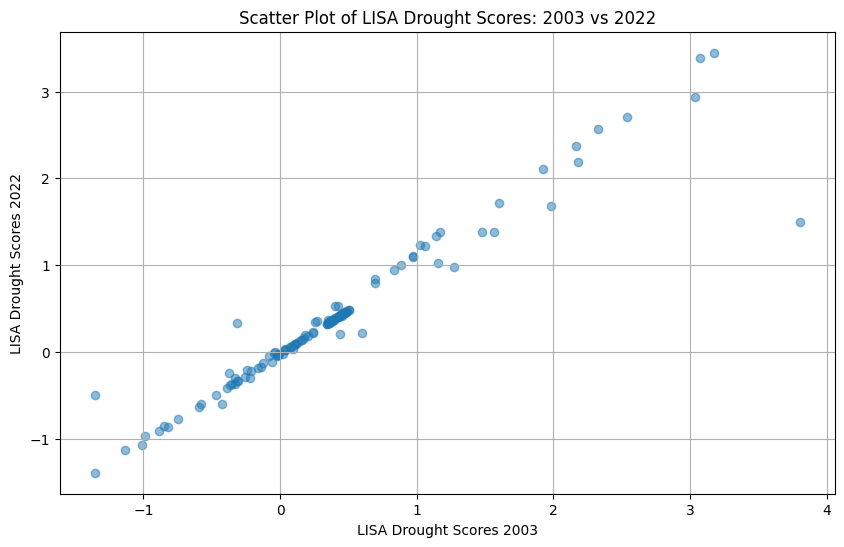

In [105]:
# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(lisa_2003_aligned, lisa_2022_aligned, alpha=0.5)
plt.xlabel('LISA Drought Scores 2003')
plt.ylabel('LISA Drought Scores 2022')
plt.title('Scatter Plot of LISA Drought Scores: 2003 vs 2022')
plt.grid(True)
plt.show()

Now we see this plot, it is better to use Kendall Tau correlation coefficient, as not all assumption of Peason correlation are met (there are for example outliers). Kendall is in this case also better than Spearman as we have quite some equal ranks (approximately).

This is very interesting to see, because the first correlation result above (LISA) confirms our line of thought: that drought numbers did not really change over years.

Namely, combining this information with the maps above, in which you do not see many changes, one can conclude that the local spatial clustering reamains spproximately the same over years. A correlation of 0.96 is extremely high, approaching 1. With 1, the drought numbers would be exactly the same in this context. 
(A correlation of 1 means perfect linear correlation. Could also be that numbers of column 2 are twice the numbers of column 1, for example. BUT if you combine this correlation with the visualisation we have in which you do not see changes, one can conclude that the correlation of nearly 1 is due to NO differences.)

The second finding is very interesting, because it suggests that when years progress, the drought numbers seems to be less clustered, overall.

Below, we test statitical differences, apart from a simple correlation coefficient.

First, we check normality.

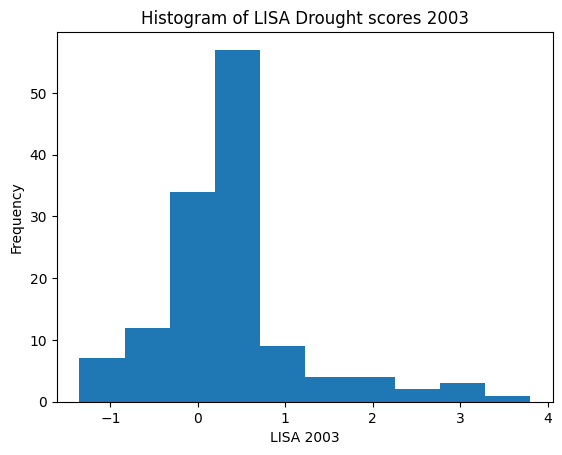

In [106]:
plt.hist(lisa_2003_aligned)
plt.xlabel('LISA 2003') 
plt.ylabel('Frequency')  
plt.title('Histogram of LISA Drought scores 2003')  
plt.show()

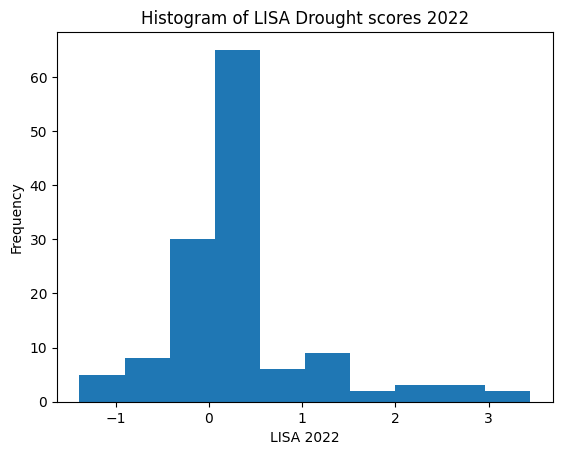

In [107]:
plt.hist(lisa_2022_aligned)
plt.xlabel('LISA 2022') 
plt.ylabel('Frequency')  
plt.title('Histogram of LISA Drought scores 2022')  
plt.show()

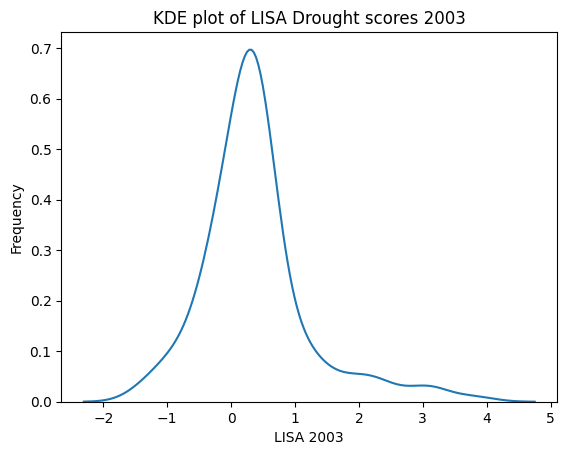

In [108]:
sns.kdeplot(lisa_2003_aligned)
plt.xlabel('LISA 2003') 
plt.ylabel('Frequency')  
plt.title('KDE plot of LISA Drought scores 2003')  
plt.show()

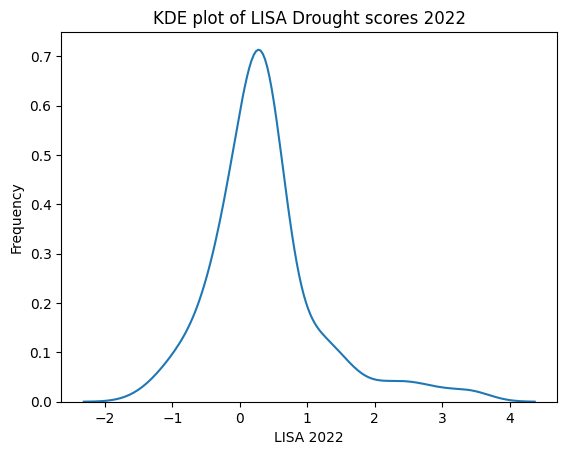

In [109]:
sns.kdeplot(lisa_2022_aligned)
plt.xlabel('LISA 2022') 
plt.ylabel('Frequency')  
plt.title('KDE plot of LISA Drought scores 2022')  
plt.show()

In [110]:
# Normality test

We use the Kolmogorov-Smirnov test, because sample size is bigger than 50. Otherwise, we should have used the Shapiro-Wilk test (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6350423/#:~:text=The%20two%20well%2Dknown%20tests,the%20normality%20of%20the%20data.). However, both tests will be conducted to see potential different conclusions.

In [111]:
import scipy.stats as stats

# Standardize the data
data_standardized = (lisa_2003_aligned - np.mean(lisa_2003_aligned)) / np.std(lisa_2003_aligned)

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.246893809914135, p-value = 1.2587951996382422e-07
Reject the null hypothesis: The data is not normally distributed.


In [112]:
# Alternative test for non-nomrality, check
shapiro_stat, shapiro_p_value = stats.shapiro(lisa_2003_aligned)
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.8679380443602924, p-value = 1.576178709159278e-09
Reject the null hypothesis: The data is not normally distributed.


In [113]:
# Standardize the data
data_standardized = (lisa_2022_aligned - np.mean(lisa_2022_aligned)) / np.std(lisa_2022_aligned)

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.2445168729337327, p-value = 1.7345311915161148e-07
Reject the null hypothesis: The data is not normally distributed.


In [114]:
# Alternative test for non-nomrality, check
shapiro_stat, shapiro_p_value = stats.shapiro(lisa_2022_aligned)
print(f"Shapiro-Wilk test: W statistic = {shapiro_stat}, p-value = {shapiro_p_value}")

if shapiro_p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

Shapiro-Wilk test: W statistic = 0.8750662005027193, p-value = 3.346275544048328e-09
Reject the null hypothesis: The data is not normally distributed.


--> not normal distributed, so we use in this case a paired alternative t-test: The paired samples Wilcoxon test (also known as Wilcoxon signed-rank test) is a non-parametric alternative to paired t-test used to compare paired data. It's used when your data are not normally distributed.

In [115]:
import scipy.stats as stats

# Perform the Wilcoxon Signed-Rank Test
w_stat, p_value = stats.wilcoxon(lisa_2003_aligned, lisa_2022_aligned)
print(f"Wilcoxon Signed-Rank test: W statistic = {w_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference between 2003 and 2022.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference between 2003 and 2022.")

Wilcoxon Signed-Rank test: W statistic = 3339.0, p-value = 0.012160905665601969
Reject the null hypothesis: There is a significant difference between 2003 and 2022.


So these findings are significant at the 5% level, but NOT at the 1% level. Below, we map out the differences in local spatial clustering.

Mean difference: -0.0065520773804320885
Median difference: -0.018857527778621985
Standard deviation of differences: 0.2396501153186132
Number of positive changes: 34
Number of negative changes: 99
Number of no changes: 0


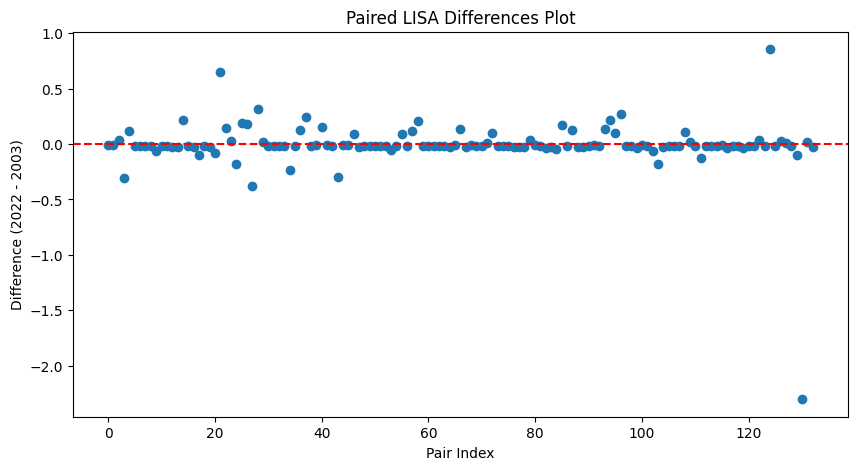

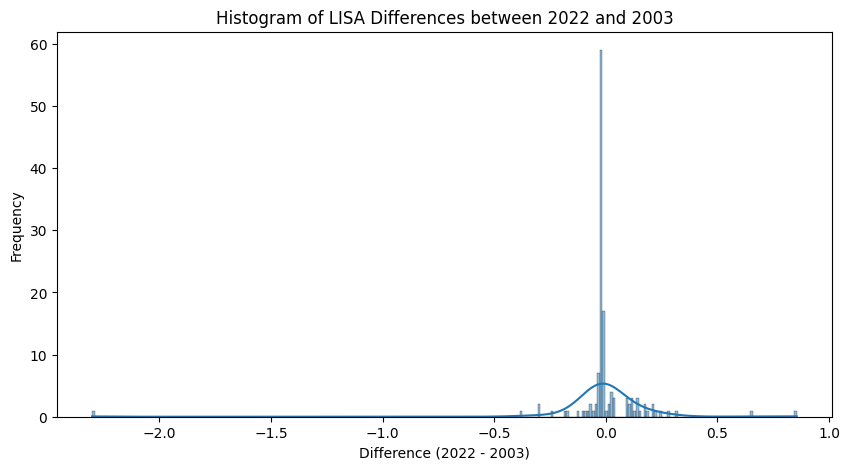

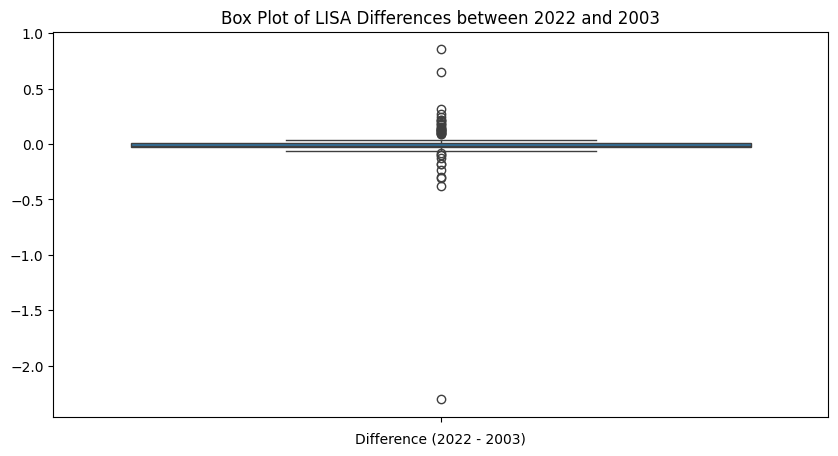

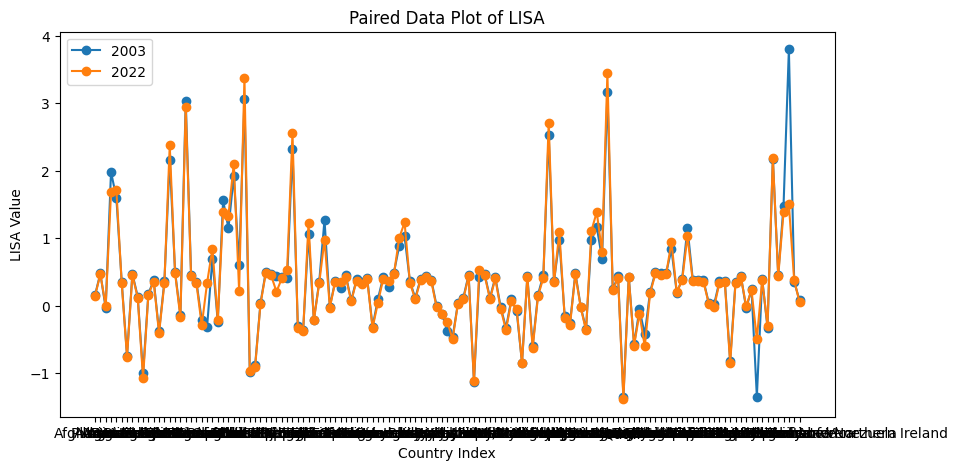

In [116]:
# Calculate the differences
differences = np.array(lisa_2022_aligned) - np.array(lisa_2003_aligned)

# Summarize the differences
mean_diff = np.mean(differences)
median_diff = np.median(differences)
std_diff = np.std(differences)

#print(f"Differences between 2022 and 2003: {differences}")
print(f"Mean difference: {mean_diff}")
print(f"Median difference: {median_diff}")
print(f"Standard deviation of differences: {std_diff}")

# Further analysis
positive_changes = np.sum(differences > 0)
negative_changes = np.sum(differences < 0)
no_changes = np.sum(differences == 0)

print(f"Number of positive changes: {positive_changes}")
print(f"Number of negative changes: {negative_changes}")
print(f"Number of no changes: {no_changes}")

# Visualization

# Paired Differences Plot
plt.figure(figsize=(10, 5))
plt.scatter(range(len(differences)), differences, marker='o')
plt.axhline(0, color='red', linestyle='--')
plt.title('Paired LISA Differences Plot')
plt.xlabel('Pair Index')
plt.ylabel('Difference (2022 - 2003)')
plt.show()

# Histogram of Differences
plt.figure(figsize=(10, 5))
sns.histplot(differences, kde=True)
plt.title('Histogram of LISA Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.ylabel('Frequency')
plt.show()

# Box Plot of Differences
plt.figure(figsize=(10, 5))
sns.boxplot(data=differences)
plt.title('Box Plot of LISA Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.show()

# Line Plot of Paired Data
plt.figure(figsize=(10, 5))
plt.plot(lisa_2003_aligned, label='2003', marker='o')
plt.plot(lisa_2022_aligned, label='2022', marker='o')
plt.legend()
plt.title('Paired Data Plot of LISA')
plt.xlabel('Country Index')
plt.ylabel('LISA Value')
plt.show()

Although the test being significant, in general, the changes are minor and do not have preacticaly relevance. Also, more changes are negative than positive, so dorught clustering seems to be decreasing over time in general. Although the biggest clustering changes are positive, the most cluster changes are slightly negative. 

Small clustering changes do not hold for three countries:

In [117]:
# Calculate absolute differences
differences = lisa_2022_aligned - lisa_2003_aligned
print(differences[differences > 0.5])

Country
Cambodia                0.649659
United Arab Emirates    0.854792
dtype: float64


In [118]:
print(differences[differences < -0.5])

Country
Yemen   -2.301746
dtype: float64


This means that for those three countries, the local spatial clustering changed heavily (more same values clustering for Cambodia and United Arab Emirates) and less same value clustering (more dissimilar) with other countries for this drought indicator for Yemen. 

# Below follows a normal (= no clustering scores) drougth numbers comparison: correlation and Wilcoxon sum ranked test.

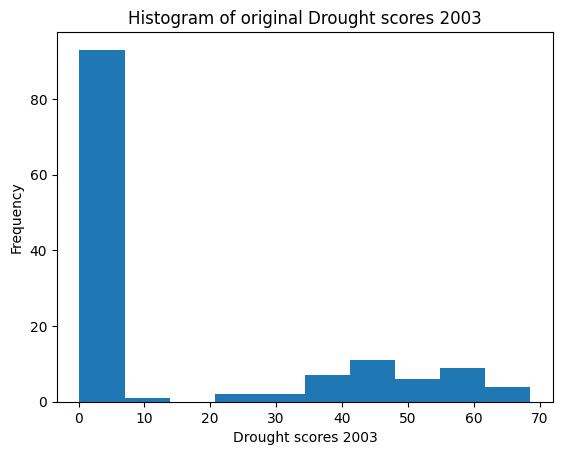

In [119]:
plt.hist(geoworld_destinations[2003]['EI_06'])
plt.xlabel('Drought scores 2003') 
plt.ylabel('Frequency')  
plt.title('Histogram of original Drought scores 2003')  
plt.show()

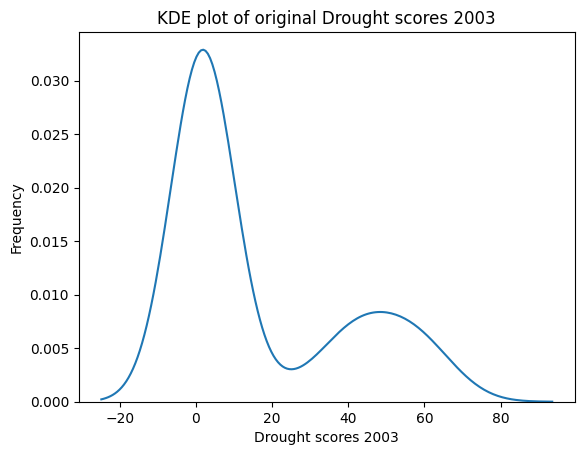

In [120]:
sns.kdeplot(geoworld_destinations[2003]['EI_06'])
plt.xlabel('Drought scores 2003') 
plt.ylabel('Frequency')  
plt.title('KDE plot of original Drought scores 2003')  
plt.show()

In [121]:
import scipy.stats as stats

# Standardize the data
data_standardized = (geoworld_destinations[2003]['EI_06'] - np.mean(geoworld_destinations[2003]['EI_06'])) / np.std(geoworld_destinations[2003]['EI_06'])

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.3918881323360548, p-value = 3.4297893265891037e-19
Reject the null hypothesis: The data is not normally distributed.


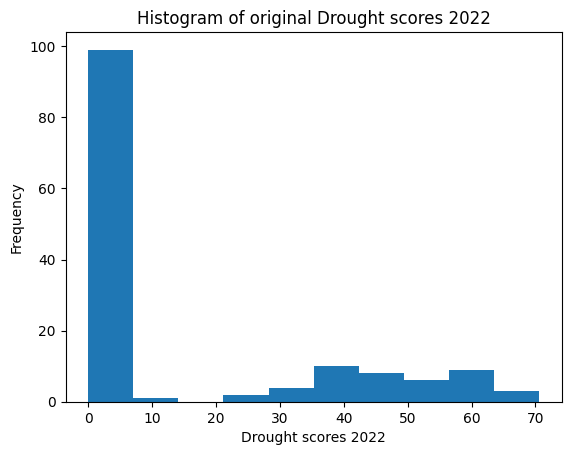

In [122]:
plt.hist(geoworld_destinations[2022]['EI_06'])
plt.xlabel('Drought scores 2022') 
plt.ylabel('Frequency')  
plt.title('Histogram of original Drought scores 2022')  
plt.show()

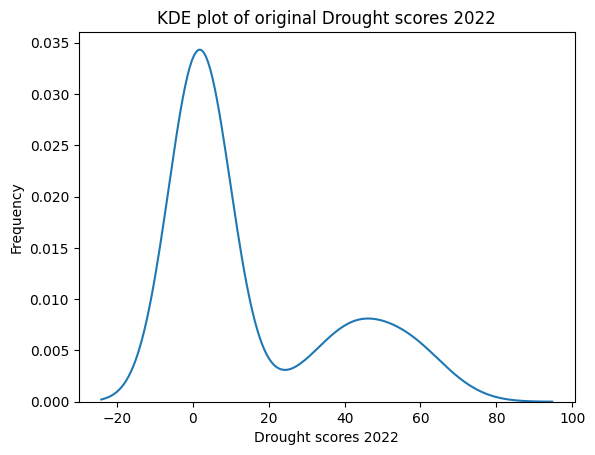

In [123]:
sns.kdeplot(geoworld_destinations[2022]['EI_06'])
plt.xlabel('Drought scores 2022') 
plt.ylabel('Frequency')  
plt.title('KDE plot of original Drought scores 2022')  
plt.show()

In [124]:
import scipy.stats as stats

# Standardize the data
data_standardized = (geoworld_destinations[2022]['EI_06'] - np.mean(geoworld_destinations[2022]['EI_06'])) / np.std(geoworld_destinations[2022]['EI_06'])

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.3965413550824667, p-value = 1.1959097753457165e-20
Reject the null hypothesis: The data is not normally distributed.


Clearly, this data is not normally distributed. We saw this earlier also in the analysis above in this Notebook.

We proceed with finding correlation and testing.

In [125]:
from scipy.stats import pearsonr, wilcoxon, kendalltau

# Check data length consistency and extract drought indicator values
if 2003 in geoworld_destinations and 2022 in geoworld_destinations:
    df_2003 = geoworld_destinations[2003]
    df_2022 = geoworld_destinations[2022]
    
    # Ensure equal length of data
    common_countries = df_2003.index.intersection(df_2022.index)
    drought_2003 = df_2003.loc[common_countries, 'EI_06'].values
    drought_2022 = df_2022.loc[common_countries, 'EI_06'].values
    
    # Verify length
    if len(drought_2003) == len(drought_2022):        
        # Calculate correlation between drought values of 2003 and 2022
        correlation_drought = np.corrcoef(drought_2003, drought_2022)[0, 1]
        print(f"Pearson correlation between 2003 and 2022 drought values: {correlation_drought}")
        kendall_corr, kendall_p = kendalltau(drought_2003, drought_2022)
        print(f"Kendall correlation between 2003 and 2022 drought values: {kendall_corr}, p = {kendall_p}")
        
        # Perform Wilcoxon Signed-Rank Test
        wilcoxon_stat, wilcoxon_pval = wilcoxon(drought_2003, drought_2022)
        print(f"Wilcoxon Signed-Rank Test Statistic: {wilcoxon_stat}, p-value: {wilcoxon_pval}")
        # Interpret the Wilcoxon test result
        alpha = 0.05
        if wilcoxon_pval < alpha:
            print("The difference in drought indicator values between 2003 and 2022 is statistically significant.")
        else:
            print("The difference in drought indicator values between 2003 and 2022 is not statistically significant.")
    else:
        print("Error: Datasets for 2003 and 2022 have different lengths.")
else:
    print("Error: Data for 2003 or 2022 not found in geoworld_destinations.")

Pearson correlation between 2003 and 2022 drought values: 0.9980380169934973
Kendall correlation between 2003 and 2022 drought values: 0.9773526986621833, p = 3.215472041710273e-61
Wilcoxon Signed-Rank Test Statistic: 2163.5, p-value: 0.09042647823046937
The difference in drought indicator values between 2003 and 2022 is not statistically significant.


Not normally distributed, so we cannot calculate Pearson correlation coefficient.

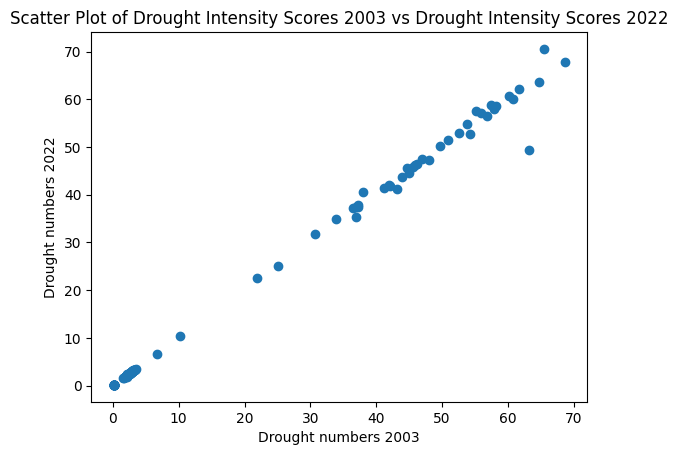

In [126]:
plt.scatter(drought_2003,drought_2022) 
plt.xlabel('Drought numbers 2003')  
plt.ylabel('Drought numbers 2022')  
plt.title('Scatter Plot of Drought Intensity Scores 2003 vs Drought Intensity Scores 2022')  
plt.show()

It is clear from the results above that the actual drought numbers are pretty much similar in 2003 and in 2022. This is because the correlation is 1 and the test results indicate no significant change in median between the two year groups. The paired test is used here, because the same variable for the same countries is measured in 2003 and later in 2022.

# Here below also the spatial analysis for the refugee data

# Origin refugee

In [127]:
# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a dictionary to store DataFrames for each year
geoworld_origins = {}

In [128]:
# Function to check if a country is an island (no neighbors in spatial weights)
def is_island(country, w):
    return len(w[country]) == 0

# Loop through each year and create a variable for each year
for year in years:
    #print(f"Processing Year: {year}")
    
    # Filter the DataFrame to include only rows for the specific year
    geoworld_origin_year = geoworld_originref[geoworld_originref['Year'] == year]
    
    # Set index
    geoworld_origin_year = geoworld_origin_year.set_index("Country")
    
    # Create the weights matrix
    try:
        w_queen = weights.Queen.from_dataframe(geoworld_origin_year, ids=geoworld_origin_year.index)
        
        # Identify and drop islands dynamically
        islands = [country for country in geoworld_origin_year.index if is_island(country, w_queen)]
        geoworld_origin_year = geoworld_origin_year.drop(islands, errors='ignore')
        
        # Recreate the weights matrix after dropping islands
        w_queen = weights.Queen.from_dataframe(geoworld_origin_year, ids=geoworld_origin_year.index)
        w_queen.transform = 'R'  # row-standardized weights
        
        # Compute spatial lag of `#refugees_origin`
        w_queen_score = weights.lag_spatial(w_queen, geoworld_origin_year['#refugees_origin'])
        geoworld_origin_year['w_queen_score'] = w_queen_score

        # Standardize the #refugees_origin values
        geoworld_origin_year['#refugees_origin_std'] = (geoworld_origin_year['#refugees_origin'] - geoworld_origin_year['#refugees_origin'].mean()) / geoworld_origin_year['#refugees_origin'].std()
        geoworld_origin_year['#refugees_origin_std'] = weights.lag_spatial(w_queen, geoworld_origin_year['#refugees_origin_std'])
        
        # Store the DataFrame in the dictionary
        geoworld_origins[year] = geoworld_origin_year
    except Exception as e:
        print(f"Error processing year {year}: {e}")

# Create variables for each year dynamically
for year, df in geoworld_origins.items():
    globals()[f'geoworld_origin_{year}'] = df

In [129]:
# Initialize dictionaries to store results
lisa_scores = {}
moran_values = {}

# Define a function to run the analysis
def run_analysis(geoworld_origin_year, year, ax_moran, ax_lisa):
    # Create weights within the function to ensure correct alignment
    w_queen = weights.Queen.from_dataframe(geoworld_origin_year, ids=geoworld_origin_year.index)
    w_queen.transform = 'R'  # row-standardized weights

    # Perform Moran's I test
    mi = esda.Moran(geoworld_origin_year['#refugees_origin'], w_queen)
    print(f"Results for Year: {year}")
    print(f"Moran's I: {mi.I}")
    print(f"P-value: {mi.p_sim}")
    
    # Store Moran's I value
    moran_values[year] = mi.I
    
    # Plot Moran's I scatter plot directly on the provided axis
    moran_scatterplot(mi, ax=ax_moran)
    ax_moran.set_title(f"Moran's I Scatter Plot for {year}")
    
    # Compute Local Moran's I
    lisa = esda.Moran_Local(geoworld_origin_year['#refugees_origin'], w_queen)
    
    # Store LISA scores for 2003 and 2022
    if year in [2003, 2022]:
        lisa_scores[year] = lisa.Is
    
    # Break observations into significant or not
    geoworld_origin_year['significant'] = lisa.p_sim < 0.05
    # Store the quadrant they belong to
    geoworld_origin_year['quadrant'] = lisa.q
    
    # Plot LISA cluster directly on the provided axis
    lisa_cluster(lisa, geoworld_origin_year, ax=ax_lisa)
    ax_lisa.set_title(f"LISA Cluster Map for {year}")

Results for Year: 2003
Moran's I: 0.047975575436899634
P-value: 0.113
Results for Year: 2004
Moran's I: 0.030463360424643766
P-value: 0.152
Results for Year: 2005
Moran's I: 0.032274112190982245
P-value: 0.141
Results for Year: 2006
Moran's I: 0.013517385633707885
P-value: 0.221
Results for Year: 2007
Moran's I: -0.008580797693610273
P-value: 0.353
Results for Year: 2008
Moran's I: -0.0048540864578283955
P-value: 0.316
Results for Year: 2009
Moran's I: -0.008329955207028814
P-value: 0.361
Results for Year: 2010
Moran's I: -0.008300008685191984
P-value: 0.327
Results for Year: 2011
Moran's I: -0.006317816636903857
P-value: 0.328
Results for Year: 2012
Moran's I: 0.01346171388041908
P-value: 0.219
Results for Year: 2013
Moran's I: 0.00860859057534509
P-value: 0.223
Results for Year: 2014
Moran's I: 0.02202290930413543
P-value: 0.137
Results for Year: 2015
Moran's I: 0.00979680860776619
P-value: 0.21
Results for Year: 2016
Moran's I: 0.009464322733717173
P-value: 0.201
Results for Year: 2

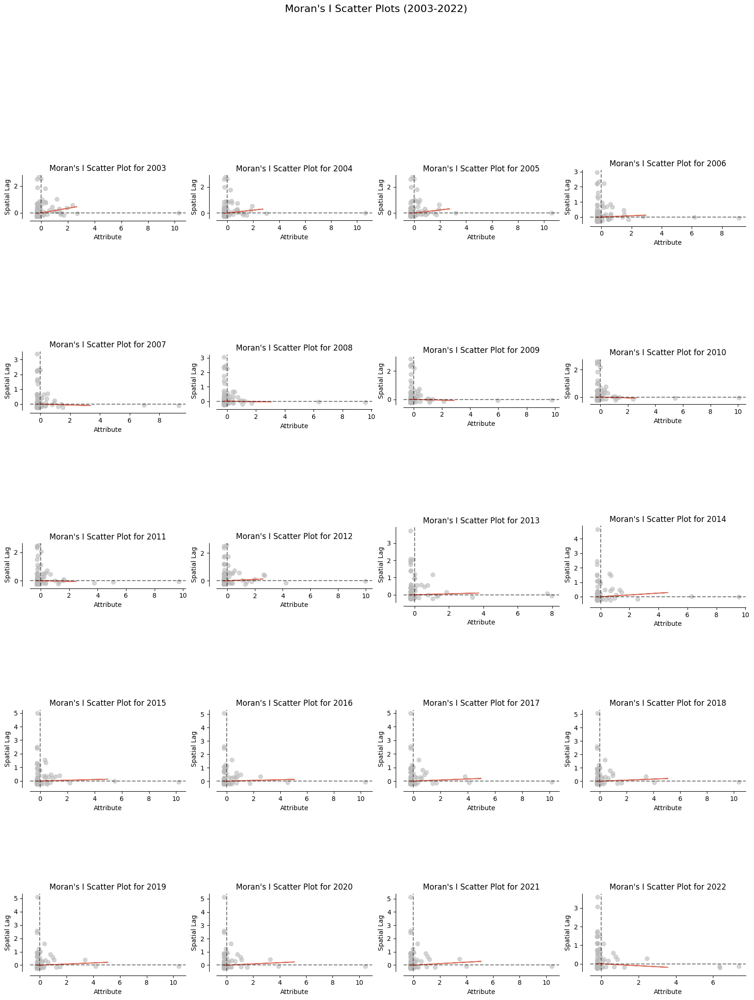

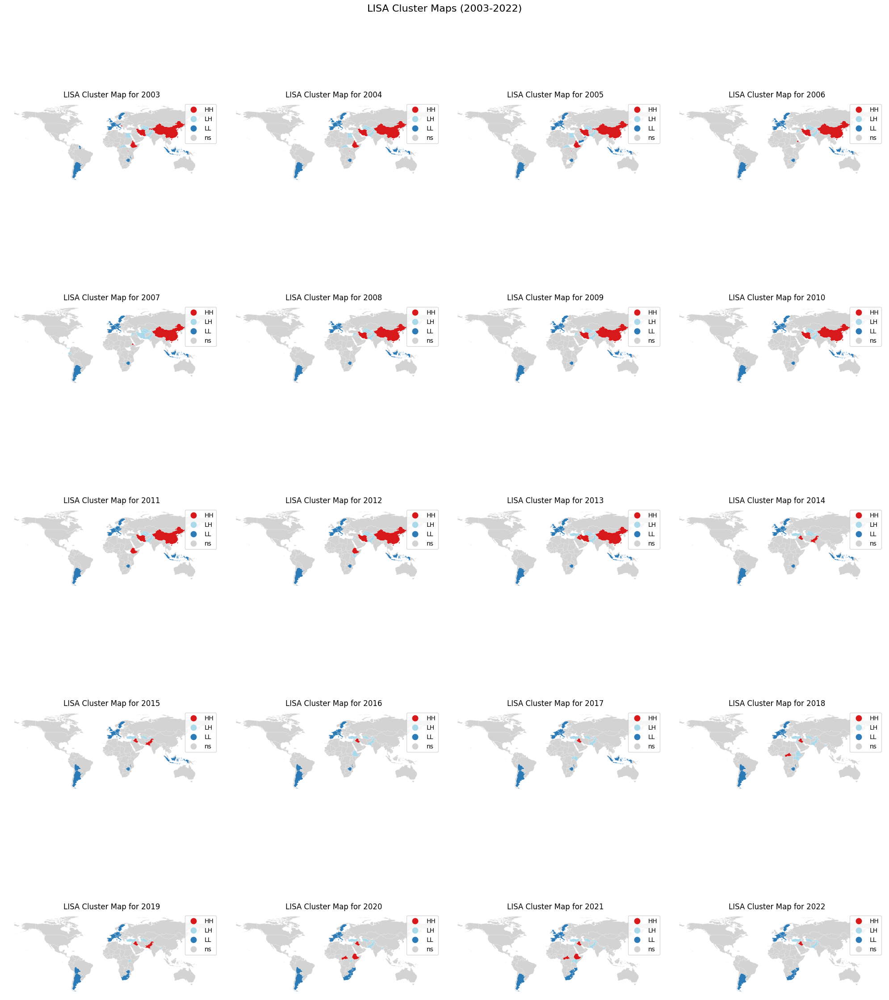

In [130]:
# Number of rows and columns for subplots
nrows, ncols = 5, 4

# Create subplots for Moran's I scatter plots
fig_moran, axes_moran = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_moran.suptitle("Moran's I Scatter Plots (2003-2022)", fontsize=16)

# Create subplots for LISA cluster maps
fig_lisa, axes_lisa = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_lisa.suptitle("LISA Cluster Maps (2003-2022)", fontsize=16)

# Execute analysis for each year and plot on the respective subplots
for i, year in enumerate(years):
    row, col = divmod(i, ncols)
    if year in geoworld_origins:
        geoworld_origin_year = globals()[f'geoworld_origin_{year}']
        run_analysis(geoworld_origin_year, year, axes_moran[row, col], axes_lisa[row, col])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [131]:
# Align the indices of LISA scores for 2003 and 2022
lisa_2003_df = pd.Series(lisa_scores[2003], index=geoworld_origins[2003].index, name='LISA_2003')
lisa_2022_df = pd.Series(lisa_scores[2022], index=geoworld_origins[2022].index, name='LISA_2022')

# Merge the dataframes to align indices
merged_lisa_df = pd.merge(lisa_2003_df, lisa_2022_df, left_index=True, right_index=True, how='inner')

# Extract aligned LISA scores
lisa_2003_aligned = merged_lisa_df['LISA_2003']
lisa_2022_aligned = merged_lisa_df['LISA_2022']

# Calculate correlation between LISA scores of 2003 and 2022
correlation_lisa = np.corrcoef(lisa_2003_aligned, lisa_2022_aligned)[0, 1]
print(f"Pearson correlation between LISA scores of 2003 and 2022: {correlation_lisa}")
# Kendall correlation
kendall_corr, kendall_p = kendalltau(lisa_2003_aligned, lisa_2022_aligned)
print(f"Kendall correlation between 2003 and 2022 LISA values: {kendall_corr}, p = {kendall_p}")

# Extract Moran's I values
years_list = list(moran_values.keys())
moran_I_values = list(moran_values.values())

# Calculate correlation between years and Moran's I values
correlation_year_moran = np.corrcoef(years_list, moran_I_values)[0, 1]
print(f"Correlation between years and Moran's I values: {correlation_year_moran}")

Pearson correlation between LISA scores of 2003 and 2022: 0.17827044960168337
Kendall correlation between 2003 and 2022 LISA values: 0.41772570557317434, p = 7.41437808716829e-14
Correlation between years and Moran's I values: -0.2434872227341272


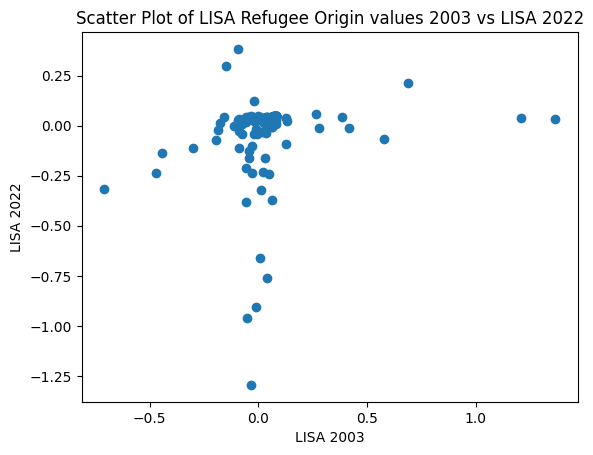

In [132]:
plt.scatter(lisa_2003_aligned, lisa_2022_aligned)
plt.xlabel('LISA 2003') 
plt.ylabel('LISA 2022') 
plt.title('Scatter Plot of LISA Refugee Origin values 2003 vs LISA 2022') 
plt.show()

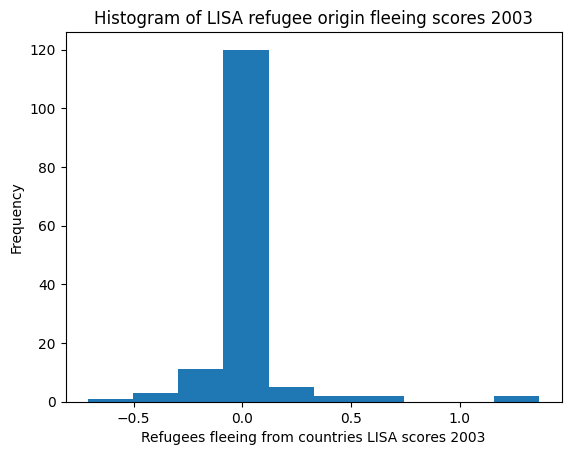

In [133]:
plt.hist(lisa_2003_aligned)
plt.xlabel('Refugees fleeing from countries LISA scores 2003') 
plt.ylabel('Frequency')  
plt.title('Histogram of LISA refugee origin fleeing scores 2003')  
plt.show()

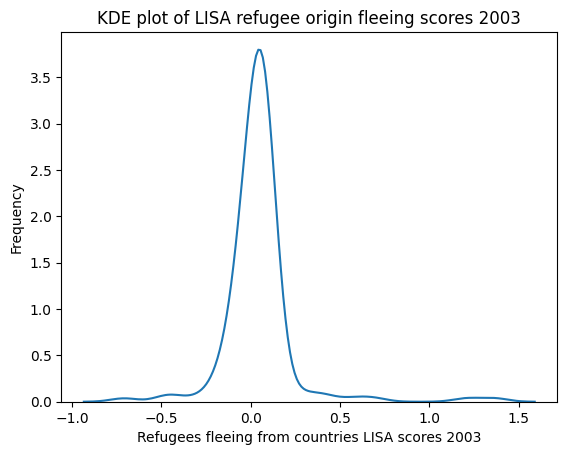

In [134]:
sns.kdeplot(lisa_2003_aligned)
plt.xlabel('Refugees fleeing from countries LISA scores 2003') 
plt.ylabel('Frequency')  
plt.title('KDE plot of LISA refugee origin fleeing scores 2003')  
plt.show()

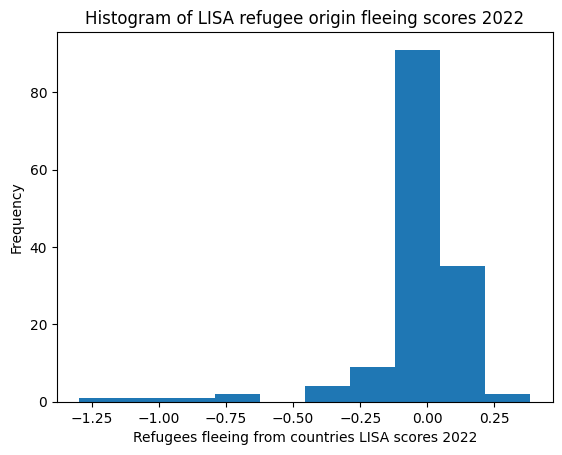

In [135]:
plt.hist(lisa_2022_aligned)
plt.xlabel('Refugees fleeing from countries LISA scores 2022') 
plt.ylabel('Frequency')  
plt.title('Histogram of LISA refugee origin fleeing scores 2022')  
plt.show()

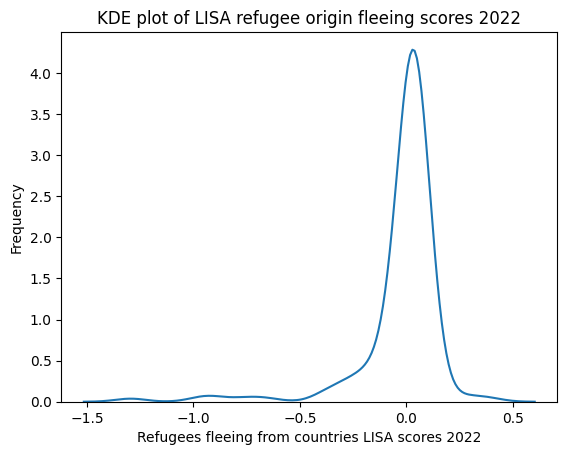

In [136]:
sns.kdeplot(lisa_2022_aligned)
plt.xlabel('Refugees fleeing from countries LISA scores 2022') 
plt.ylabel('Frequency')  
plt.title('KDE plot of LISA refugee origin fleeing scores 2022')  
plt.show()

In [137]:
import scipy.stats as stats

# Standardize the data
data_standardized = (lisa_2003_aligned - np.mean(lisa_2003_aligned)) / np.std(lisa_2003_aligned)

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.3553509349346702, p-value = 5.302307036920377e-17
Reject the null hypothesis: The data is not normally distributed.


In [138]:
# Standardize the data
data_standardized = (lisa_2022_aligned - np.mean(lisa_2022_aligned)) / np.std(lisa_2022_aligned)

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.32232082362355774, p-value = 5.356703176012521e-14
Reject the null hypothesis: The data is not normally distributed.


In [139]:
import scipy.stats as stats

# Perform the Wilcoxon Signed-Rank Test
w_stat, p_value = stats.wilcoxon(lisa_2003_aligned, lisa_2022_aligned)
print(f"Wilcoxon Signed-Rank test: W statistic = {w_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference between 2003 and 2022.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference between 2003 and 2022.")

Wilcoxon Signed-Rank test: W statistic = 3318.0, p-value = 6.334066406406302e-05
Reject the null hypothesis: There is a significant difference between 2003 and 2022.


Mean difference: -0.0713839370988543
Median difference: -0.03169741388839262
Standard deviation of differences: 0.25671344272992486
Number of positive changes: 40
Number of negative changes: 106
Number of no changes: 0


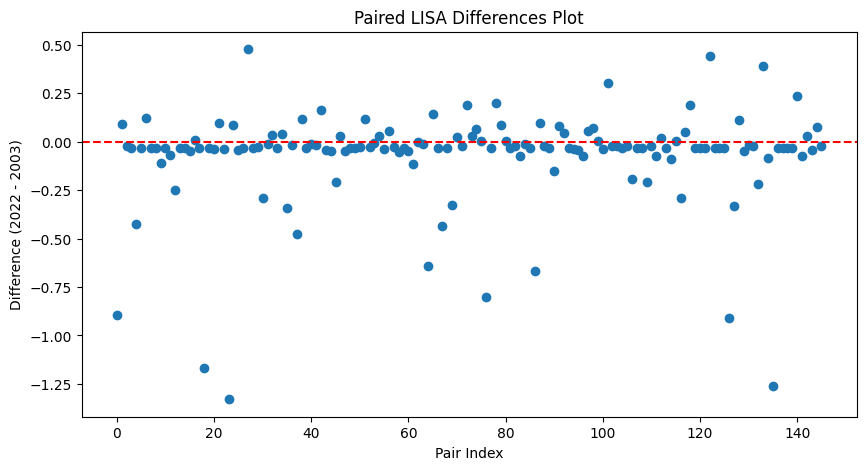

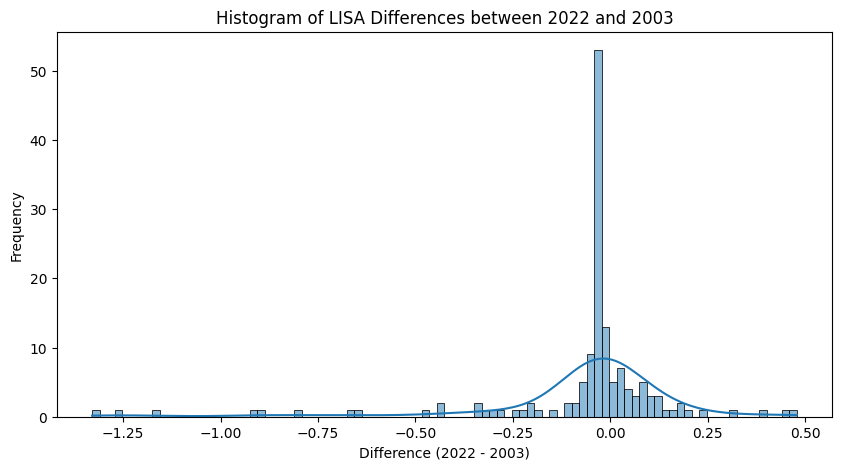

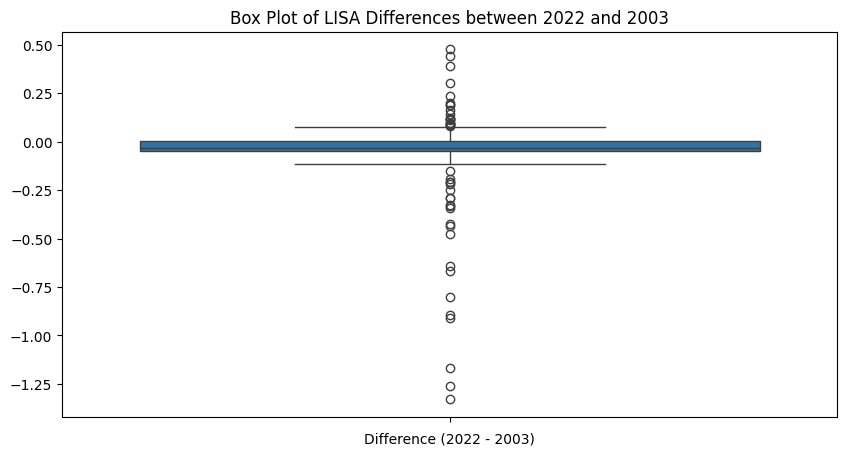

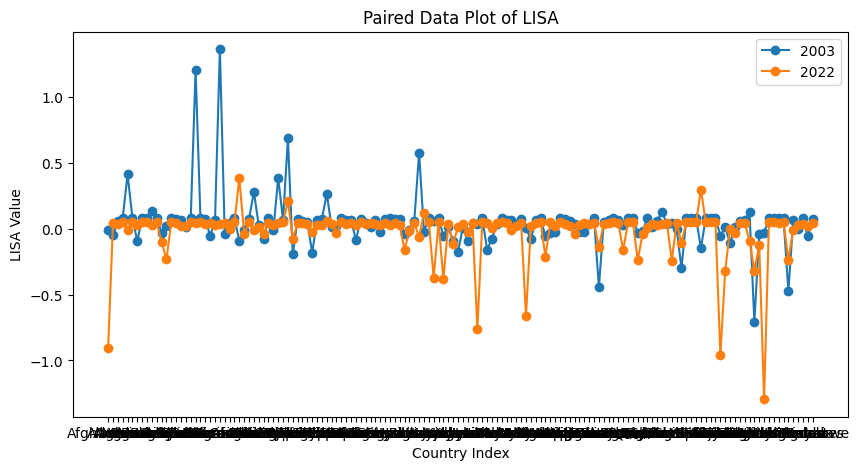

In [140]:
# Calculate the differences
differences = np.array(lisa_2022_aligned) - np.array(lisa_2003_aligned)

# Summarize the differences
mean_diff = np.mean(differences)
median_diff = np.median(differences)
std_diff = np.std(differences)

#print(f"Differences between 2022 and 2003: {differences}")
print(f"Mean difference: {mean_diff}")
print(f"Median difference: {median_diff}")
print(f"Standard deviation of differences: {std_diff}")

# Further analysis
positive_changes = np.sum(differences > 0)
negative_changes = np.sum(differences < 0)
no_changes = np.sum(differences == 0)

print(f"Number of positive changes: {positive_changes}")
print(f"Number of negative changes: {negative_changes}")
print(f"Number of no changes: {no_changes}")

# Visualization

# Paired Differences Plot
plt.figure(figsize=(10, 5))
plt.scatter(range(len(differences)), differences, marker='o')
plt.axhline(0, color='red', linestyle='--')
plt.title('Paired LISA Differences Plot')
plt.xlabel('Pair Index')
plt.ylabel('Difference (2022 - 2003)')
plt.show()

# Histogram of Differences
plt.figure(figsize=(10, 5))
sns.histplot(differences, kde=True)
plt.title('Histogram of LISA Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.ylabel('Frequency')
plt.show()

# Box Plot of Differences
plt.figure(figsize=(10, 5))
sns.boxplot(data=differences)
plt.title('Box Plot of LISA Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.show()

# Line Plot of Paired Data
plt.figure(figsize=(10, 5))
plt.plot(lisa_2003_aligned, label='2003', marker='o')
plt.plot(lisa_2022_aligned, label='2022', marker='o')
plt.legend()
plt.title('Paired Data Plot of LISA')
plt.xlabel('Country Index')
plt.ylabel('LISA Value')
plt.show()

In [141]:
# Calculate absolute differences
differences = lisa_2022_aligned - lisa_2003_aligned
print(differences[differences > 0.5])

Series([], dtype: float64)


In [142]:
print(differences[differences < -0.5])

Country
Afghanistan              -0.893693
Bosnia and Herzegovina   -1.168166
Burundi                  -1.329348
Iran                     -0.641635
Lebanon                  -0.798994
Moldova                  -0.668614
Syria                    -0.907809
Ukraine                  -1.262046
dtype: float64


# Below here we compare normal (non-clustered) origin data between 2003 and 2022.

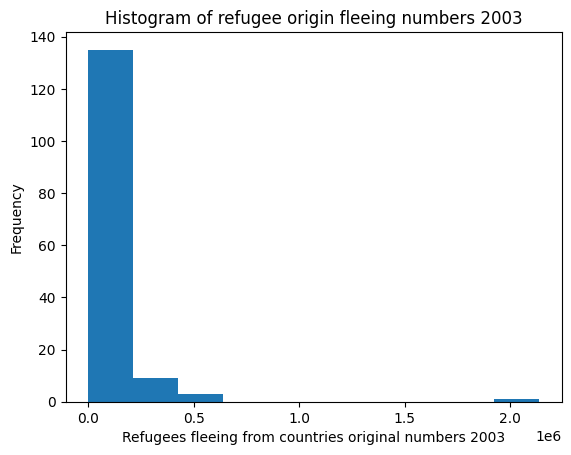

In [143]:
plt.hist(geoworld_origins[2003]['#refugees_origin'])
plt.xlabel('Refugees fleeing from countries original numbers 2003') 
plt.ylabel('Frequency')  
plt.title('Histogram of refugee origin fleeing numbers 2003')  
plt.show()

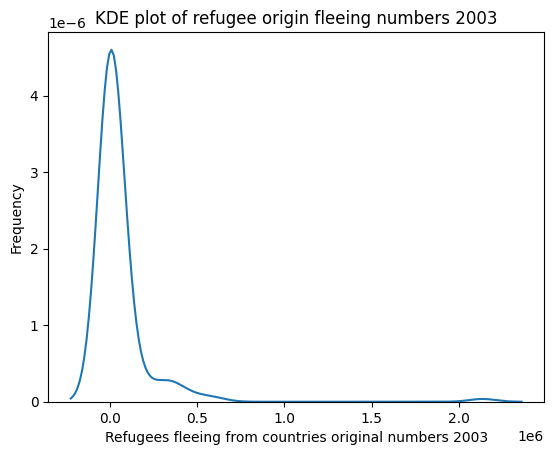

In [144]:
sns.kdeplot(geoworld_origins[2003]['#refugees_origin'])
plt.xlabel('Refugees fleeing from countries original numbers 2003') 
plt.ylabel('Frequency')  
plt.title('KDE plot of refugee origin fleeing numbers 2003')  
plt.show()

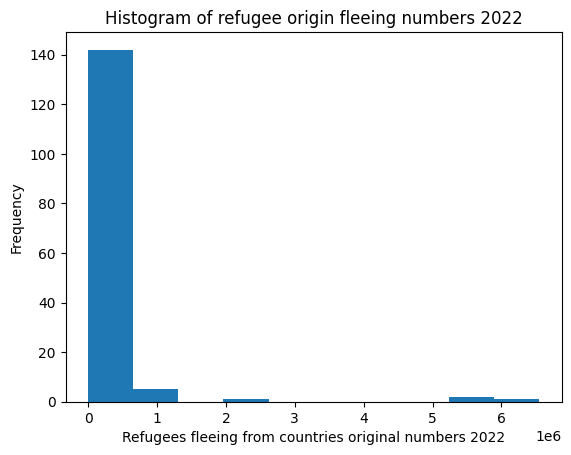

In [145]:
plt.hist(geoworld_origins[2022]['#refugees_origin'])
plt.xlabel('Refugees fleeing from countries original numbers 2022') 
plt.ylabel('Frequency')  
plt.title('Histogram of refugee origin fleeing numbers 2022')  
plt.show()

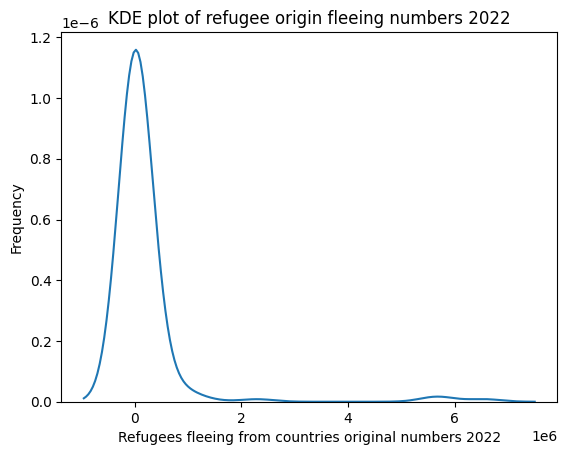

In [146]:
sns.kdeplot(geoworld_origins[2022]['#refugees_origin'])
plt.xlabel('Refugees fleeing from countries original numbers 2022') 
plt.ylabel('Frequency')  
plt.title('KDE plot of refugee origin fleeing numbers 2022')  
plt.show()

Clearly, we again have non-normal data.

In [147]:
from scipy.stats import wilcoxon

# Check data length consistency and extract drought indicator values
if 2003 in geoworld_origins and 2022 in geoworld_origins:
    df_2003 = geoworld_origins[2003]
    df_2022 = geoworld_origins[2022]
    
    # Ensure equal length of data
    common_countries = df_2003.index.intersection(df_2022.index)
    refugees_origin_2003 = df_2003.loc[common_countries, '#refugees_origin']
    refugees_origin_2022 = df_2022.loc[common_countries, '#refugees_origin']
    
    # Verify length
    if len(refugees_origin_2003) == len(refugees_origin_2022):        
        # Calculate correlation between refugee origin values of 2003 and 2022
        correlation_origin = np.corrcoef(refugees_origin_2003, refugees_origin_2022)[0, 1]
        print(f"Pearson correlation between 2003 and 2022 refugee origin values: {correlation_origin}")
        # Kendall correlation
        kendall_corr, kendall_p = kendalltau(refugees_origin_2003, refugees_origin_2022)
        print(f"Kendall correlation between 2003 and 2022 refugee origin values: {kendall_corr}, p = {kendall_p}")
        
        # Perform Wilcoxon Signed-Rank Test
        wilcoxon_stat, wilcoxon_pval = wilcoxon(refugees_origin_2003, refugees_origin_2022)
        print(f"Wilcoxon Signed-Rank Test Statistic: {wilcoxon_stat}, p-value: {wilcoxon_pval}")
        # Interpret the Wilcoxon test result
        alpha = 0.05
        if wilcoxon_pval < alpha:
            print("The difference in number of refugees at origin locations between 2003 and 2022 is statistically significant.")
        else:
            print("The difference in number of refugees at origin locations between 2003 and 2022 is not statistically significant.")
    else:
        print("Error: Datasets for 2003 and 2022 have different lengths.")
else:
    print("Error: Data for 2003 or 2022 not found in geoworld_destinations.")

Pearson correlation between 2003 and 2022 refugee origin values: 0.5163467213741154
Kendall correlation between 2003 and 2022 refugee origin values: 0.6236589805017252, p = 6.120091867270958e-29
Wilcoxon Signed-Rank Test Statistic: 4335.5, p-value: 0.058903887070116755
The difference in number of refugees at origin locations between 2003 and 2022 is not statistically significant.


In [148]:
refugees_origin_2003.mean()

58776.260273972606

In [149]:
refugees_origin_2022.mean()

182087.02739726027

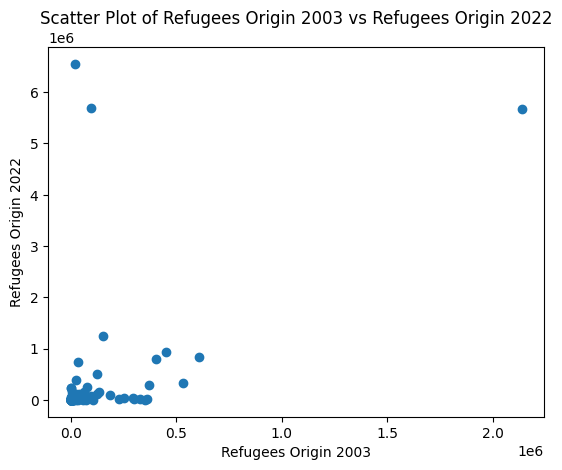

In [150]:
plt.scatter(refugees_origin_2003, refugees_origin_2022)
plt.xlabel('Refugees Origin 2003') 
plt.ylabel('Refugees Origin 2022') 
plt.title('Scatter Plot of Refugees Origin 2003 vs Refugees Origin 2022')  
plt.show()

In [151]:
np.median(refugees_origin_2003)

1570.5

In [152]:
np.median(refugees_origin_2022)

3533.0

Mean difference: 123310.76712328767
Median difference: 79.5
Standard deviation of differences: 773280.8921600812
Number of positive changes: 83
Number of negative changes: 62
Number of no changes: 1


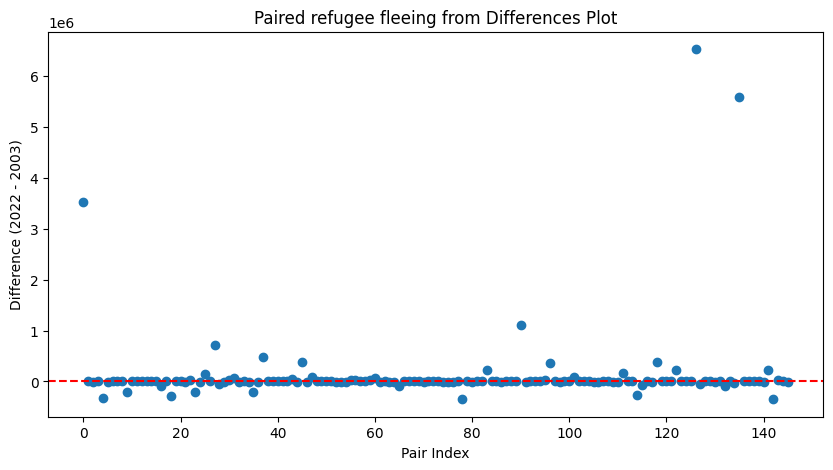

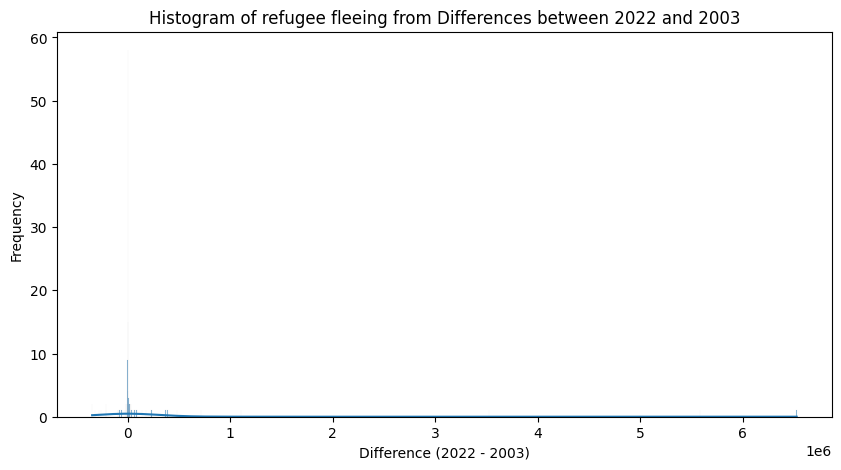

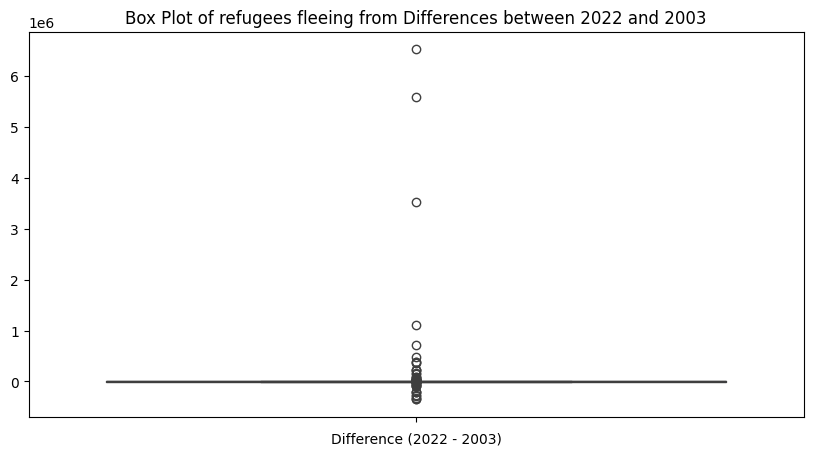

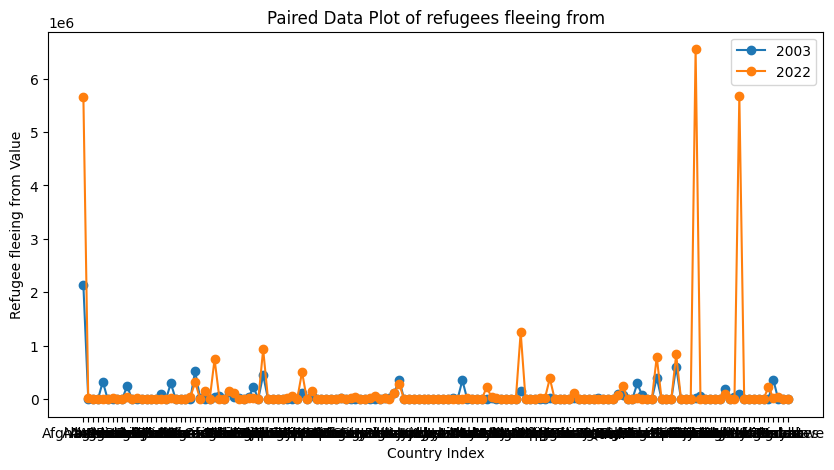

In [153]:
# Calculate the differences
differences = np.array(refugees_origin_2022) - np.array(refugees_origin_2003)

# Summarize the differences
mean_diff = np.mean(differences)
median_diff = np.median(differences)
std_diff = np.std(differences)

#print(f"Differences between 2022 and 2003: {differences}")
print(f"Mean difference: {mean_diff}")
print(f"Median difference: {median_diff}")
print(f"Standard deviation of differences: {std_diff}")

# Further analysis
positive_changes = np.sum(differences > 0)
negative_changes = np.sum(differences < 0)
no_changes = np.sum(differences == 0)

print(f"Number of positive changes: {positive_changes}")
print(f"Number of negative changes: {negative_changes}")
print(f"Number of no changes: {no_changes}")

# Visualization

# Paired Differences Plot
plt.figure(figsize=(10, 5))
plt.scatter(range(len(differences)), differences, marker='o')
plt.axhline(0, color='red', linestyle='--')
plt.title('Paired refugee fleeing from Differences Plot')
plt.xlabel('Pair Index')
plt.ylabel('Difference (2022 - 2003)')
plt.show()

# Histogram of Differences
plt.figure(figsize=(10, 5))
sns.histplot(differences, kde=True)
plt.title('Histogram of refugee fleeing from Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.ylabel('Frequency')
plt.show()

# Box Plot of Differences
plt.figure(figsize=(10, 5))
sns.boxplot(data=differences)
plt.title('Box Plot of refugees fleeing from Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.show()

# Line Plot of Paired Data
plt.figure(figsize=(10, 5))
plt.plot(refugees_origin_2003, label='2003', marker='o')
plt.plot(refugees_origin_2022, label='2022', marker='o')
plt.legend()
plt.title('Paired Data Plot of refugees fleeing from')
plt.xlabel('Country Index')
plt.ylabel('Refugee fleeing from Value')
plt.show()

In [154]:
# Calculate absolute differences
differences = refugees_origin_2022 - refugees_origin_2003
print(differences[differences > 100000])

Country
Afghanistan                     3525636
Cameroon                         141144
Central African Republic         712933
Democratic Republic of Congo     478438
Eritrea                          384180
Mali                             226264
Myanmar                         1101741
Nigeria                          366660
Rwanda                           174427
Somalia                          388184
Sudan                            230526
Syria                           6527002
Ukraine                         5585739
Venezuela                        233778
Name: #refugees_origin, dtype: int64


In [155]:
print(differences[differences < -100000])

Country
Angola                   -317822
Azerbaijan               -211235
Bosnia and Herzegovina   -282099
Burundi                  -211090
Croatia                  -212620
Liberia                  -348255
Serbia                   -266028
Vietnam                  -345883
Name: #refugees_origin, dtype: int64


# Destination refugee

In [156]:
# Define the years range
years = list(range(2003, 2023))  # Years from 2003 to 2022

# Initialize a dictionary to store DataFrames for each year
geoworld_destinations = {}

In [157]:
# Function to check if a country is an island (no neighbors in spatial weights)
def is_island(country, w):
    return len(w[country]) == 0

# Loop through each year and create a variable for each year
for year in years:
    #print(f"Processing Year: {year}")
    
    # Filter the DataFrame to include only rows for the specific year
    geoworld_destination_year = geoworld_destinationref[geoworld_destinationref['Year'] == year]
    
    # Set index
    geoworld_destination_year = geoworld_destination_year.set_index("Country")
    
    # Create the weights matrix
    try:      
        w_queen = weights.Queen.from_dataframe(geoworld_destination_year, ids=geoworld_destination_year.index)
        
        # Identify and drop islands dynamically
        islands = [country for country in geoworld_destination_year.index if is_island(country, w_queen)]
        geoworld_destination_year = geoworld_destination_year.drop(islands, errors='ignore')
        
        # Recreate the weights matrix after dropping islands
        w_queen = weights.Queen.from_dataframe(geoworld_destination_year, ids=geoworld_destination_year.index)
        w_queen.transform = 'R'  # row-standardized weights
        
        # Compute spatial lag of `#refugees_destination`
        w_queen_score = weights.lag_spatial(w_queen, geoworld_destination_year['#refugees_destination'])
        geoworld_destination_year['w_queen_score'] = w_queen_score

        # Standardize the #refugees_destination values
        geoworld_destination_year['#refugees_destination_std'] = (geoworld_destination_year['#refugees_destination'] - geoworld_destination_year['#refugees_destination'].mean()) / geoworld_destination_year['#refugees_destination'].std()
        geoworld_destination_year['w_#refugees_destination_std'] = weights.lag_spatial(w_queen, geoworld_destination_year['#refugees_destination_std'])
        
        # Store the DataFrame in the dictionary
        geoworld_destinations[year] = geoworld_destination_year
    except Exception as e:
        print(f"Error processing year {year}: {e}")

# Create variables for each year dynamically
for year, df in geoworld_destinations.items():
    globals()[f'geoworld_destination_{year}'] = df

In [158]:
# Initialize dictionaries to store results
lisa_scores = {}
moran_values = {}

# Define a function to run the analysis
def run_analysis(geoworld_destination_year, year, ax_moran, ax_lisa):
    # Create weights within the function to ensure correct alignment
    w_queen = weights.Queen.from_dataframe(geoworld_destination_year, ids=geoworld_destination_year.index)
    w_queen.transform = 'R'  # row-standardized weights

    # Perform Moran's I test
    mi = esda.Moran(geoworld_destination_year['#refugees_destination'], w_queen)
    print(f"Results for Year: {year}")
    print(f"Moran's I: {mi.I}")
    print(f"P-value: {mi.p_sim}")
    
    # Store Moran's I value
    moran_values[year] = mi.I
    
    # Plot Moran's I scatter plot directly on the provided axis
    moran_scatterplot(mi, ax=ax_moran)
    ax_moran.set_title(f"Moran's I Scatter Plot for {year}")
    
    # Compute Local Moran's I
    lisa = esda.Moran_Local(geoworld_destination_year['#refugees_destination'], w_queen)
    
    # Store LISA scores for 2003 and 2022
    if year in [2003, 2022]:
        lisa_scores[year] = lisa.Is
    
    # Break observations into significant or not
    geoworld_destination_year['significant'] = lisa.p_sim < 0.05
    # Store the quadrant they belong to
    geoworld_destination_year['quadrant'] = lisa.q
    
    # Plot LISA cluster directly on the provided axis
    lisa_cluster(lisa, geoworld_destination_year, ax=ax_lisa)
    ax_lisa.set_title(f"LISA Cluster Map for {year}")

Results for Year: 2003
Moran's I: 0.11224620388844037
P-value: 0.048
Results for Year: 2004
Moran's I: 0.12414294576861777
P-value: 0.034
Results for Year: 2005
Moran's I: 0.1338408280923426
P-value: 0.027
Results for Year: 2006
Moran's I: 0.17716610212036246
P-value: 0.024
Results for Year: 2007
Moran's I: 0.2074721405439047
P-value: 0.014
Results for Year: 2008
Moran's I: 0.20240987187931267
P-value: 0.017
Results for Year: 2009
Moran's I: 0.1938631448415736
P-value: 0.013
Results for Year: 2010
Moran's I: 0.18867268613070337
P-value: 0.016
Results for Year: 2011
Moran's I: 0.17409055194765446
P-value: 0.012
Results for Year: 2012
Moran's I: 0.18348090792901225
P-value: 0.012
Results for Year: 2013
Moran's I: 0.16951577755700328
P-value: 0.017
Results for Year: 2014
Moran's I: 0.17232936121015563
P-value: 0.014
Results for Year: 2015
Moran's I: 0.12835922256565394
P-value: 0.044
Results for Year: 2016
Moran's I: 0.11086681483889686
P-value: 0.05
Results for Year: 2017
Moran's I: 0.09

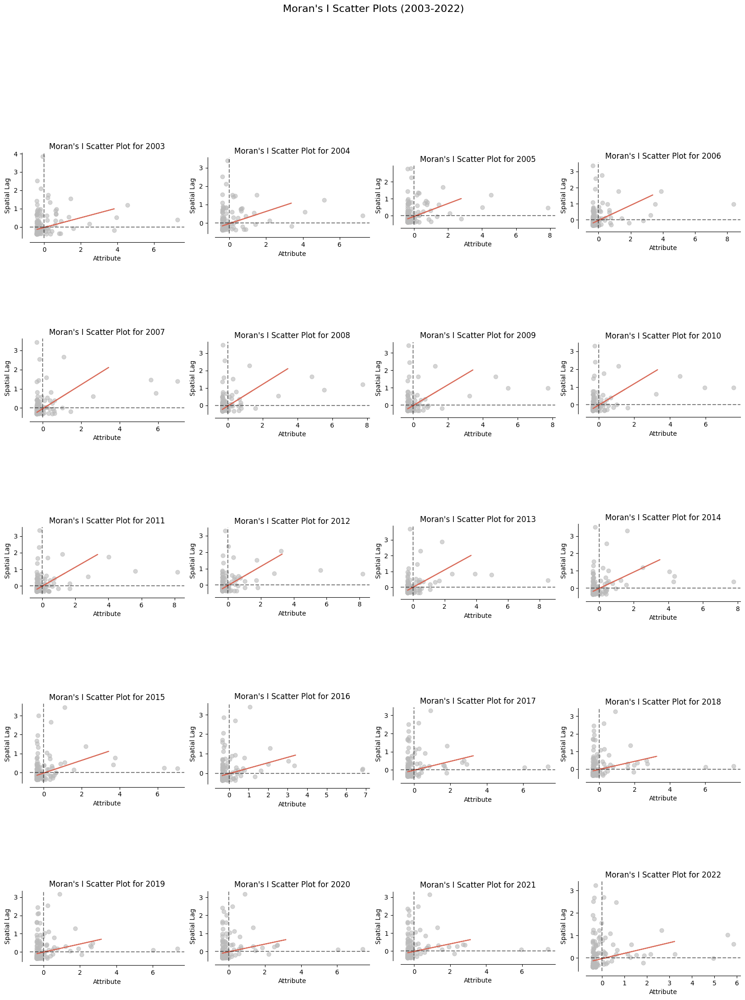

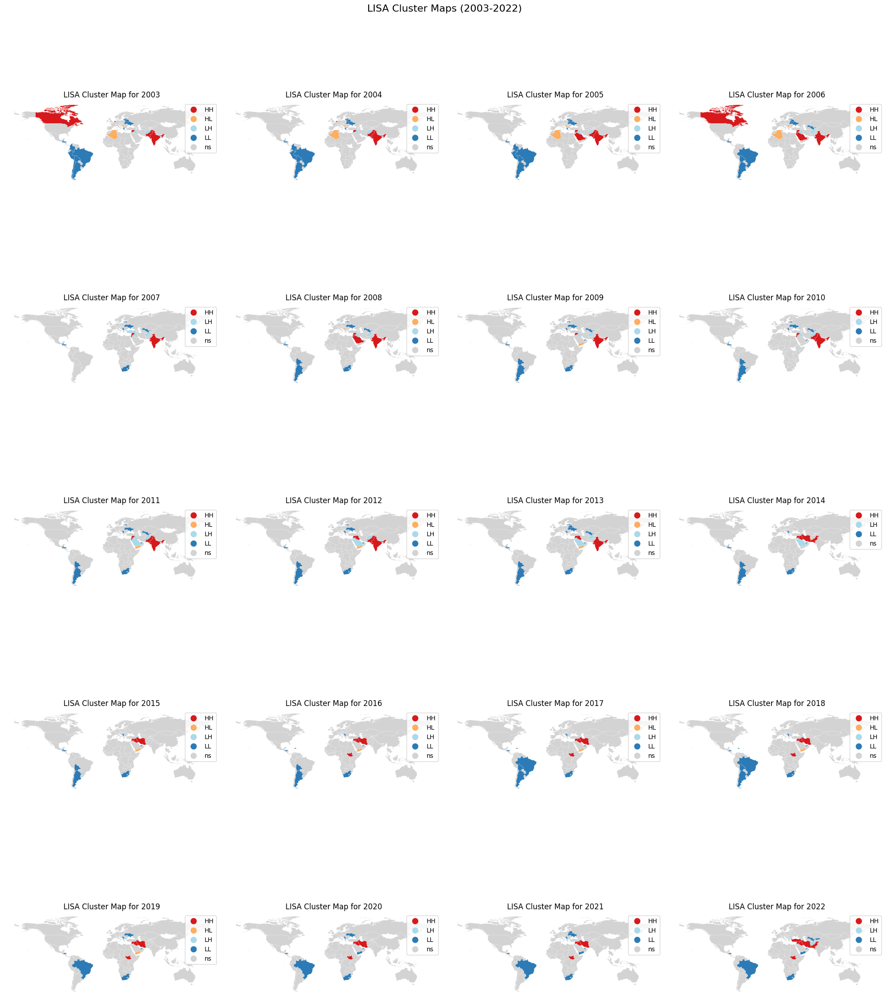

In [159]:
# Number of rows and columns for subplots
nrows, ncols = 5, 4

# Create subplots for Moran's I scatter plots
fig_moran, axes_moran = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_moran.suptitle("Moran's I Scatter Plots (2003-2022)", fontsize=16)

# Create subplots for LISA cluster maps
fig_lisa, axes_lisa = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25))
fig_lisa.suptitle("LISA Cluster Maps (2003-2022)", fontsize=16)

# Execute analysis for each year and plot on the respective subplots
for i, year in enumerate(years):
    row, col = divmod(i, ncols)
    if year in geoworld_destinations:
        geoworld_destination_year = globals()[f'geoworld_destination_{year}']
        run_analysis(geoworld_destination_year, year, axes_moran[row, col], axes_lisa[row, col])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [160]:
# Align the indices of LISA scores for 2003 and 2022
lisa_2003_df = pd.Series(lisa_scores[2003], index=geoworld_destinations[2003].index, name='LISA_2003')
lisa_2022_df = pd.Series(lisa_scores[2022], index=geoworld_destinations[2022].index, name='LISA_2022')

# Merge the dataframes to align indices
merged_lisa_df = pd.merge(lisa_2003_df, lisa_2022_df, left_index=True, right_index=True, how='inner')

# Extract aligned LISA scores
lisa_2003_aligned = merged_lisa_df['LISA_2003']
lisa_2022_aligned = merged_lisa_df['LISA_2022']

# Calculate correlation between LISA scores of 2003 and 2022
correlation_lisa = np.corrcoef(lisa_2003_aligned, lisa_2022_aligned)[0, 1]
print(f"Pearson correlation between LISA scores of 2003 and 2022: {correlation_lisa}")
# Kendall correlation
kendall_corr, kendall_p = kendalltau(lisa_2003_aligned, lisa_2022_aligned)
print(f"Kendall correlation between 2003 and 2022 refugee origin values: {kendall_corr}, p = {kendall_p}")

# Extract Moran's I values
years_list = list(moran_values.keys())
moran_I_values = list(moran_values.values())

# Calculate correlation between years and Moran's I values
correlation_year_moran = np.corrcoef(years_list, moran_I_values)[0, 1]
print(f"Correlation between years and Moran's I values: {correlation_year_moran}")

Pearson correlation between LISA scores of 2003 and 2022: 0.5393155796596971
Kendall correlation between 2003 and 2022 refugee origin values: 0.11063005582773158, p = 0.05893395481201064
Correlation between years and Moran's I values: -0.5668441915453201


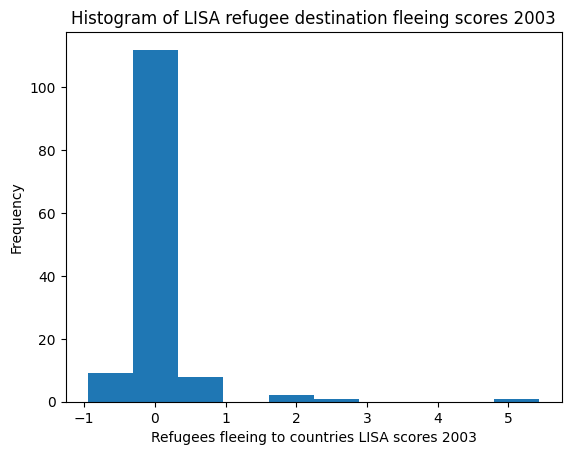

In [161]:
plt.hist(lisa_2003_aligned)
plt.xlabel('Refugees fleeing to countries LISA scores 2003') 
plt.ylabel('Frequency')  
plt.title('Histogram of LISA refugee destination fleeing scores 2003')  
plt.show()

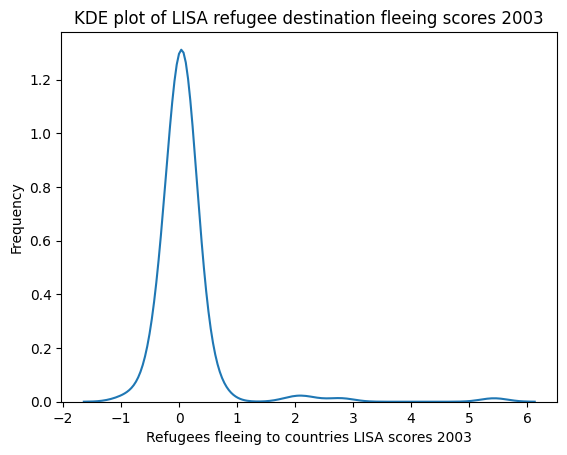

In [162]:
sns.kdeplot(lisa_2003_aligned)
plt.xlabel('Refugees fleeing to countries LISA scores 2003') 
plt.ylabel('Frequency')  
plt.title('KDE plot of LISA refugee destination fleeing scores 2003')  
plt.show()

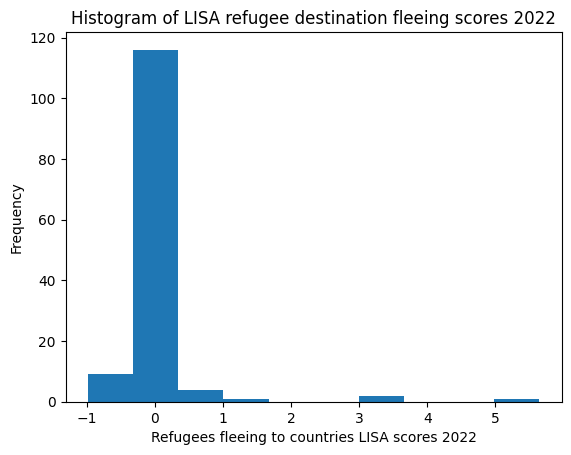

In [163]:
plt.hist(lisa_2022_aligned)
plt.xlabel('Refugees fleeing to countries LISA scores 2022') 
plt.ylabel('Frequency')  
plt.title('Histogram of LISA refugee destination fleeing scores 2022')  
plt.show()

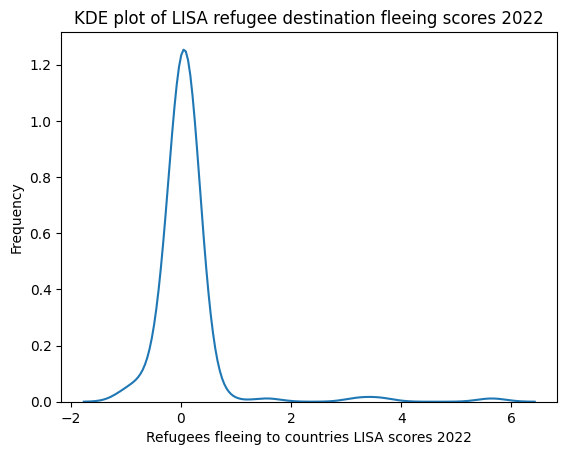

In [164]:
sns.kdeplot(lisa_2022_aligned)
plt.xlabel('Refugees fleeing to countries LISA scores 2022') 
plt.ylabel('Frequency')  
plt.title('KDE plot of LISA refugee destination fleeing scores 2022')  
plt.show()

In [165]:
import scipy.stats as stats

# Standardize the data
data_standardized = (lisa_2003_aligned - np.mean(lisa_2003_aligned)) / np.std(lisa_2003_aligned)

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.3607286690670556, p-value = 5.238913215714359e-16
Reject the null hypothesis: The data is not normally distributed.


In [166]:
# Standardize the data
data_standardized = (lisa_2022_aligned - np.mean(lisa_2022_aligned)) / np.std(lisa_2022_aligned)

# Perform the Kolmogorov-Smirnov test for normality
ks_stat, p_value = stats.kstest(data_standardized, 'norm')
print(f"KS test: KS statistic = {ks_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data is not normally distributed.")
else:
    print("Fail to reject the null hypothesis: The data is normally distributed.")

KS test: KS statistic = 0.3736236121941552, p-value = 3.5446305779959246e-17
Reject the null hypothesis: The data is not normally distributed.


In [167]:
import scipy.stats as stats

# Perform the Wilcoxon Signed-Rank Test
w_stat, p_value = stats.wilcoxon(lisa_2003_aligned, lisa_2022_aligned)
print(f"Wilcoxon Signed-Rank test: W statistic = {w_stat}, p-value = {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference between 2003 and 2022.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference between 2003 and 2022.")

Wilcoxon Signed-Rank test: W statistic = 4280.0, p-value = 0.6934786748345849
Fail to reject the null hypothesis: There is no significant difference between 2003 and 2022.


Text(0.5, 1.0, 'Scatter Plot of LISA 2003 vs LISA 2022')

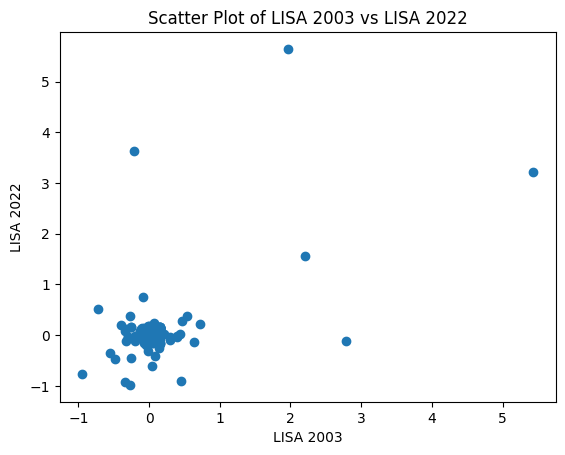

In [168]:
plt.scatter(lisa_2003_aligned, lisa_2022_aligned)
plt.xlabel('LISA 2003')  
plt.ylabel('LISA 2022')  
plt.title('Scatter Plot of LISA 2003 vs LISA 2022')  

Mean difference: 0.008628153945786188
Median difference: 0.006834190566396919
Standard deviation of differences: 0.629835926234093
Number of positive changes: 71
Number of negative changes: 62
Number of no changes: 0


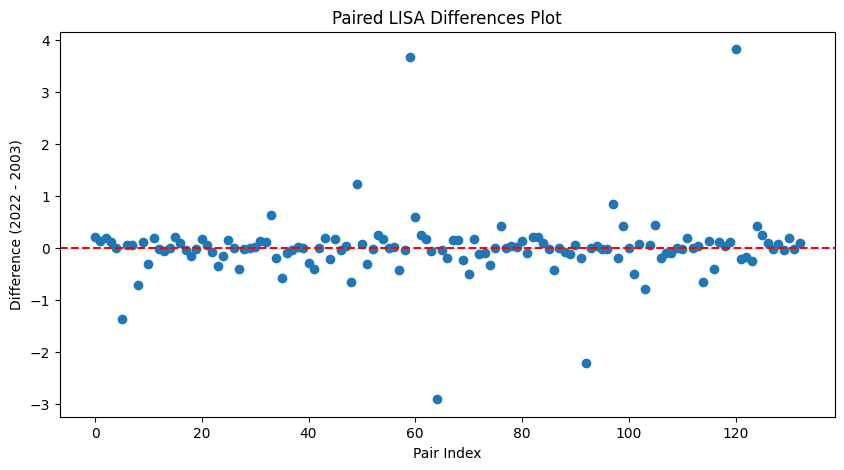

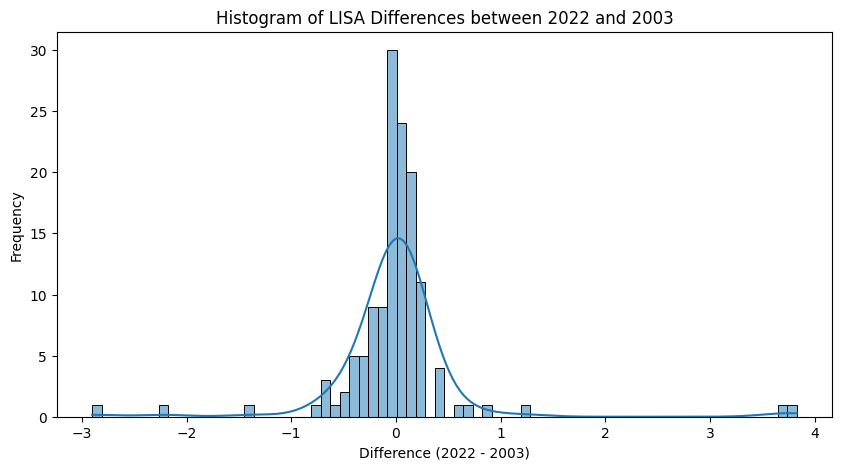

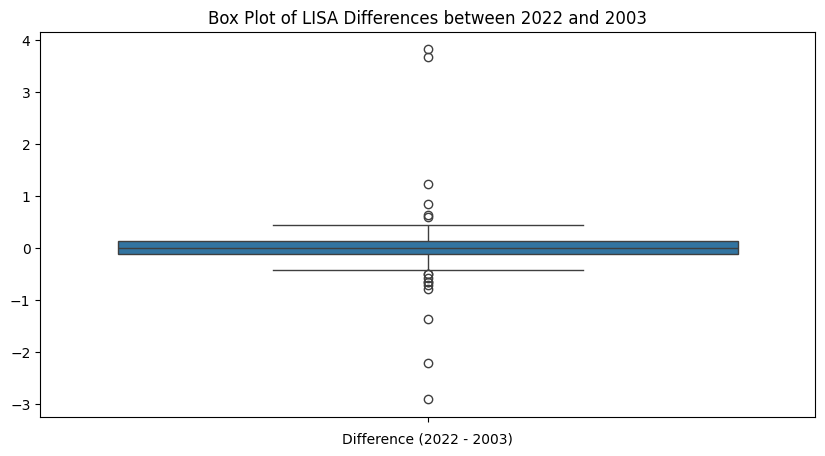

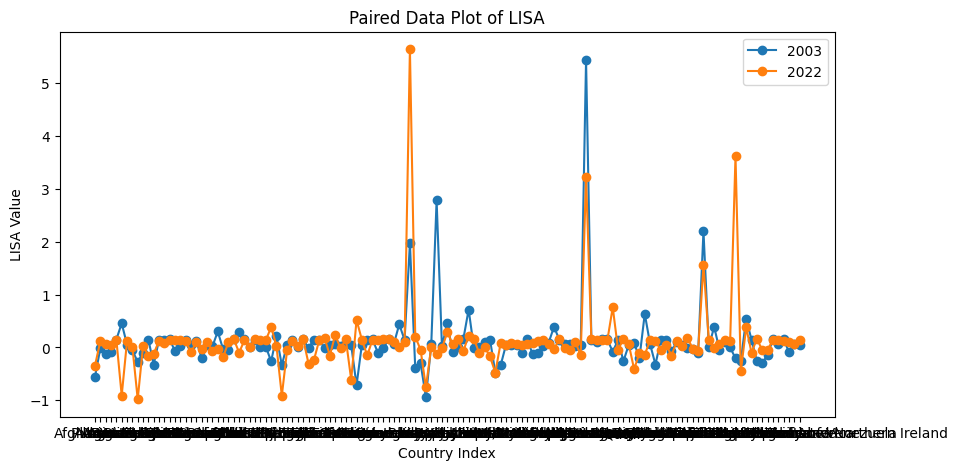

In [169]:
# Calculate the differences
differences = np.array(lisa_2022_aligned) - np.array(lisa_2003_aligned)

# Summarize the differences
mean_diff = np.mean(differences)
median_diff = np.median(differences)
std_diff = np.std(differences)

#print(f"Differences between 2022 and 2003: {differences}")
print(f"Mean difference: {mean_diff}")
print(f"Median difference: {median_diff}")
print(f"Standard deviation of differences: {std_diff}")

# Further analysis
positive_changes = np.sum(differences > 0)
negative_changes = np.sum(differences < 0)
no_changes = np.sum(differences == 0)

print(f"Number of positive changes: {positive_changes}")
print(f"Number of negative changes: {negative_changes}")
print(f"Number of no changes: {no_changes}")

# Visualization

# Paired Differences Plot
plt.figure(figsize=(10, 5))
plt.scatter(range(len(differences)), differences, marker='o')
plt.axhline(0, color='red', linestyle='--')
plt.title('Paired LISA Differences Plot')
plt.xlabel('Pair Index')
plt.ylabel('Difference (2022 - 2003)')
plt.show()

# Histogram of Differences
plt.figure(figsize=(10, 5))
sns.histplot(differences, kde=True)
plt.title('Histogram of LISA Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.ylabel('Frequency')
plt.show()

# Box Plot of Differences
plt.figure(figsize=(10, 5))
sns.boxplot(data=differences)
plt.title('Box Plot of LISA Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.show()

# Line Plot of Paired Data
plt.figure(figsize=(10, 5))
plt.plot(lisa_2003_aligned, label='2003', marker='o')
plt.plot(lisa_2022_aligned, label='2022', marker='o')
plt.legend()
plt.title('Paired Data Plot of LISA')
plt.xlabel('Country Index')
plt.ylabel('LISA Value')
plt.show()

In [170]:
# Calculate absolute differences
differences = lisa_2022_aligned - lisa_2003_aligned
print(differences[differences > 0.5])

Country
Czech Republic                0.649251
Germany                       1.235163
Iran (Islamic Republic of)    3.676077
Iraq                          0.596699
Poland                        0.843585
Turkey                        3.827903
dtype: float64


In [171]:
print(differences[differences < -0.5])

Country
Armenia                -1.366539
Azerbaijan             -0.707318
Denmark                -0.579633
Georgia                -0.656551
Jordan                 -2.901890
Pakistan               -2.214353
Russian Federation     -0.501054
Saudi Arabia           -0.774644
Syrian Arab Republic   -0.642484
dtype: float64


# Below, we compare original (=non-clustered) destination data.

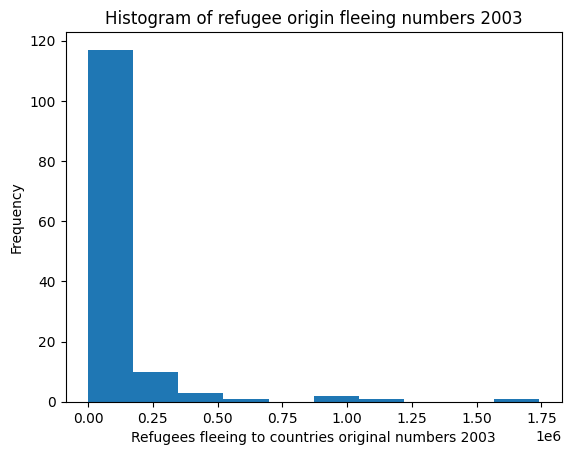

In [172]:
plt.hist(geoworld_destinations[2003]['#refugees_destination'])
plt.xlabel('Refugees fleeing to countries original numbers 2003') 
plt.ylabel('Frequency')  
plt.title('Histogram of refugee origin fleeing numbers 2003')  
plt.show()

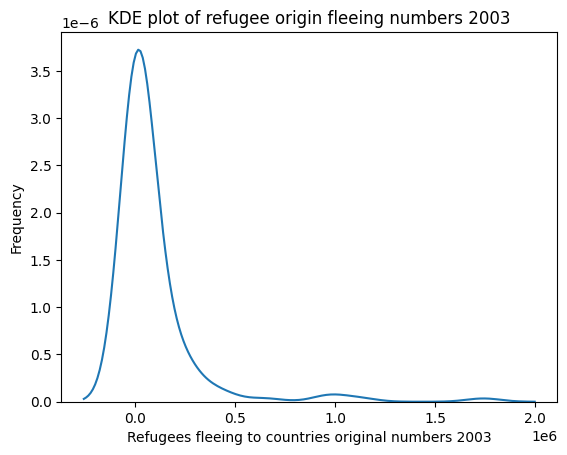

In [173]:
sns.kdeplot(geoworld_destinations[2003]['#refugees_destination'])
plt.xlabel('Refugees fleeing to countries original numbers 2003') 
plt.ylabel('Frequency')  
plt.title('KDE plot of refugee origin fleeing numbers 2003')  
plt.show()

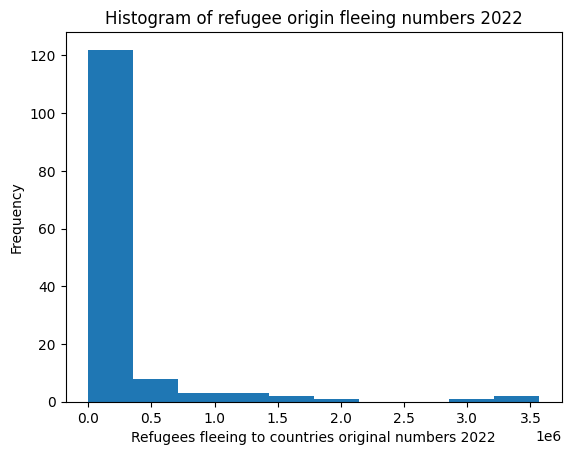

In [174]:
plt.hist(geoworld_destinations[2022]['#refugees_destination'])
plt.xlabel('Refugees fleeing to countries original numbers 2022') 
plt.ylabel('Frequency')  
plt.title('Histogram of refugee origin fleeing numbers 2022')  
plt.show()

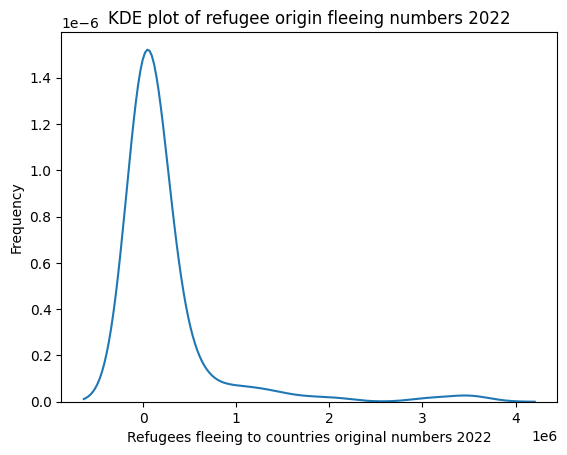

In [175]:
sns.kdeplot(geoworld_destinations[2022]['#refugees_destination'])
plt.xlabel('Refugees fleeing to countries original numbers 2022') 
plt.ylabel('Frequency')  
plt.title('KDE plot of refugee origin fleeing numbers 2022')  
plt.show()

Clearly, the data is not normally distributed.

In [176]:
from scipy.stats import pearsonr, wilcoxon

# Check data length consistency and extract drought indicator values
if 2003 in geoworld_destinations and 2022 in geoworld_destinations:
    df_2003 = geoworld_destinations[2003]
    df_2022 = geoworld_destinations[2022]
    
    # Ensure equal length of data
    common_countries = df_2003.index.intersection(df_2022.index)
    refugees_destination_2003 = df_2003.loc[common_countries, '#refugees_destination']
    refugees_destination_2022 = df_2022.loc[common_countries, '#refugees_destination']
    
    # Verify length
    if len(refugees_destination_2003) == len(refugees_destination_2022):        
        # Calculate correlation between refugee destination values of 2003 and 2022
        correlation_refugee_destination = np.corrcoef(refugees_destination_2003, refugees_destination_2022)[0, 1]
        print(f"Pearson correlation between 2003 and 2022 refugee destination values: {correlation_refugee_destination}")
        # Kendall correlation
        kendall_corr, kendall_p = kendalltau(refugees_destination_2003, refugees_destination_2022)
        print(f"Kendall correlation between 2003 and 2022 refugee destination values: {kendall_corr}, p = {kendall_p}")
        
        # Perform Wilcoxon Signed-Rank Test
        wilcoxon_stat, wilcoxon_pval = wilcoxon(refugees_destination_2003, refugees_destination_2022)
        print(f"Wilcoxon Signed-Rank Test Statistic: {wilcoxon_stat}, p-value: {wilcoxon_pval}")
        # Interpret the Wilcoxon test result
        alpha = 0.05
        if wilcoxon_pval < alpha:
            print("The difference in number of refugees at destination locations between 2003 and 2022 is statistically significant.")
        else:
            print("The difference in number of refugees at destination locations between 2003 and 2022 is not statistically significant.")
    else:
        print("Error: Datasets for 2003 and 2022 have different lengths.")
else:
    print("Error: Data for 2003 or 2022 not found in geoworld_destinations.")

Pearson correlation between 2003 and 2022 refugee destination values: 0.6859287471152871
Kendall correlation between 2003 and 2022 refugee destination values: 0.34170797070207976, p = 5.432668622340087e-09
Wilcoxon Signed-Rank Test Statistic: 2251.5, p-value: 7.430785559190349e-07
The difference in number of refugees at destination locations between 2003 and 2022 is statistically significant.


In [177]:
refugees_destination_2003.mean()

90615.15789473684

In [178]:
refugees_destination_2022.mean()

243832.7142857143

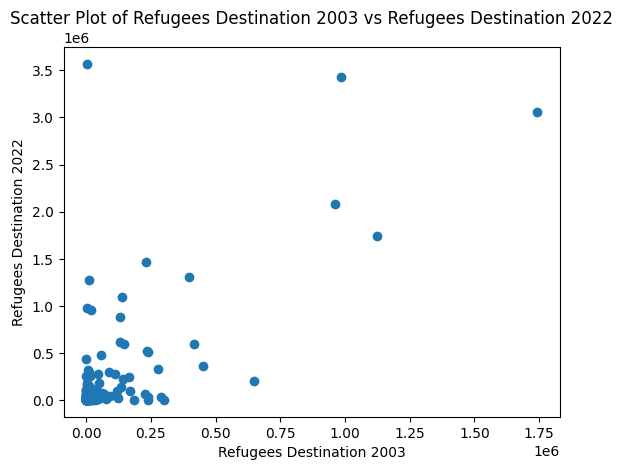

In [179]:
plt.scatter(refugees_destination_2003, refugees_destination_2022)
plt.xlabel('Refugees Destination 2003') 
plt.ylabel('Refugees Destination 2022')  
plt.title('Scatter Plot of Refugees Destination 2003 vs Refugees Destination 2022') 
plt.show()

Mean difference: 153217.55639097744
Median difference: 7533.0
Standard deviation of differences: 461661.6279482797
Number of positive changes: 91
Number of negative changes: 42
Number of no changes: 0


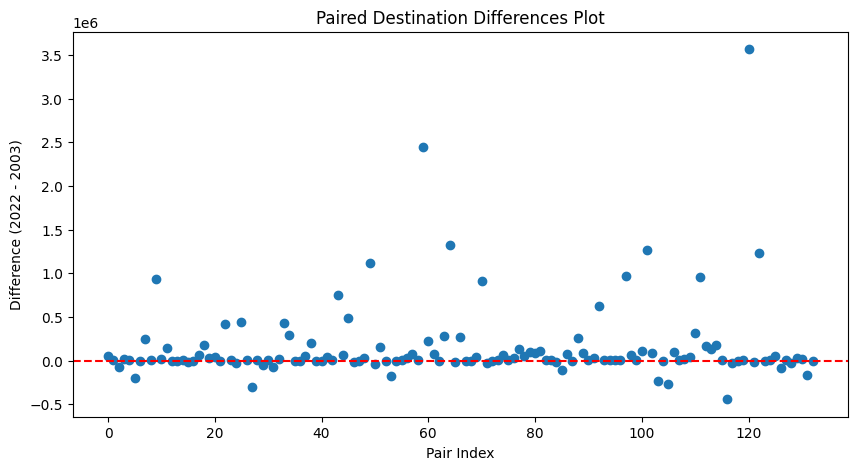

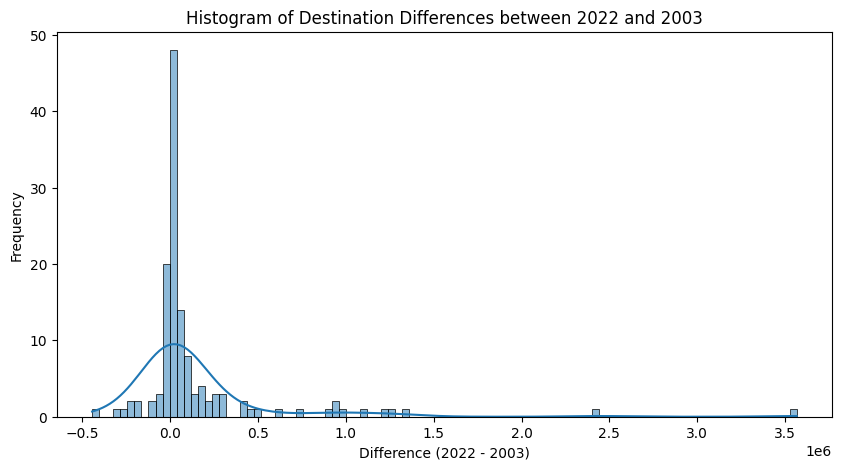

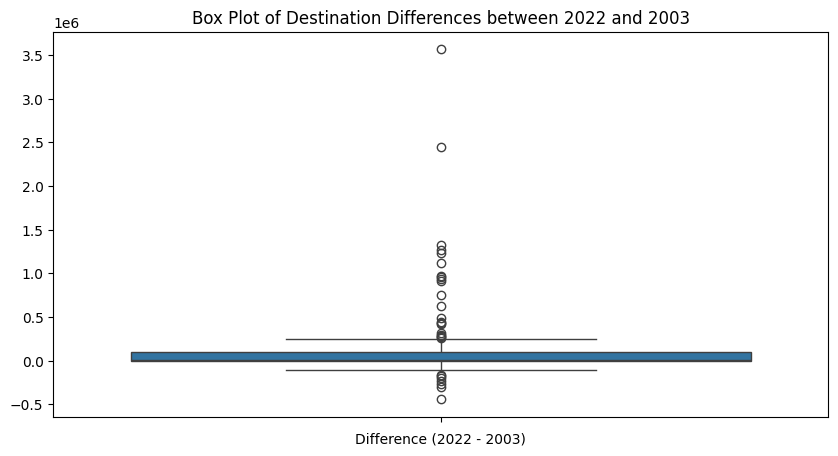

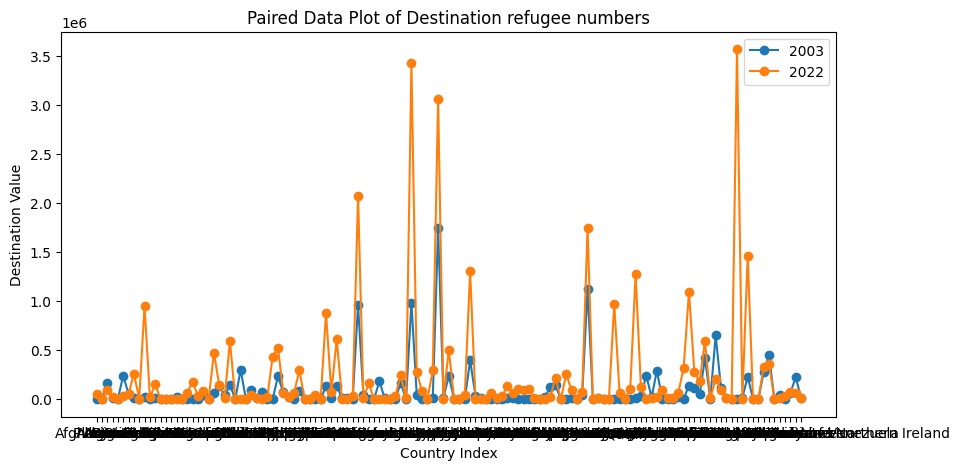

In [180]:
# Calculate the differences
differences = np.array(refugees_destination_2022) - np.array(refugees_destination_2003)

# Summarize the differences
mean_diff = np.mean(differences)
median_diff = np.median(differences)
std_diff = np.std(differences)

#print(f"Differences between 2022 and 2003: {differences}")
print(f"Mean difference: {mean_diff}")
print(f"Median difference: {median_diff}")
print(f"Standard deviation of differences: {std_diff}")

# Further analysis
positive_changes = np.sum(differences > 0)
negative_changes = np.sum(differences < 0)
no_changes = np.sum(differences == 0)

print(f"Number of positive changes: {positive_changes}")
print(f"Number of negative changes: {negative_changes}")
print(f"Number of no changes: {no_changes}")

# Visualization

# Paired Differences Plot
plt.figure(figsize=(10, 5))
plt.scatter(range(len(differences)), differences, marker='o')
plt.axhline(0, color='red', linestyle='--')
plt.title('Paired Destination Differences Plot')
plt.xlabel('Pair Index')
plt.ylabel('Difference (2022 - 2003)')
plt.show()

# Histogram of Differences
plt.figure(figsize=(10, 5))
sns.histplot(differences, kde=True)
plt.title('Histogram of Destination Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.ylabel('Frequency')
plt.show()

# Box Plot of Differences
plt.figure(figsize=(10, 5))
sns.boxplot(data=differences)
plt.title('Box Plot of Destination Differences between 2022 and 2003')
plt.xlabel('Difference (2022 - 2003)')
plt.show()

# Line Plot of Paired Data
plt.figure(figsize=(10, 5))
plt.plot(refugees_destination_2003, label='2003', marker='o')
plt.plot(refugees_destination_2022, label='2022', marker='o')
plt.legend()
plt.title('Paired Data Plot of Destination refugee numbers')
plt.xlabel('Country Index')
plt.ylabel('Destination Value')
plt.show()

In [181]:
# Calculate absolute differences
differences = refugees_destination_2022 - refugees_destination_2003
print(differences[differences > 100000])

Country
Austria                          242516
Bangladesh                       932593
Belgium                          138825
Bulgaria                         172250
Cameroon                         415304
Chad                             446368
Czech Republic                   433696
Democratic Republic of Congo     286511
Egypt                            205887
Ethiopia                         749324
France                           482096
Germany                         1115052
Greece                           157999
Iran (Islamic Republic of)      2440196
Iraq                             226995
Italy                            283369
Jordan                          1321486
Kenya                            266964
Lebanon                          909092
Malaysia                         127132
Mauritania                       100506
Republic of Moldova              105277
Niger                            254974
Pakistan                         619490
Poland                          

In [182]:
print(differences[differences < -100000])

Country
Armenia                       -204655
China                         -299027
Guinea                        -182140
Nepal                         -104102
Saudi Arabia                  -240377
Serbia                        -264876
United Republic of Tanzania   -443541
Zambia                        -165538
Name: #refugees_destination, dtype: int64
